In [10]:
import numpy
import numpy as np
import time
import datetime
import netCDF4
import matplotlib.pylab as plt
import os,sys,glob
sys.path.append(os.getcwd()+'/../adjust/rasotools/')
from utils import *
from multiprocessing import Pool
#import odb
from eccodes import *
from functools import partial
from collections import OrderedDict
import subprocess
import json
import gzip
# from retrieve_fb_jra55 import add_feedback
import copy
import pickle

import pandas as pd
import matplotlib.pylab as plt
import matplotlib.pyplot as maplt

plt.rcParams['lines.linewidth'] = 3

import warnings
warnings.filterwarnings('ignore')

In [2]:
eccodes.codes_bufr_keys_iterator_delete

<function gribapi.gribapi.codes_bufr_keys_iterator_delete(iterid)>

In [3]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeRegressor

# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import LSTM
model_rf = RandomForestRegressor(max_depth=10, 
                                 random_state=0,
                                 bootstrap=True,
                                 max_samples=0.965,
                             )

model_dt = DecisionTreeRegressor(max_depth=10)

In [4]:
def calc_height(t, p, jump = False):
    '''
    isotherm height formular
    z = -R*t0/g * ln(p/p0)
    z = -287.053*t0/9.80665 * ln(p/p0)
    
    polytrop height forumular
    z = t0/L * ((p/p0)**(-L*R/g) -1)
    L = −0.0065 K/m
    R = 287.053 J/(kg K)
    g = 9.80665 m/s2
    z = t0/−0.0065 * ((p/p0)**(0.0065*287.053/9.80665) -1)
    
    international height formular
    z = 288.15/0.0065 * (1- (p/1013.25)**(1/5.255))
    
    '''
    # from: https://www.cesm.ucar.edu/models/cesm1.1/cesm/cesmBbrowser/html_code/cam/tropopause.F90.html
    SHR_CONST_AVOGAD  = 6.02214e26
    SHR_CONST_BOLTZ   = 1.38065e-23
    SHR_CONST_MWDAIR  = 28.966
    SHR_CONST_RGAS    = SHR_CONST_AVOGAD*SHR_CONST_BOLTZ
    SHR_CONST_RDAIR   = SHR_CONST_RGAS/SHR_CONST_MWDAIR
    rair = SHR_CONST_RDAIR

    SHR_CONST_G       = 9.80616
    gravit = SHR_CONST_G

    SHR_CONST_CPDAIR  = 1.00464e3
    cappa        = (SHR_CONST_RGAS/SHR_CONST_MWDAIR)/SHR_CONST_CPDAIR
    cnst_kap = cappa

    cnst_faktor = -gravit/rair
    cnst_ka1    = cnst_kap - 1.
        
    z = []
    for i in range(len(t)):
        
        if i == 0:
            L = -0.0065
            height = t[i]/L * ((p[i]/101325)**(-L*287.053/9.80665) -1)
            z.append(height)
        else:
            if jump:
                if z[i-1] < 11000:
                    L = -0.0065
                else:
                    L = -0.001
            else:                    
                # dt/dz
                pmk= .5 * (p[i-1]**cnst_kap+p[i]**cnst_kap)
                pm = pmk**(1/cnst_kap)               
                a = (t[i-1]-t[i])/(p[i-1]**cnst_kap-p[i]**cnst_kap)
                b = t[i]-(a*p[i]**cnst_kap)
                tm = a * pmk + b               
                dtdp = a * cnst_kap * (pm**cnst_ka1)
                L = cnst_faktor*dtdp*pm/tm # dtdz
#                 if not ((L < 0.05) and (L > -0.05)):
#                     L = -0.0065
                if L == 0:
                    L = -0.001

            height = t[i-1]/L * ((p[i]/p[i-1])**(-L*287.053/9.80665) -1)
            if np.isnan(height):
                print('p: ', p[i])
                print('p-1: ', p[i-1])
                print('t: ', t[i])
                print('t-1: ', t[i-1])
                print('L: ', L)
                z.append(z[-1])
            else:
                z.append(z[-1] + height)
    return z




        

# to gpm
from scipy.integrate import quad

def integrand(x):
    return (6371000 / (6371000 + x))**2
def expint(x):
    return quad(integrand, 0, x,)[0]


In [5]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1 = numpy.radians(lon1)
    lat1 = numpy.radians(lat1)
    lon2 = numpy.radians(lon2)
    lat2 = numpy.radians(lat2)

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles. Determines return value units.
    return c * r

In [6]:
def inverse_haversine(lat, lon, distance, direction):
    '''
    distance: [km]
    '''
    lat = numpy.radians(lat)
    lon = numpy.radians(lon)
    d = numpy.array(distance)
    r = 6371 #[km]
    if direction == "NORTH":
        brng = 0.
    elif direction == "EAST":
        brng = 1.5707963267948966
    else:
        return "error - not a valid direction"
    return_lat = numpy.arcsin(numpy.sin(lat) * numpy.cos(d / r) + numpy.cos(lat) * numpy.sin(d / r) * numpy.cos(brng))
    return_lon = lon + numpy.arctan2(numpy.sin(brng) * numpy.sin(d / r) * numpy.cos(lat), numpy.cos(d / r) - numpy.sin(lat) * numpy.sin(return_lat))

    return numpy.degrees(return_lat), numpy.degrees(return_lon)

In [7]:
# from haversine import inverse_haversine, Direction
def transport(lat, lon, u_dist, v_dist):
    '''
    dist: [km]
    '''
    new_lat, new_lon = inverse_haversine(lat, lon, u_dist, "EAST")
    new_lat, new_lon = inverse_haversine(new_lat, new_lon, v_dist, "NORTH")
    return new_lat, new_lon

In [8]:
# def trajectory(lat, lon, u, v, pressure, temperature, w_rs = 5.0, wind = 'mean', factor = 1, u_factor = None, v_factor = None, z_variant = 'jump'):
#     '''
#     w_rs -> radio sonde rising speed
#     '''
#     if ((u_factor == None) and (v_factor == None)):
#         u_factor = factor
#         v_factor = factor
    
#     if z_variant == 'jump':
#         z = calc_height(temperature, pressure, jump = True) # m from K and Pa
#     elif z_variant == 'ucar': 
#         z = calc_height(temperature, pressure, jump = False) # m from K and Pa
# #     print(temperature, pressure)
# #     vec_expint = numpy.vectorize(expint)
# #     z = vec_expint(z)
    
#     lat_displacement = [0.]
#     lon_displacement = [0.]
    
#     for i in range(len(z)):
#         if i == 0:
#             new_lat = lat
#             new_lon = lon
#         else:
#             rising_time = (z[i]-z[i-1]) / w_rs
# #             print(z[i], z[i-1], z[i]-z[i-1], rising_time)
#             status = 400
# #             match wind:
# #                 case 'mean':
# #                     new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000., (np.mean([v[i],v[i-1]]) * rising_time)/1000.)
# #                 case 'upper':
# #                     new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000., (v[i] * rising_time)/1000.)
# #                 case 'lower':
# #                     new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000., (v[i-1] * rising_time)/1000.) 
# #                 case _:
# #                     print('error: not a valid wind request')
#             if wind == 'mean':
#                 new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000. * u_factor, (np.mean([v[i],v[i-1]]) * rising_time)/1000. * v_factor)
#             elif wind == 'upper':
#                 new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000. * u_factor, (v[i] * rising_time)/1000. * v_factor)
#             elif wind == 'lower':
#                 new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000. * u_factor, (v[i-1] * rising_time)/1000. * v_factor) 
#             else:
#                 print('error: not a valid wind request')


            
#             lat_displacement.append(lon - new_lon)
#             lon_displacement.append(lat - new_lat)
# #         lat_displacement.append(new_lat)
# #         lon_displacement.append(new_lon)

#     return lat_displacement, lon_displacement


In [9]:
def trajectory(lat, lon, u, v, pressure, temperature, w_rs = 5.0, wind = 'mean', factor = 1, u_factor = None, v_factor = None, z_variant = 'jump'):
    '''
    w_rs -> radio sonde rising speed
    '''
    if ((u_factor == None) and (v_factor == None)):
        u_factor = factor
        v_factor = factor
    
    if z_variant == 'jump':
        z = calc_height(temperature, pressure, jump = True) # m from K and Pa
    elif z_variant == 'ucar': 
        z = calc_height(temperature, pressure, jump = False) # m from K and Pa
#     print(temperature, pressure)
#     vec_expint = numpy.vectorize(expint)
#     z = vec_expint(z)
    
    lat_displacement = [0.]
    lon_displacement = [0.]
    
    u_shear=[0.]
    v_shear=[0.]
    
    for i in range(len(z)):
        if i == 0:
            new_lat = lat
            new_lon = lon
        else:
            rising_time = (z[i]-z[i-1]) / w_rs
#             print(z[i], z[i-1], z[i]-z[i-1], rising_time)
#             match wind:
#                 case 'mean':
#                     new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000., (np.mean([v[i],v[i-1]]) * rising_time)/1000.)
#                 case 'upper':
#                     new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000., (v[i] * rising_time)/1000.)
#                 case 'lower':
#                     new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000., (v[i-1] * rising_time)/1000.) 
#                 case _:
#                     print('error: not a valid wind request')
            u_shear.append(u[i]-u[i-1])
            v_shear.append(v[i]-v[i-1])
            if (u_factor != 1) and (v_factor != 1):
                u_factor = 1 +(u[i]-u[i-1])
                v_factor = 1 +(v[i]-v[i-1])

            if wind == 'mean':
                new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000. * u_factor, (np.mean([v[i],v[i-1]]) * rising_time)/1000. * v_factor)
            elif wind == 'upper':
                new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000. * u_factor, (v[i] * rising_time)/1000. * v_factor)
            elif wind == 'lower':
                new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000. * u_factor, (v[i-1] * rising_time)/1000. * v_factor) 
            else:
                print('error: not a valid wind request')


            
            lat_displacement.append(lon - new_lon)
            lon_displacement.append(lat - new_lat)
#         lat_displacement.append(new_lat)
#         lon_displacement.append(new_lon)

    return lat_displacement, lon_displacement, np.array(u_shear), np.array(v_shear)


---
---
---

# Different factors for wind to distance calculation - different for u and v

In [10]:
def par_read_bufr_stn_nofeedback(varno,bufrfile):
    alldata=''
    alldict=dict()

    bufrlist=[]
    tx=time.time()
#     try:
    f = open(bufrfile)
    print(f)
    cnt = 0
    output = {}
    # loop over the messages in the file
    bc = 0
    
    df={}
    df['temperature']=[]
    df['pressure']=[]
    df['u']=[]
    df['v']=[]
    df['latd']=[]
    df['lond']=[]
    df['lat']=[]
    df['lon']=[]
    df['calc_latd']=[]
    df['calc_lond']=[]
    df['z']=[]
    df['u_shear'] = []
    df['v_shear'] = []
    
    rmse_total_lat = []
    rmse_total_lon = []
    rmse_total_lat_1 = []
    rmse_total_lon_1 = []
    
    rmse_sum_lon_1={}
    rmse_sum_lat_1={}
    rmse_sum_lon_2={}
    rmse_sum_lat_2={}
    rms_sum_lon_0={}
    rms_sum_lat_0={}

#     rms_sum_lon_1={}
#     rms_sum_lat_1={}
#     rms_sum_lon_2={}
#     rms_sum_lat_2={}
    stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]

    for i in stdplevs:
        rmse_sum_lon_1[i] = []
        rmse_sum_lat_1[i] = []
        rmse_sum_lon_2[i] = []
        rmse_sum_lat_2[i] = []
        rms_sum_lon_0[i] = []
        rms_sum_lat_0[i] = []
#         rms_sum_lon_1[i] = []
#         rms_sum_lat_1[i] = []
#         rms_sum_lon_2[i] = []
#         rms_sum_lat_2[i] = []
        
    while 1:
        try:
            # get handle for message
            bufr = codes_bufr_new_from_file(f)
            if bufr is None:
                break
            # we need to instruct ecCodes to expand all the descriptors
            # i.e. unpack the data section
    #         print (codes_get_array(bufr,'dataSubCategory'))
            if codes_get_array(bufr,'dataSubCategory')[0]!=109:
    #             print('not 109')
                codes_release(bufr)
                continue
            codes_set(bufr, 'unpack', 1)
            # get all the timePeriods
            iterid = codes_bufr_keys_iterator_new(bufr)

            hires=False
            while codes_bufr_keys_iterator_next(iterid):

    #             print key name
                keyname = codes_bufr_keys_iterator_get_name(iterid)
        
                if 'latitudeDisplacement' in keyname:
                    hires=True
            
            if not hires:
                codes_bufr_keys_iterator_delete(iterid)
                codes_release(bufr)
                continue
            ## delete the key iterator
            codes_bufr_keys_iterator_delete(iterid)
            output['datum'] = float('19'+codes_get_array(bufr, "typicalDate")[0][2:])
            output['timePeriod'] = float(codes_get_array(bufr, "typicalTime")[0])
            output['pressure'] = codes_get_array(bufr, "pressure")
            output['extendedVerticalSoundingSignificance'] = codes_get_array(bufr, "extendedVerticalSoundingSignificance")
            output['geopotentialHeight'] = codes_get_array(bufr, "nonCoordinateGeopotentialHeight")
            output['latitudeDisplacement'] = codes_get_array(bufr, "latitudeDisplacement")
            output['longitudeDisplacement'] = codes_get_array(bufr, "longitudeDisplacement")
            output['airTemperature'] = codes_get_array(bufr, "airTemperature")
            dewpointTemperature = codes_get_array(bufr, "dewpointTemperature")
            output['windDirection'] = codes_get_array(bufr, "windDirection")
            output['windSpeed'] = codes_get_array(bufr, "windSpeed")
            output['lat'] = codes_get(bufr, "latitude")
            output['lon'] = codes_get(bufr, "longitude")
            output['alt'] = float(codes_get(bufr, "heightOfStation"))
            output['blockNumber'] = codes_get(bufr, "blockNumber")
            output['stationNumber'] = codes_get(bufr, "stationNumber")
            
            try:
                data = pd.DataFrame.from_dict(output)
                cont = True
            except:
                print('pandas error')
                cont = False
            if cont:
                if data.pressure[0] < 40000:
                    u = data.windSpeed * numpy.cos(np.radians(data.windDirection))
                    data['u'] = u
                    v = data.windSpeed * numpy.sin(np.radians(data.windDirection))
                    data['v'] = v
                    data = data[data.airTemperature < 350]
                    data = data[data.airTemperature > 180]
                    data = data.drop_duplicates(['pressure'])

                    true_latd = data.latitudeDisplacement
                    true_lond = data.longitudeDisplacement
                    
                    lat_displacement_100, lon_displacement_100, us, vs = trajectory(np.array(data.lat)[0], np.array(data.lon)[0], np.array(data.u), np.array(data.v), np.array(data.pressure), np.array(data.airTemperature), z_variant='ucar', factor=1)
                    lat_displacement_test1, lon_displacement_test1, us1, vs1 = trajectory(np.array(data.lat)[0], np.array(data.lon)[0], np.array(data.u), np.array(data.v), np.array(data.pressure), np.array(data.airTemperature), z_variant='ucar', u_factor=0.83, v_factor = 1.15)

    #                 reduced = data[numpy.isin(data.pressure, [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000])]
    #                 reduced_lat_displacement, reduced_lon_displacement = trajectory(np.array(reduced.lat)[0], np.array(reduced.lon)[0], np.array(reduced.u), np.array(reduced.v), np.array(reduced.pressure), np.array(reduced.airTemperature))
            #
                    rmse_total_lat.append(np.sqrt(np.nanmean((np.array(lat_displacement_100)-true_latd)**2)))
                    rmse_total_lon.append(np.sqrt(np.nanmean((np.array(lon_displacement_100)-true_lond)**2)))
                    if (rmse_total_lat[-1] > 3) or (rmse_total_lon[-1] > 3):
                        codes_release(bufr)
                        print('not a valid station')
                        continue


                    print(output['lat'], output['lon'], output['datum'], output['timePeriod'])
                    for i in range(len(stdplevs)):
                        if i > 0:
                            b = np.array(true_latd)
                            c = np.array(true_lond)
                            b[data.pressure < stdplevs[i]] = np.nan
                            c[data.pressure >= stdplevs[i-1]] = np.nan
                            b[data.pressure < stdplevs[i]] = np.nan
                            c[data.pressure >= stdplevs[i-1]] = np.nan
                            rms_sum_lat_0[stdplevs[i]].append( np.nanmean(b[~np.isnan(b)]))
                            rms_sum_lon_0[stdplevs[i]].append( np.nanmean(c[~np.isnan(c)]))

                            a = np.array(lon_displacement_100)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lon_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_lond[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lon_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))

                            a = np.array(lat_displacement_100)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lat_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_latd[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lat_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))

                            a = np.array(lon_displacement_test1)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lon_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_lond[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lon_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))
    #                         
                            a = np.array(lat_displacement_test1)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lat_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_latd[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lat_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))

    #                 fig, ax1 = maplt.subplots()
    #                 ax1.plot(data.pressure,np.array(lat_displacement_100),color = 'blue', label='calc lat disp 100')
    #                 ax1.plot(data.pressure,np.array(lon_displacement_100),color = 'red', label='calc lon disp 100')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lat_displacement),color = 'cyan', alpha = 0.7, label='reduced calc lat disp')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lon_displacement),color = 'orange', alpha = 0.7, label='reduced calc lon disp')
    #                 ax1.plot(data.pressure,data.latitudeDisplacement,color = 'blue', alpha = 0.3, label='original lat disp')
    #                 ax1.plot(data.pressure,data.longitudeDisplacement, color = 'red', alpha = 0.3, label='original lon disp')
    #                 ax1.set_xlabel('pressure (Pa)')
    #                 ax1.set_ylabel('displacement (°)')
    #                 ax1.tick_params(axis='y')

    # #                 ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    # # #                 ax2.plot(data.pressure,data.airTemperature,color = 'orange', label='temperature')
    # # #                 ax2.set_ylabel('temperature (K)')  # we already handled the x-label with ax1
    # #                 ax2.plot(data.pressure,data.u, label='u')
    # #                 ax2.plot(data.pressure,data.v, label='v')
    # #                 ax2.set_ylabel('u/v (m/s)')  # we already handled the x-label with ax1
    # #                 ax2.tick_params(axis='y',)

    #                 fig.tight_layout()  # otherwise the right y-label is slightly clipped
    #                 maplt.title('height calc different wind application factors')
    #                 maplt.legend()
    #                 maplt.grid()
    #                 maplt.show()
    #                 maplt.close()

    #                 print('lat disp rmse: ',rmse_total_lat[-1])
    #                 print('lon disp rmse: ',rmse_total_lon[-1])


    #                 fig, ax1 = maplt.subplots()
    #                 ax1.plot(data.pressure,np.array(lat_displacement_test1),color = 'blue', label='calc lat disp test1')
    #                 ax1.plot(data.pressure,np.array(lon_displacement_test1),color = 'red', label='calc lon disp test1')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lat_displacement),color = 'cyan', alpha = 0.7, label='reduced calc lat disp')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lon_displacement),color = 'orange', alpha = 0.7, label='reduced calc lon disp')
    #                 ax1.plot(data.pressure,data.latitudeDisplacement,color = 'blue', alpha = 0.3, label='original lat disp')
    #                 ax1.plot(data.pressure,data.longitudeDisplacement, color = 'red', alpha = 0.3, label='original lon disp')
    #                 ax1.set_xlabel('pressure (Pa)')
    #                 ax1.set_ylabel('displacement (°)')
    #                 ax1.tick_params(axis='y')

    # #                 ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    # # #                 ax2.plot(data.pressure,data.airTemperature,color = 'orange', label='temperature')
    # # #                 ax2.set_ylabel('temperature (K)')  # we already handled the x-label with ax1
    # #                 ax2.plot(data.pressure,data.u, label='u')
    # #                 ax2.plot(data.pressure,data.v, label='v')
    # #                 ax2.set_ylabel('u/v (m/s)')  # we already handled the x-label with ax1
    # #                 ax2.tick_params(axis='y',)

    #                 fig.tight_layout()  # otherwise the right y-label is slightly clipped
    #                 maplt.title('height calc different wind application factors')
    #                 maplt.legend()
    #                 maplt.grid()
    #                 maplt.show()
    #                 maplt.close()

                    rmse_total_lat_1.append(np.sqrt(np.nanmean((np.array(lat_displacement_test1)-true_latd)**2)))
                    rmse_total_lon_1.append(np.sqrt(np.nanmean((np.array(lon_displacement_test1)-true_lond)**2)))
                    print('lat disp rmse: ',rmse_total_lat_1[-1])
                    print('lon disp rmse: ',rmse_total_lon_1[-1])

                    if ((rmse_total_lat_1[-1] < 3) and (rmse_total_lon_1[-1] < 3)):
                        df['temperature'].append(np.array(data.airTemperature))
                        df['pressure'].append(np.array(data.pressure))
                        df['u'].append(np.array(data.u))
                        df['v'].append(np.array(data.v))
                        df['latd'].append(np.array(true_latd))
                        df['lond'].append(np.array(true_lond))
                        df['calc_latd'].append(np.array(lat_displacement_100))
                        df['calc_lond'].append(np.array(lon_displacement_100))
                        df['u_shear'].append(np.array(us))
                        df['v_shear'].append(np.array(vs))
                        df['z'].append(np.array(calc_height(np.array(data.airTemperature), np.array(data.pressure))))
                        df['lat'].append(np.array(data.lat))
                        df['lon'].append(np.array(data.lon))



                    print('----------------')
                    bc += 1
        except:
            pass
        if bc > 1000:
            break
        codes_release(bufr)
    
    rmse_lat_1 = []
    rmse_lon_1 = []
    rmse_lat_2 = []
    rmse_lon_2 = []
    
    rms_lat_0 = []
    rms_lon_0 = []
#     rms_lon_1 = []
#     rms_lon_1 = []
#     rms_lat_1 = []
#     rms_lon_1 = []
#     rms_lat_2 = []
#     rms_lon_2 = []
    for i in range(len(stdplevs)):
        if i > 0:
            rmse_lat_1.append(np.sqrt(np.nanmean((np.array(rmse_sum_lat_1[stdplevs[i]])**2))))
            print('Latitude Displacement data set 1 - plev: ', stdplevs[i], ' RMSE: ', rmse_lat_1[-1])
            rmse_lon_1.append(np.sqrt(np.nanmean((np.array(rmse_sum_lon_1[stdplevs[i]])**2))))
            print('Longitude Displacement data set 1 - plev: ', stdplevs[i], ' RMSE: ', rmse_lon_1[-1])
            rmse_lat_2.append(np.sqrt(np.nanmean((np.array(rmse_sum_lat_2[stdplevs[i]])**2))))
            print('Latitude Displacement data set 2 - plev: ', stdplevs[i], ' RMSE: ', rmse_lat_2[-1])
            rmse_lon_2.append(np.sqrt(np.nanmean((np.array(rmse_sum_lon_2[stdplevs[i]])**2))))
            print('Longitude Displacement data set 2 - plev: ', stdplevs[i], ' RMSE: ', rmse_lon_2[-1])
            
            rms_lat_0.append(np.sqrt(np.nanmean((np.array(rms_sum_lat_0[stdplevs[i]])**2))))
            print('Latitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lat_1[-1])
            rms_lon_0.append(np.sqrt(np.nanmean((np.array(rms_sum_lon_0[stdplevs[i]])**2))))
            print('Longitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lon_1[-1])

            
#             rms_lat_1.append(np.sqrt(np.nanmean((np.array(rms_sum_lat_1[stdplevs[i]])**2))))
#             print('Latitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lat_1[-1])
#             rms_lon_1.append(np.sqrt(np.nanmean((np.array(rms_sum_lon_1[stdplevs[i]])**2))))
#             print('Longitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lon_1[-1])
#             rms_lat_2.append(np.sqrt(np.nanmean((np.array(rms_sum_lat_2[stdplevs[i]])**2))))
#             print('Latitude Displacement data set 2 - plev: ', stdplevs[i], ' RMS: ', rmse_lat_2[-1])
#             rms_lon_2.append(np.sqrt(np.nanmean((np.array(rms_sum_lon_2[stdplevs[i]])**2))))
#             print('Longitude Displacement data set 2 - plev: ', stdplevs[i], ' RMS: ', rmse_lon_2[-1])
            
    fig, ax1 = maplt.subplots(1, 2, figsize = (15,10))
    ax1[0].plot(stdplevs[1:],np.array(rmse_lat_1),color = 'blue',alpha = 0.3, label='lat RMSE disp 1')
    ax1[0].plot(stdplevs[1:],np.array(rmse_lat_2),color = 'blue', label='lat RMSE disp 2')
    ax1[0].plot(stdplevs[1:],np.array(rms_lat_0),color = 'blue', linestyle = 'dotted', label='lat RMS disp')
#     ax1[0].plot(stdplevs[1:],np.array(rms_lat_1),color = 'blue', linestyle = 'dotted', alpha = 0.3, label='lat RMS disp 1')
#     ax1[0].plot(stdplevs[1:],np.array(rms_lat_2),color = 'blue', linestyle = 'dotted', label='lat RMS disp 2')
    ax1[0].set_xlabel('pressure (Pa)')
    ax1[0].set_ylabel('RMSE/RMS of displacement')
    ax1[0].legend()
    ax1[0].grid()
    maplt.title('LEVEL RMSE/RMS for Displacement')
    ax1[1].plot(stdplevs[1:],np.array(rmse_lon_1),color = 'red',alpha = 0.3, label='lon RMSE disp 1')
    ax1[1].plot(stdplevs[1:],np.array(rmse_lon_2),color = 'red', label='lon RMSE disp 2')
    ax1[1].plot(stdplevs[1:],np.array(rms_lon_0),color = 'red', linestyle = 'dotted', label='lon RMS disp')
#     ax1[1].plot(stdplevs[1:],np.array(rms_lon_1),color = 'red', linestyle = 'dotted', alpha = 0.3, label='lon RMS disp 1')
#     ax1[1].plot(stdplevs[1:],np.array(rms_lon_2),color = 'red', linestyle = 'dotted', label='lon RMS disp 2')
    ax1[1].set_xlabel('pressure (Pa)')
    ax1[1].set_ylabel('RMSE/RMS of displacement')
    ax1[1].legend()
    ax1[1].grid()
    maplt.title('LEVEL RMSE/RMS for Displacement')
    maplt.show()
    maplt.close()
    
#     print('data set 1: ',np.median(rmse_total_lat), np.median(rmse_total_lon))
#     print('data set 2: ',np.median(rmse_total_lat_1), np.median(rmse_total_lon_1))
        
    return output, df #, true_sum_lon, true_sum_lat, rmse_sum_lon, rmse_sum_lat, rmse_sum_lon_1, rmse_sum_lat_1, rmse_sum_lon_2, rmse_sum_lat_2


<_io.TextIOWrapper name='./out.bufr' mode='r' encoding='UTF-8'>
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
43.06 -108.48 19201130.0 230100.0
lat disp rmse:  0.004982582846073363
lon disp rmse:  0.07086076855568725
----------------
pandas error
pandas error
pandas error
35.040000000000006 -106.62 19201130.0 230300.0
lat disp rmse:  0.008540742259022165
lon disp rmse:  0.051666010015191624
----------------
37.760000000000005 -99.97000000000001 19201130.0 230100.0
lat disp rmse:  0.06817462863681398
lon disp rmse:  0.022553128744063445
----------------
40.86000000000001 -115.74000000000001 19201130.0 230300.0
lat disp rmse:  0.054521098330397186
lon disp rmse:  0.09255552801886686
----------------
39.120000000000005 -108.53000000000002 19201130.0 230100.0
lat disp rmse:  0.011617657626388615
lon disp rmse:  0.06943284114807197
----------------
39.42 -83.82000000000001 19201130.0 230500.0
lat disp rmse:  0.041719983697758596
lon 

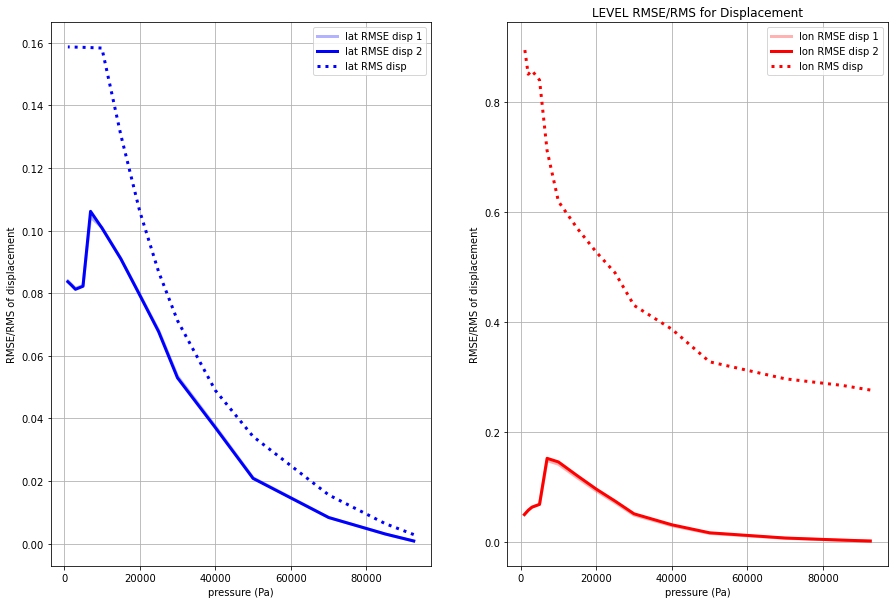

In [11]:
ipath=os.path.expanduser('~leo/ectrans/')
sodblist=glob.glob(ipath+'era5.bufr.202012')
sodblist.sort(key=os.path.getsize)
out, df= par_read_bufr_stn_nofeedback(111, './out.bufr')# sodblist[0])
# #list(map(func,  idx2))
# func = partial(par_read_bufr_stn_nofeedback,111)
# list(map(func,sodblist))

# # exit()

---
# ML
---

In [16]:
try:
    with open("mldf_1000.p", "rb") as input_file:
        mldf = pickle.load(input_file)
except:
    for i in df:
        try:
            df[i]=numpy.concatenate( df[i], axis=0 )
        except:
            pass
    mldf = pd.DataFrame(df)
    mldf.to_pickle('mldf_1000.p')
cut = int(len(mldf)*0.80)
train = mldf[:cut]
test = mldf[cut:]

In [17]:
new = test.reset_index()
testidx = []
for i in range(len(new)):
    if i != 0:
        if new.z[i] < new.z[i-1]:
            print('z[',i-1,']: ', new.z[i-1], 'z[',i,']: ',new.z[i], '')
            testidx.append(i)

z[ 937 ]:  16391.37225293671 z[ 938 ]:  624.1220623083071 
z[ 3912 ]:  16332.912641925399 z[ 3913 ]:  329.00787229232947 
z[ 7010 ]:  16108.260343239239 z[ 7011 ]:  1098.283182405714 
z[ 10128 ]:  16221.72641691975 z[ 10129 ]:  1312.042755168383 
z[ 12995 ]:  16221.594259578515 z[ 12996 ]:  348.80833225731374 
z[ 16158 ]:  16251.894824349964 z[ 16159 ]:  269.0635050520634 
z[ 19373 ]:  16105.211426085301 z[ 19374 ]:  1532.7191652920726 
z[ 22227 ]:  16189.389902039984 z[ 22228 ]:  1027.4616879954262 
z[ 25530 ]:  16311.588188210108 z[ 25531 ]:  1029.0588757063792 
z[ 28768 ]:  16310.93330920281 z[ 28769 ]:  -31.068450102620496 
z[ 32149 ]:  16276.457880961543 z[ 32150 ]:  -19.79459472128724 
z[ 35082 ]:  16234.978681727549 z[ 35083 ]:  812.7997122561849 
z[ 38426 ]:  16281.29080656756 z[ 38427 ]:  529.3218753058477 
z[ 41410 ]:  16298.446517263052 z[ 41411 ]:  401.656065455683 
z[ 44708 ]:  16259.460448757203 z[ 44709 ]:  116.98358927228671 
z[ 47948 ]:  16059.08269444406 z[ 47949 ]:  

---
---

In [20]:
try:
    with open('model_dt_1000.p', "rb") as input_file:
        model_dt = pickle.load(input_file)
    with open('model_dt_wo_coords_1000.p', "rb") as input_file:
        model_dt_wo_coords = pickle.load(input_file)
    print('loading successful')
    
except:
    model_dt = DecisionTreeRegressor()
    model_dt.fit(train[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']], train[['latd', 'lond']])

    model_dt_wo_coords = DecisionTreeRegressor()
    model_dt_wo_coords.fit(train[['temperature', 'pressure', 'u', 'v', 'z','calc_latd', 'calc_lond']], train[['latd', 'lond']])

    
    with open("model_dt_1000.p", "wb") as output_file:
        pickle.dump(model_dt, output_file)
    with open("model_dt_wo_coords_1000.p", "wb") as output_file:
        pickle.dump(model_dt_wo_coords, output_file)

loading successful


In [22]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

In [ ]:

for i in stdplevs:
    

[92500.0, 84980.0, 69990.0, 49990.0, 39990.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


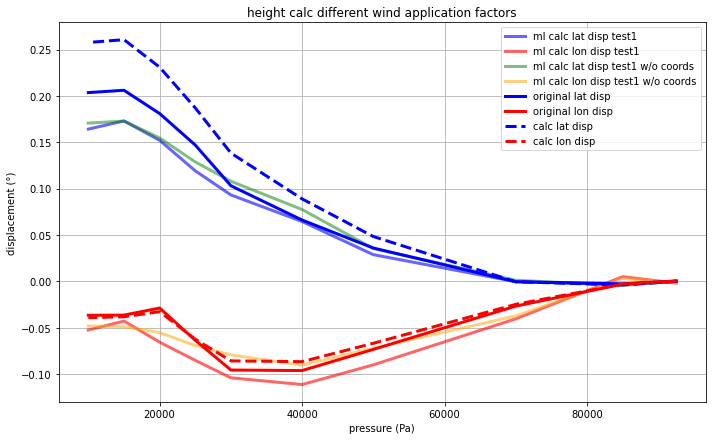

lat disp rmse:  0.020992394262966778
lon disp rmse:  0.01719025054921827
lat disp rmse w/o coords:  0.018353770522535146
lon disp rmse w/o coords:  0.012164319028307686
[92500.0, 84980.0, 69980.0, 49990.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


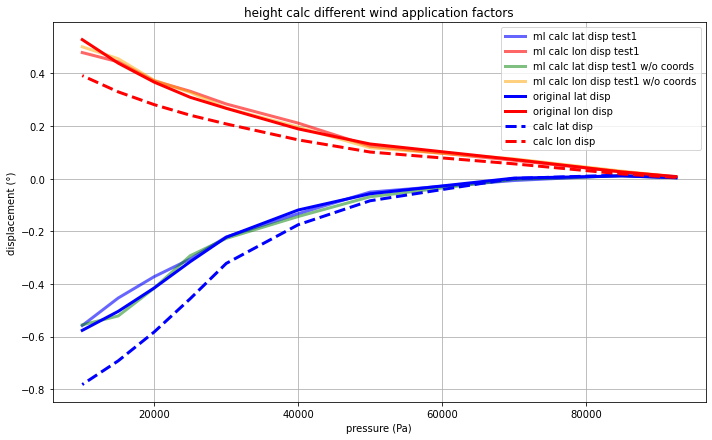

lat disp rmse:  0.02276284255975083
lon disp rmse:  0.019545054415428312
lat disp rmse w/o coords:  0.014248666416152035
lon disp rmse w/o coords:  0.012986735293037852
[85010.0, 70010.0, 50010.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


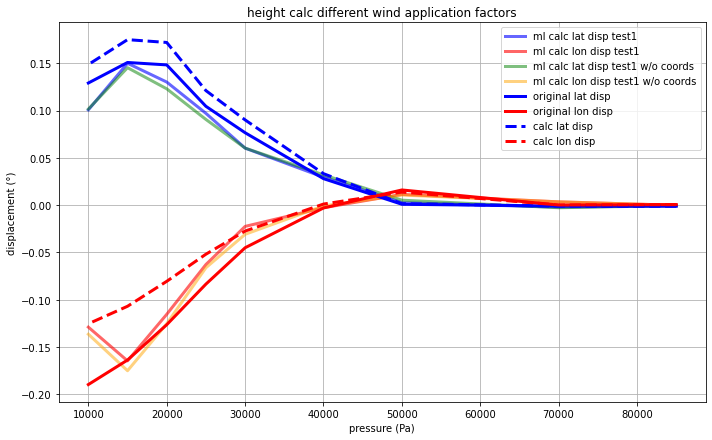

lat disp rmse:  0.012748721033269633
lon disp rmse:  0.02304548234635102
lat disp rmse w/o coords:  0.014618987719126765
lon disp rmse w/o coords:  0.019743642726428406
[85020.0, 70010.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


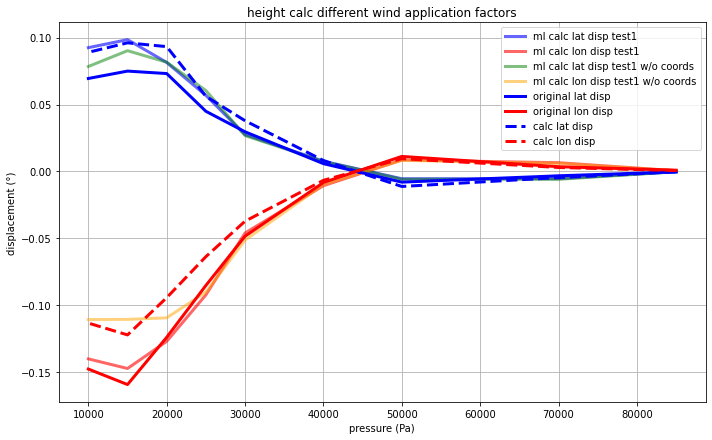

lat disp rmse:  0.012072138042079713
lon disp rmse:  0.005661637789372522
lat disp rmse w/o coords:  0.008473859782427632
lon disp rmse w/o coords:  0.021087897990604267
[92500.0, 85000.0, 69990.0, 49990.0, 40000.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


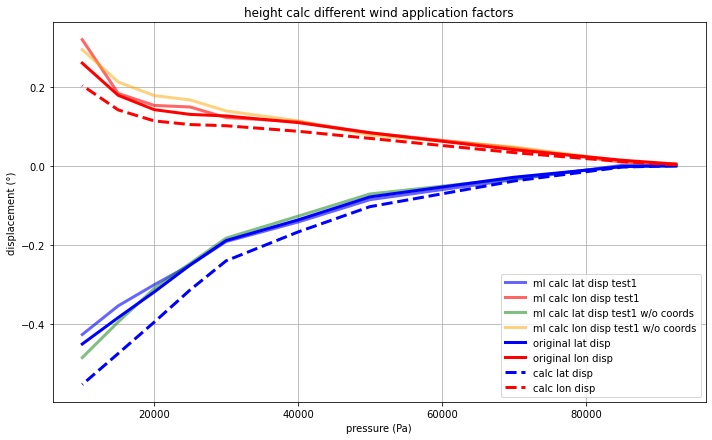

lat disp rmse:  0.013854122848525679
lon disp rmse:  0.020245141292040813
lat disp rmse w/o coords:  0.012591428629939155
lon disp rmse w/o coords:  0.022776202600566255
[92480.0, 85000.0, 69990.0, 49990.0, 39990.0, 30010.0, 25010.0, 19990.0, 15000.0, 10000.0]


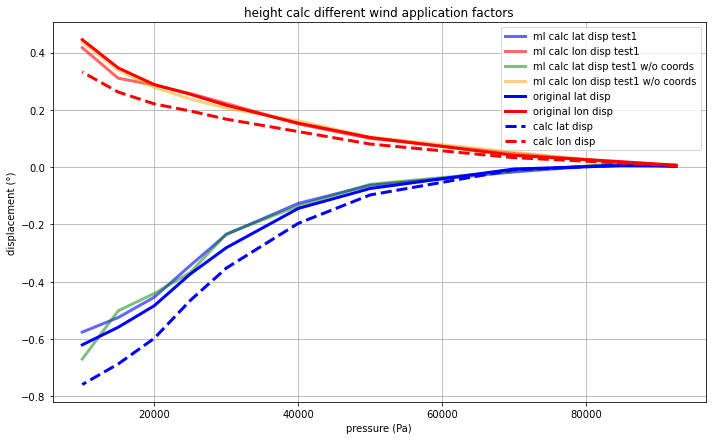

lat disp rmse:  0.02760109330151218
lon disp rmse:  0.014836772867453617
lat disp rmse w/o coords:  0.03217598282443557
lon disp rmse w/o coords:  0.00897699547005503
[69990.0, 50000.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


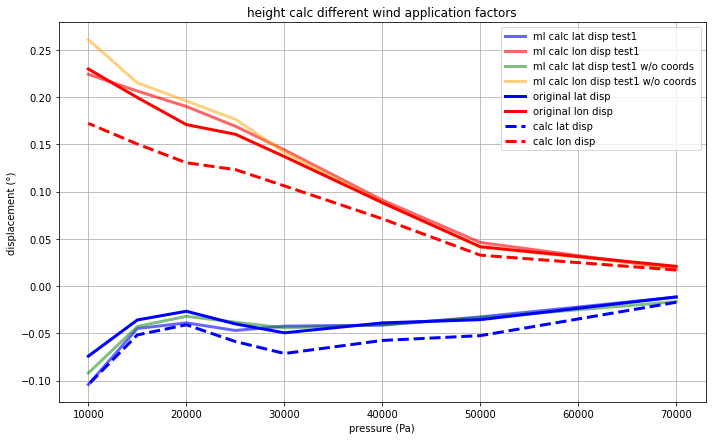

lat disp rmse:  0.012488138704427559
lon disp rmse:  0.008685229499511445
lat disp rmse w/o coords:  0.007576144066295596
lon disp rmse w/o coords:  0.016208546516846497
[85010.0, 70000.0, 50010.0, 40010.0, 30000.0, 24990.0, 20000.0, 15000.0, 10000.0]


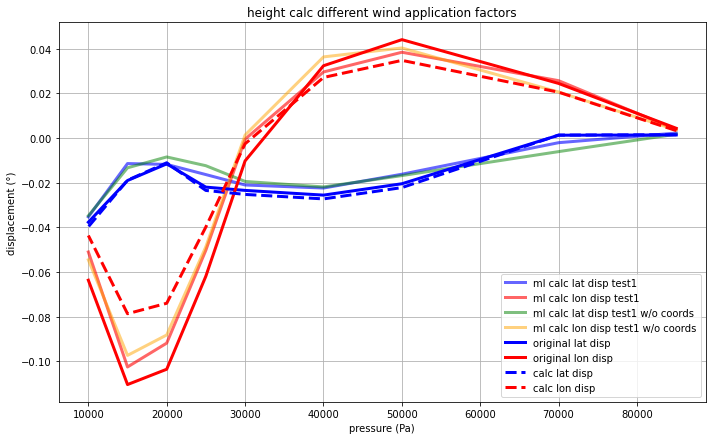

lat disp rmse:  0.003956987609412357
lon disp rmse:  0.008365022409643237
lat disp rmse w/o coords:  0.005154816738298473
lon disp rmse w/o coords:  0.009677718498351464
[84980.0, 69990.0, 50000.0, 40000.0, 30000.0, 25010.0, 20010.0, 15010.0, 10000.0]


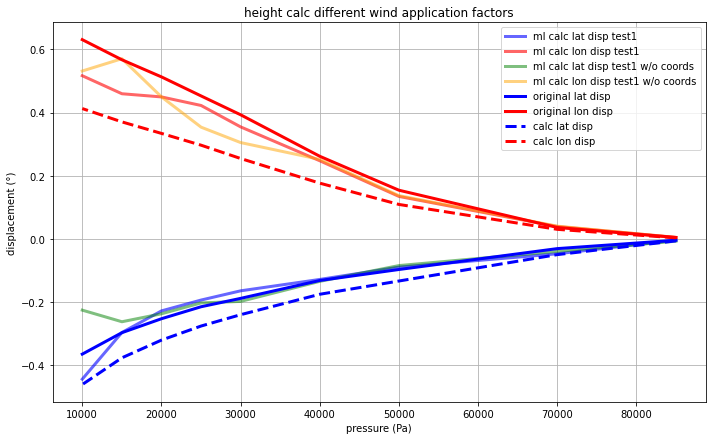

lat disp rmse:  0.030292492374414635
lon disp rmse:  0.05926642134565053
lat disp rmse w/o coords:  0.0487183056173165
lon disp rmse w/o coords:  0.05946904140313875
[100020.0, 92510.0, 85020.0, 69990.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


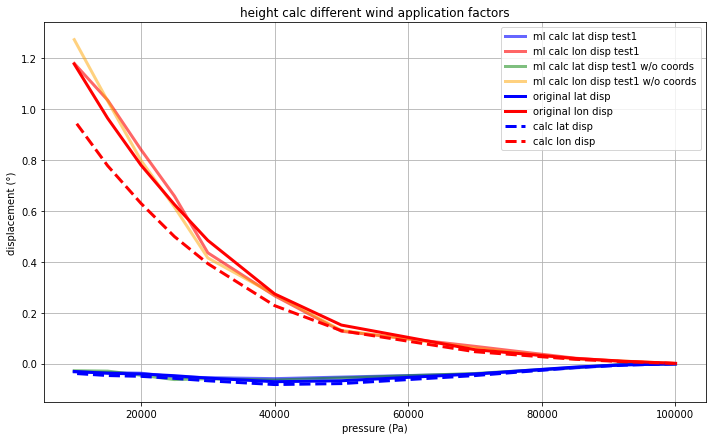

lat disp rmse:  0.006145047675874898
lon disp rmse:  0.034458755292789855
lat disp rmse w/o coords:  0.006929574628805
lon disp rmse w/o coords:  0.04211458241699249
[99990.0, 92470.0, 84990.0, 69990.0, 50010.0, 40010.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


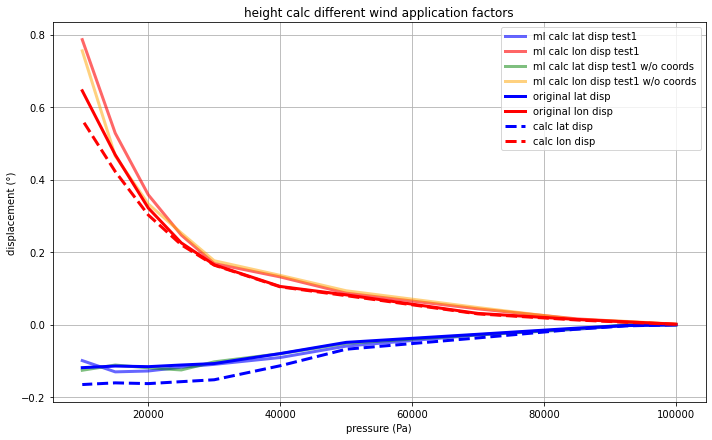

lat disp rmse:  0.009827701074231619
lon disp rmse:  0.048731695613276844
lat disp rmse w/o coords:  0.005223517186688389
lon disp rmse w/o coords:  0.036234774271550335
[85020.0, 70010.0, 50010.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


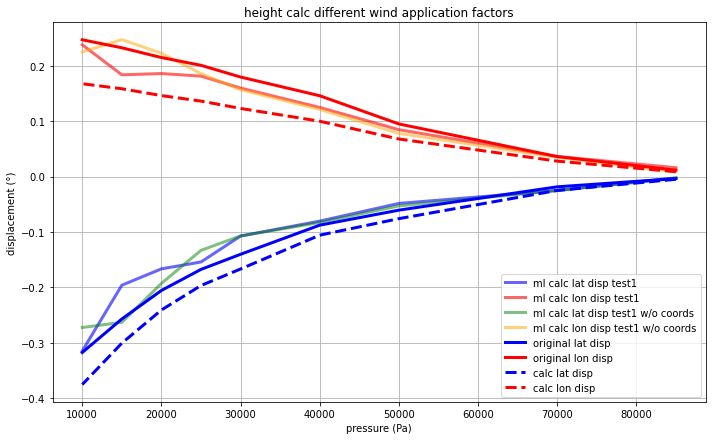

lat disp rmse:  0.027405984437668493
lon disp rmse:  0.022742761571048258
lat disp rmse w/o coords:  0.022713043803325762
lon disp rmse w/o coords:  0.016415735902410498
[92530.0, 85030.0, 69980.0, 50020.0, 39990.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


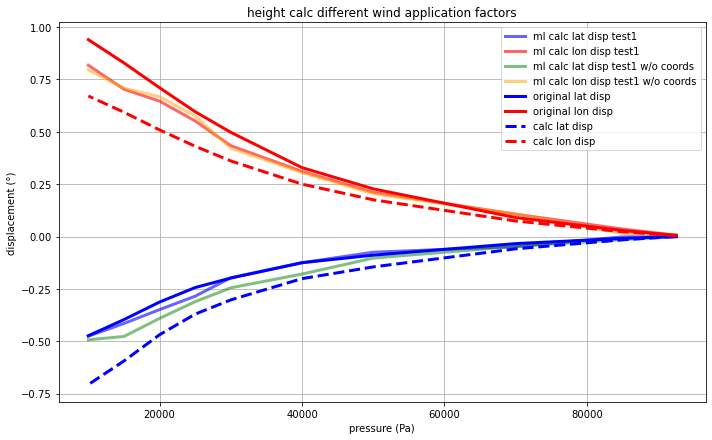

lat disp rmse:  0.01951348956616878
lon disp rmse:  0.06458314151372348
lat disp rmse w/o coords:  0.047955324789190186
lon disp rmse w/o coords:  0.06710081348424118
[92500.0, 84990.0, 69980.0, 50010.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


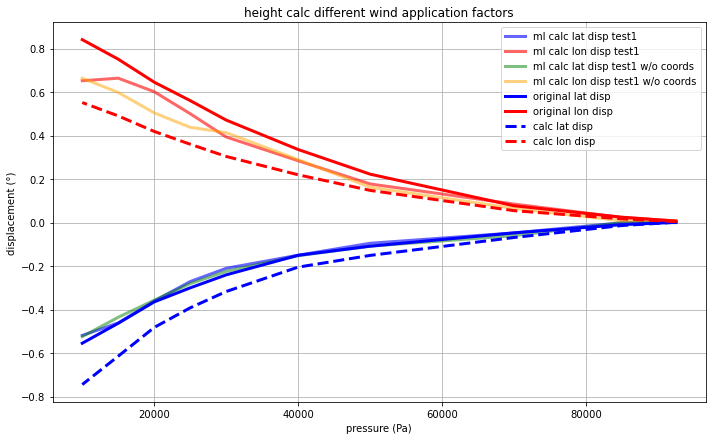

lat disp rmse:  0.0182008387871865
lon disp rmse:  0.07725681554041021
lat disp rmse w/o coords:  0.016275846956488208
lon disp rmse w/o coords:  0.09969158860821035
[99840.0, 92510.0, 85010.0, 69980.0, 49990.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


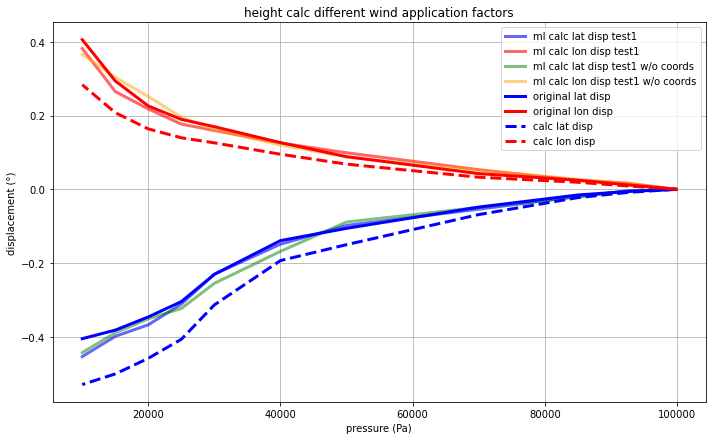

lat disp rmse:  0.017443795360974276
lon disp rmse:  0.01338678698012356
lat disp rmse w/o coords:  0.018150829083830367
lon disp rmse w/o coords:  0.015423974180880498
[85000.0, 70020.0, 49990.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


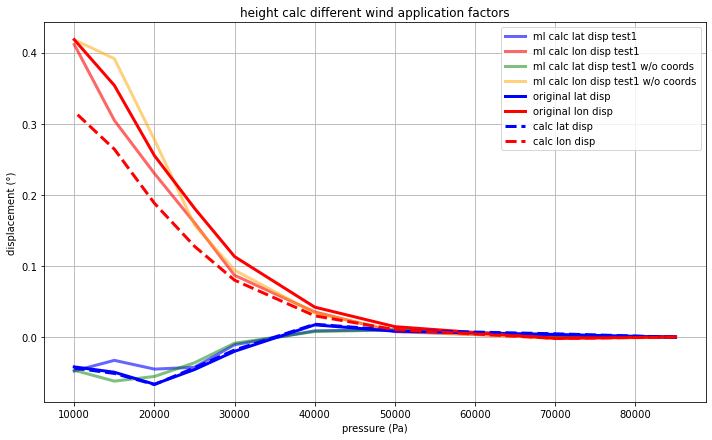

lat disp rmse:  0.010240755788191539
lon disp rmse:  0.021857000034858663
lat disp rmse w/o coords:  0.008290263326634632
lon disp rmse w/o coords:  0.018036171381037688
[92490.0, 84980.0, 69980.0, 50000.0, 40010.0, 30000.0, 24990.0, 20010.0, 15000.0, 10000.0]


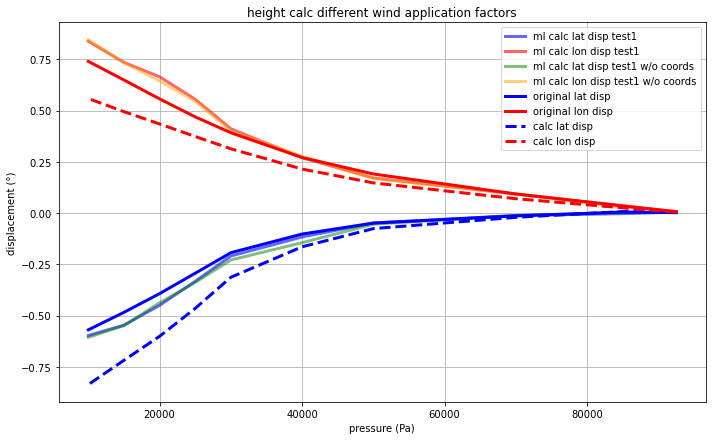

lat disp rmse:  0.03168595744399795
lon disp rmse:  0.060646855532900903
lat disp rmse w/o coords:  0.03546842407645614
lon disp rmse w/o coords:  0.05687931506695298
[99980.0, 92480.0, 85020.0, 70020.0, 50000.0, 40010.0, 30000.0, 25010.0, 20010.0, 15010.0, 10000.0]


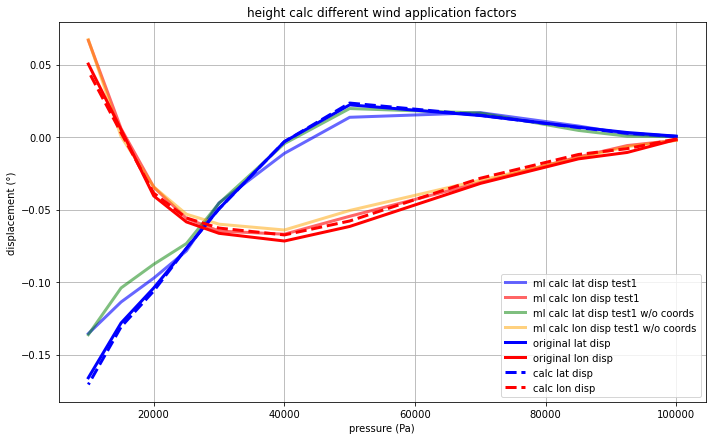

lat disp rmse:  0.011064935451733137
lon disp rmse:  0.0061091138402227605
lat disp rmse w/o coords:  0.012731278164331674
lon disp rmse w/o coords:  0.007476712368320069
[92530.0, 85000.0, 69980.0, 50000.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


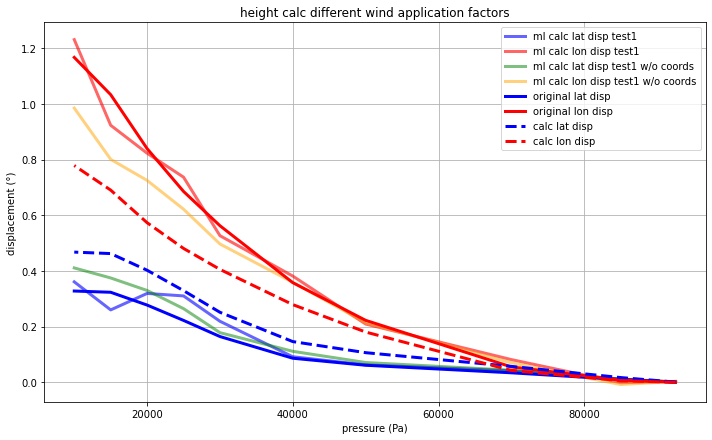

lat disp rmse:  0.04202492458794487
lon disp rmse:  0.04675060965500112
lat disp rmse w/o coords:  0.03879506894136543
lon disp rmse w/o coords:  0.10442365914442096
[99530.0, 92510.0, 85010.0, 69980.0, 50000.0, 40000.0, 29990.0, 25010.0, 20000.0, 15000.0, 10000.0]


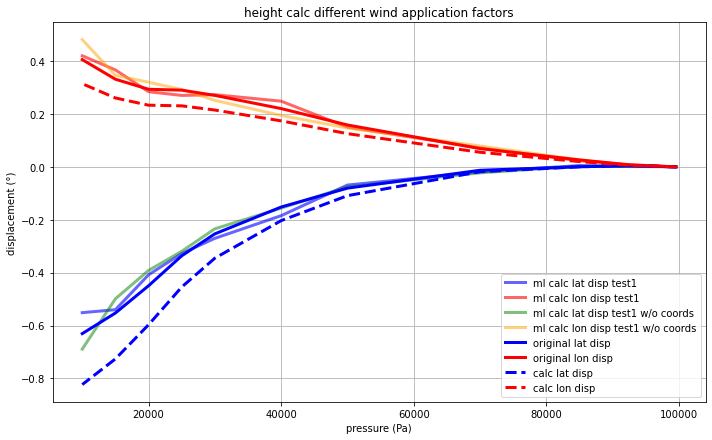

lat disp rmse:  0.029824728167998988
lon disp rmse:  0.01600426840589045
lat disp rmse w/o coords:  0.030886476428598857
lon disp rmse w/o coords:  0.026803785953232996
[92520.0, 85020.0, 69990.0, 50010.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


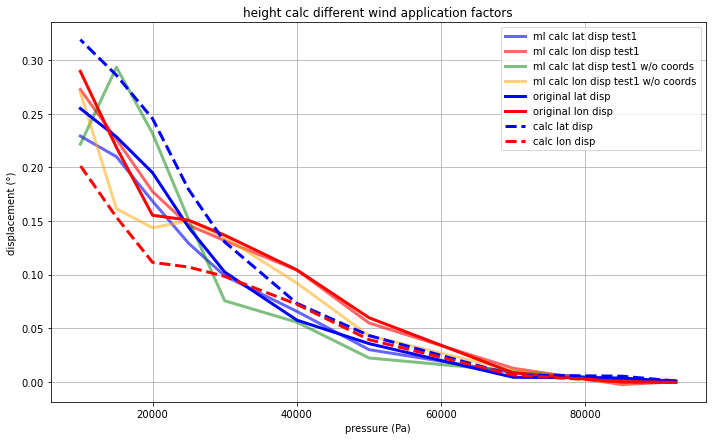

lat disp rmse:  0.014362754241724236
lon disp rmse:  0.009651271086848554
lat disp rmse w/o coords:  0.027703197304790757
lon disp rmse w/o coords:  0.020584328569698315
[92480.0, 85000.0, 70000.0, 50010.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


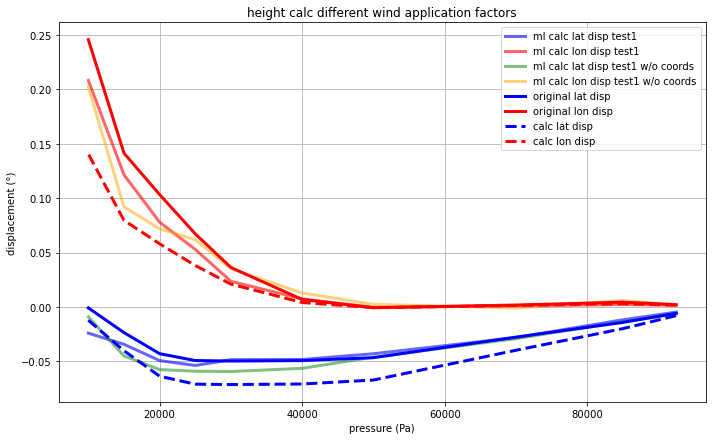

lat disp rmse:  0.008583030580447574
lon disp rmse:  0.016767965555590476
lat disp rmse w/o coords:  0.00990624876674167
lon disp rmse w/o coords:  0.023250975622365267
[92530.0, 84990.0, 70010.0, 50010.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


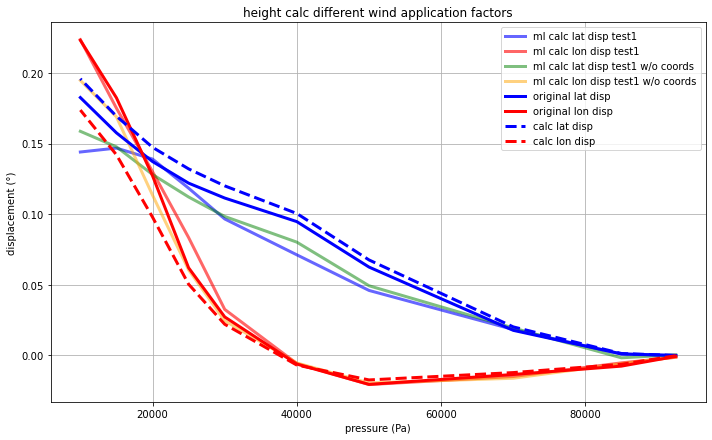

lat disp rmse:  0.0163281665384747
lon disp rmse:  0.007472977488721548
lat disp rmse w/o coords:  0.011902557120044415
lon disp rmse w/o coords:  0.01096323847581345
[92530.0, 85010.0, 69990.0, 49990.0, 40010.0, 29990.0, 25010.0, 20000.0, 15000.0, 10000.0]


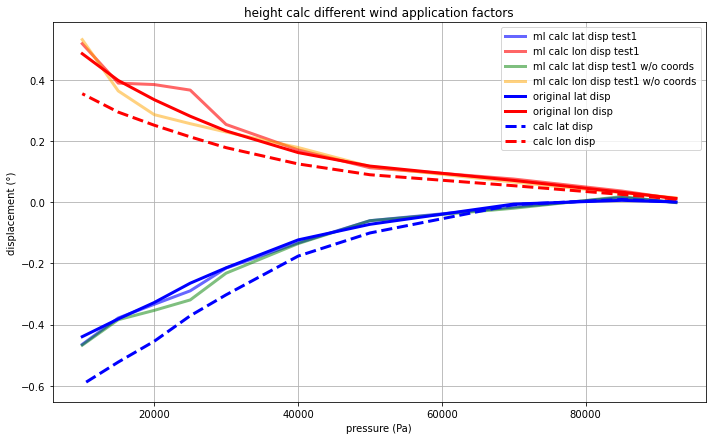

lat disp rmse:  0.01311802787481749
lon disp rmse:  0.033840794453603266
lat disp rmse w/o coords:  0.023120801892076596
lon disp rmse w/o coords:  0.025656027580318055
[85000.0, 70000.0, 50000.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


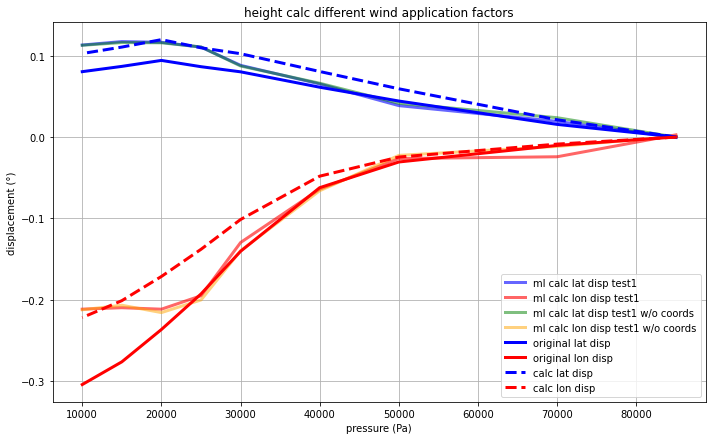

lat disp rmse:  0.018867375225811445
lon disp rmse:  0.03942115625410338
lat disp rmse w/o coords:  0.01861313928427636
lon disp rmse w/o coords:  0.039243948379122214
[99980.0, 92520.0, 84990.0, 69980.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


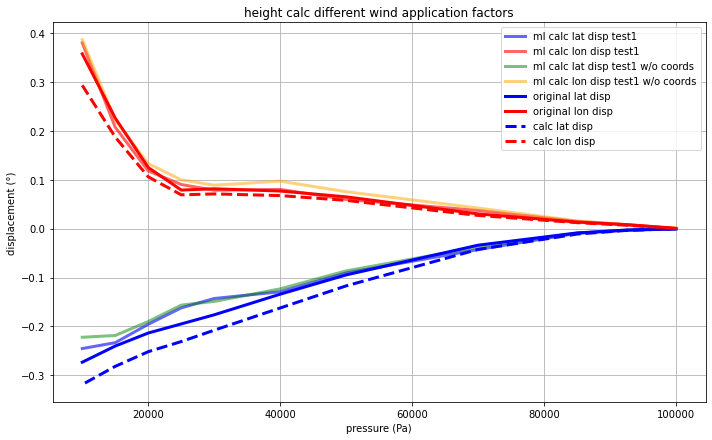

lat disp rmse:  0.017752414481004637
lon disp rmse:  0.01014665044971952
lat disp rmse w/o coords:  0.023478462914616686
lon disp rmse w/o coords:  0.013784841116550171
[92520.0, 85020.0, 70020.0, 50010.0, 39990.0, 29990.0, 25000.0, 20010.0, 15000.0, 10000.0]


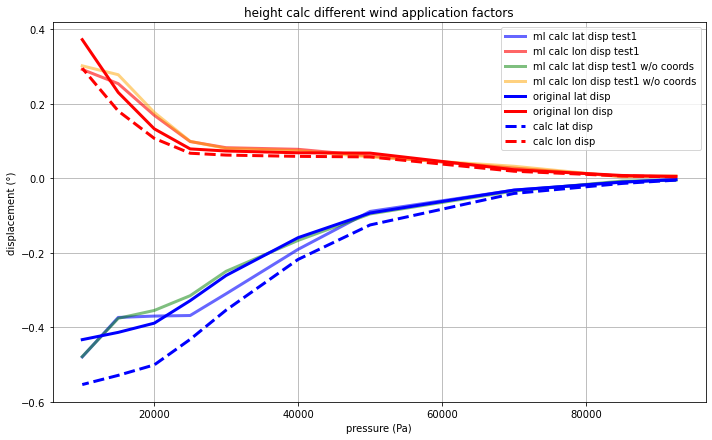

lat disp rmse:  0.03019168268363642
lon disp rmse:  0.029875339817485195
lat disp rmse w/o coords:  0.022451252362505354
lon disp rmse w/o coords:  0.031375209852782346
[99890.0, 92530.0, 85020.0, 70020.0, 49990.0, 40010.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


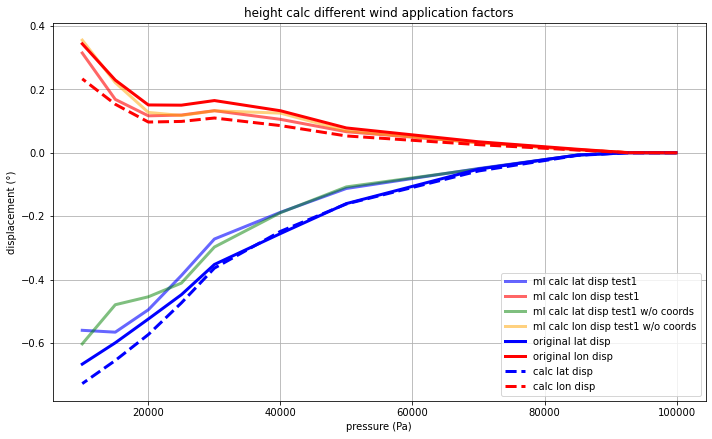

lat disp rmse:  0.052373026399007275
lon disp rmse:  0.027944626997870144
lat disp rmse w/o coords:  0.05625124365798929
lon disp rmse w/o coords:  0.016511712986361216
[100000.0, 92480.0, 85000.0, 70010.0, 50010.0, 39990.0, 30000.0, 25000.0, 20000.0, 15010.0, 10000.0]


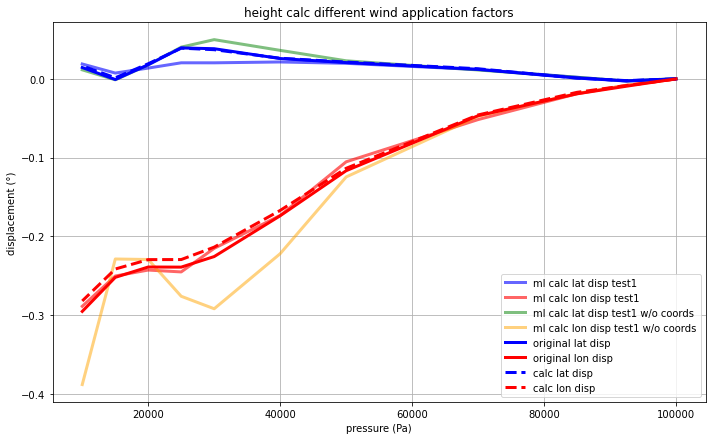

lat disp rmse:  0.00855129422616754
lon disp rmse:  0.005715025650956852
lat disp rmse w/o coords:  0.004838110010821251
lon disp rmse w/o coords:  0.03978203294094795
[92510.0, 84990.0, 70020.0, 50010.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


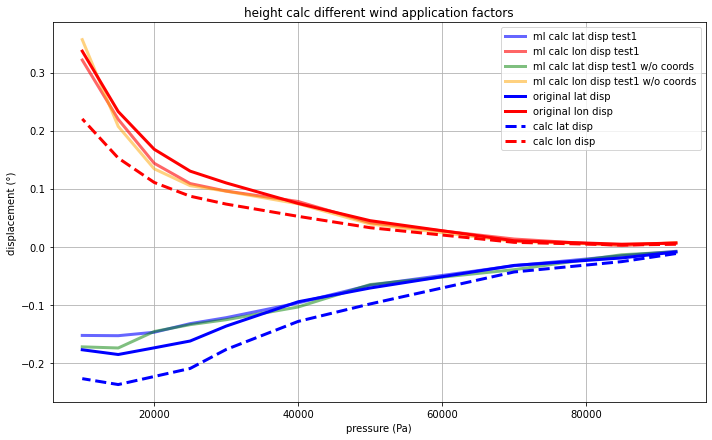

lat disp rmse:  0.01878103207467038
lon disp rmse:  0.012983166109015483
lat disp rmse w/o coords:  0.014344953826047339
lon disp rmse w/o coords:  0.01745066417922018
[100000.0, 92520.0, 85020.0, 69980.0, 49990.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


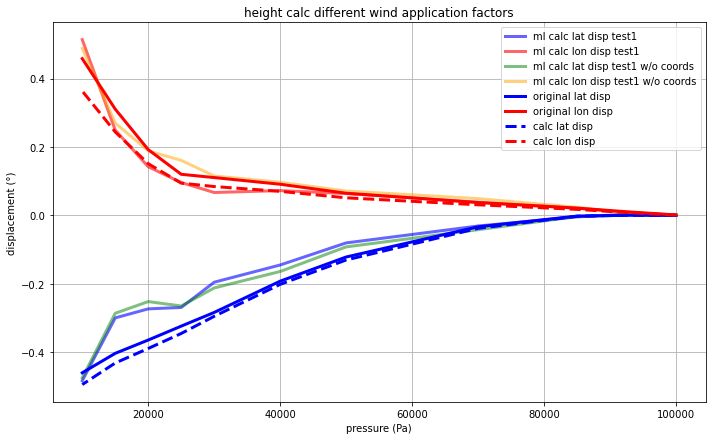

lat disp rmse:  0.055870254085305326
lon disp rmse:  0.033299461856204256
lat disp rmse w/o coords:  0.057949208065793976
lon disp rmse w/o coords:  0.020197585578672315
[92530.0, 85020.0, 69980.0, 50020.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


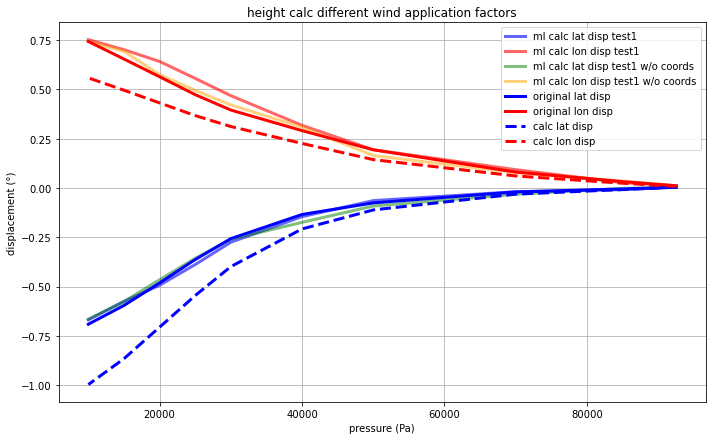

lat disp rmse:  0.015148430691942235
lon disp rmse:  0.04617764372836793
lat disp rmse w/o coords:  0.018284111457486915
lon disp rmse w/o coords:  0.019921235444845562
[100010.0, 92490.0, 85000.0, 69990.0, 50010.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


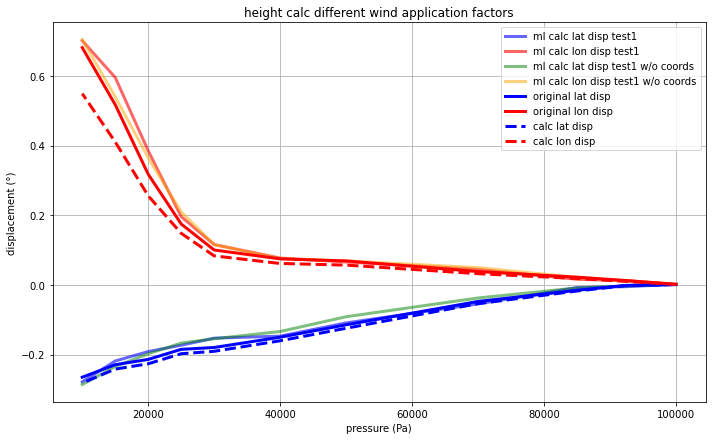

lat disp rmse:  0.01286676267045486
lon disp rmse:  0.032754539468706156
lat disp rmse w/o coords:  0.01551475462805745
lon disp rmse w/o coords:  0.020909278621803827
[99890.0, 92500.0, 84980.0, 70020.0, 50010.0, 40010.0, 30010.0, 25000.0, 20010.0, 15010.0, 10000.0]


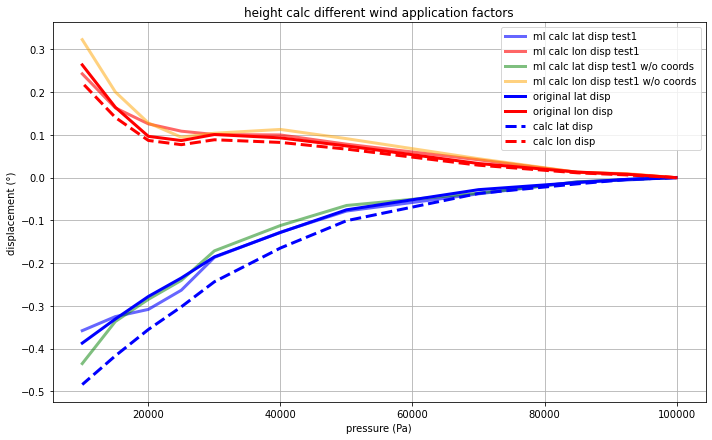

lat disp rmse:  0.015741100071177853
lon disp rmse:  0.013190472470196567
lat disp rmse w/o coords:  0.01662220697957956
lon disp rmse w/o coords:  0.024569953762633604
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


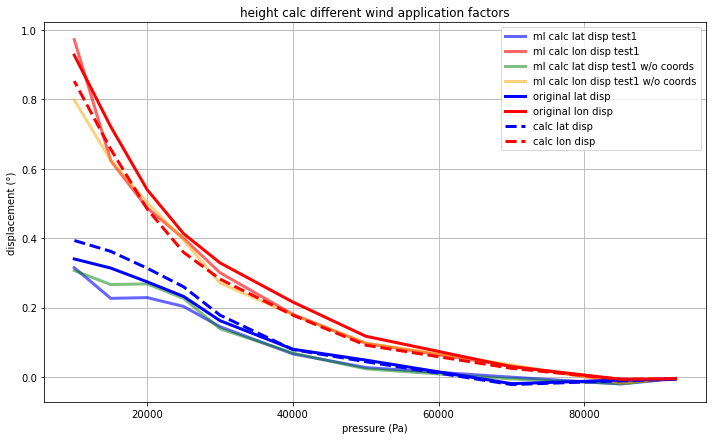

lat disp rmse:  0.03545591061692668
lon disp rmse:  0.04131699077098173
lat disp rmse w/o coords:  0.02243796231412735
lon disp rmse w/o coords:  0.05766015086472523
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0, 7000.0, 5000.0, 3000.0, 2000.0, 1000.0]


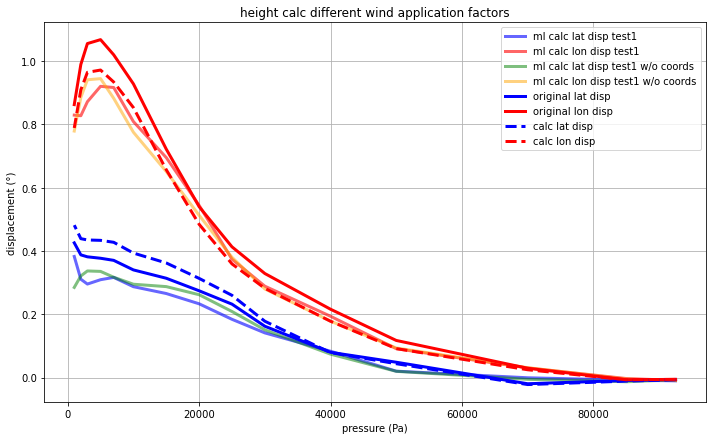

lat disp rmse:  0.04718709250318341
lon disp rmse:  0.08668110786303283
lat disp rmse w/o coords:  0.04858913149685105
lon disp rmse w/o coords:  0.0814623102632375
[100020.0, 92510.0, 85010.0, 69990.0, 50000.0, 39990.0, 30010.0, 24990.0, 20000.0, 15000.0, 10000.0]


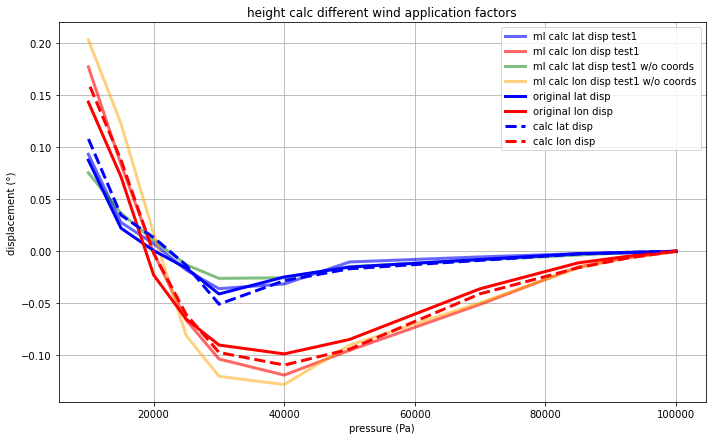

lat disp rmse:  0.0044039066897161175
lon disp rmse:  0.015640976016229192
lat disp rmse w/o coords:  0.007911734812892566
lon disp rmse w/o coords:  0.030248452767250855
[92510.0, 85010.0, 69990.0, 49990.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


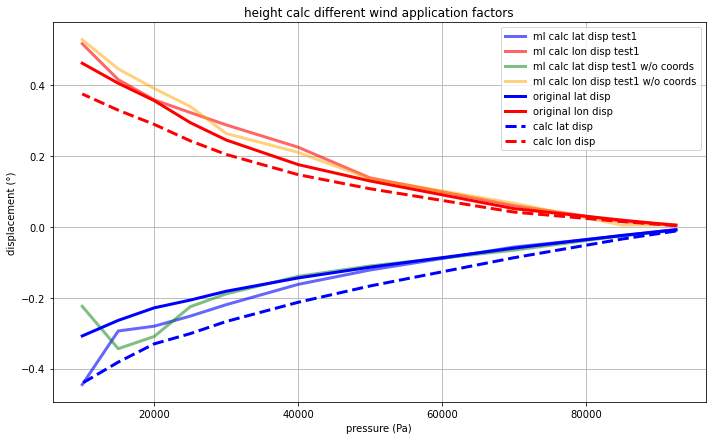

lat disp rmse:  0.0512742744897381
lon disp rmse:  0.028850557134294214
lat disp rmse w/o coords:  0.04514477480314352
lon disp rmse w/o coords:  0.03368463048601825
[92480.0, 84980.0, 70020.0, 50000.0, 40010.0, 30000.0, 25010.0, 20000.0, 15010.0, 10000.0]


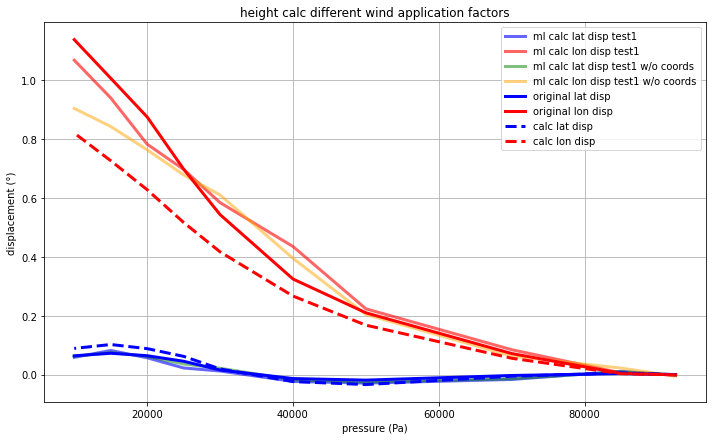

lat disp rmse:  0.010685812902142334
lon disp rmse:  0.056694259727498024
lat disp rmse w/o coords:  0.006045311936044458
lon disp rmse w/o coords:  0.10207739179391798
[100000.0, 92470.0, 84990.0, 69990.0, 50010.0, 39990.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


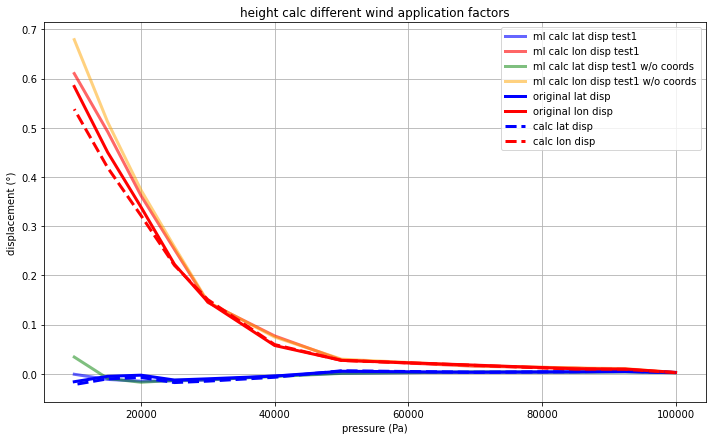

lat disp rmse:  0.006361800202775719
lon disp rmse:  0.01975921000600013
lat disp rmse w/o coords:  0.015872612322215752
lon disp rmse w/o coords:  0.037638990880086334
[99990.0, 92510.0, 84990.0, 70000.0, 50000.0, 40010.0, 30010.0, 25010.0, 20000.0, 15010.0, 10000.0]


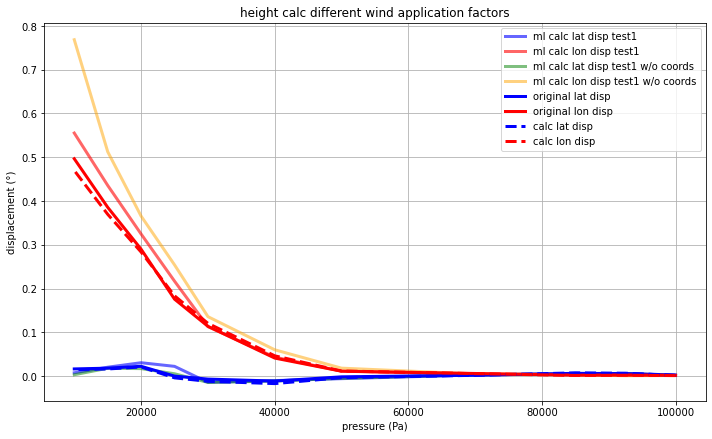

lat disp rmse:  0.008100714584137293
lon disp rmse:  0.02835739537000319
lat disp rmse w/o coords:  0.00526627642601263
lon disp rmse w/o coords:  0.09665436060920193
[99660.0, 92480.0, 85020.0, 69980.0, 50020.0, 40010.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


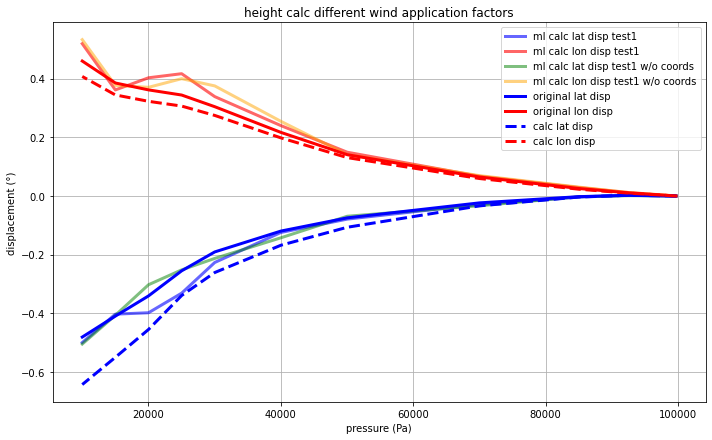

lat disp rmse:  0.031427184723480814
lon disp rmse:  0.034188166370071695
lat disp rmse w/o coords:  0.017006474575196502
lon disp rmse w/o coords:  0.03699800137353867
[84520.0, 69990.0, 50010.0, 40010.0, 30000.0, 24990.0, 20000.0, 15000.0, 10000.0]


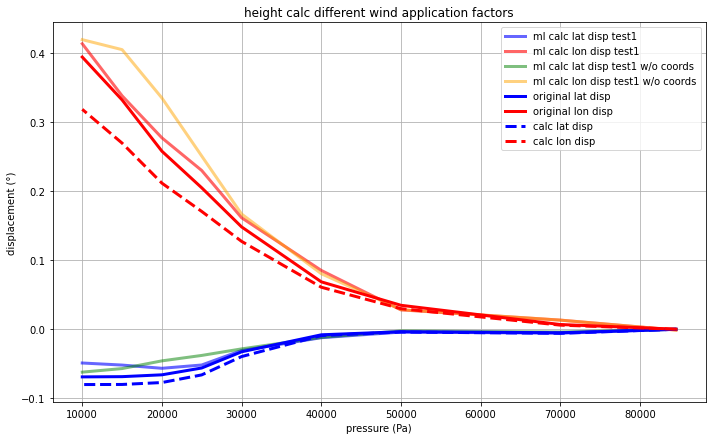

lat disp rmse:  0.009511770582878592
lon disp rmse:  0.014692253973775752
lat disp rmse w/o coords:  0.010308815713722967
lon disp rmse w/o coords:  0.04018260749333848
[84660.0, 70020.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


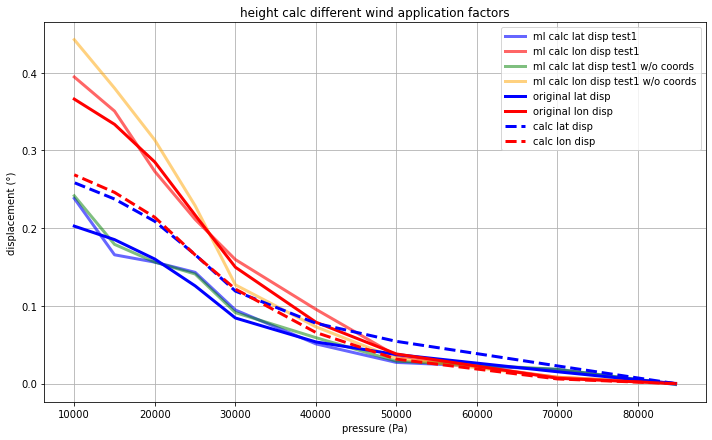

lat disp rmse:  0.015626416782570145
lon disp rmse:  0.013560760590528851
lat disp rmse w/o coords:  0.014808515803392349
lon disp rmse w/o coords:  0.03257720914362202
[70000.0, 50000.0, 40020.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


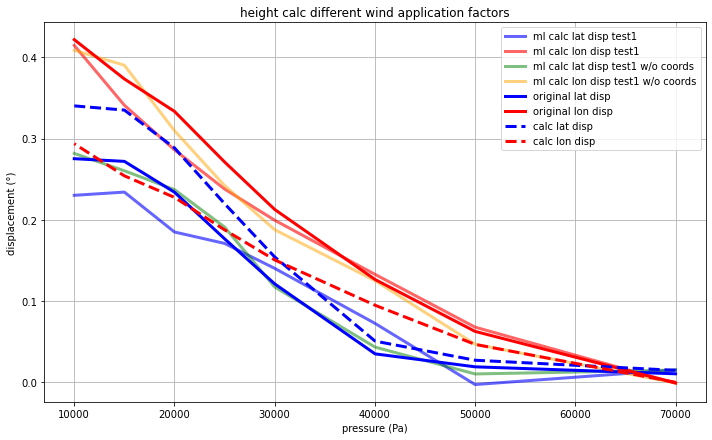

lat disp rmse:  0.03191596094209232
lon disp rmse:  0.024194997618889432
lat disp rmse w/o coords:  0.008477841160180166
lon disp rmse w/o coords:  0.01849595578437491
[99790.0, 92490.0, 85020.0, 70000.0, 50000.0, 39990.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


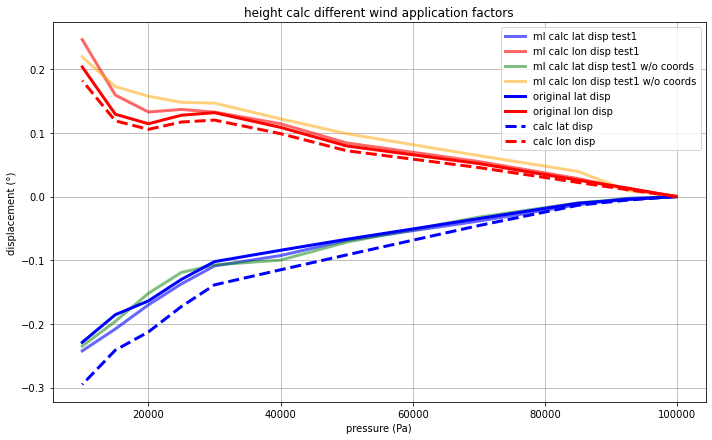

lat disp rmse:  0.009107345091413775
lon disp rmse:  0.01717147591356353
lat disp rmse w/o coords:  0.0079810302571002
lon disp rmse w/o coords:  0.022448669555347682
[92500.0, 84990.0, 69990.0, 49990.0, 40010.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


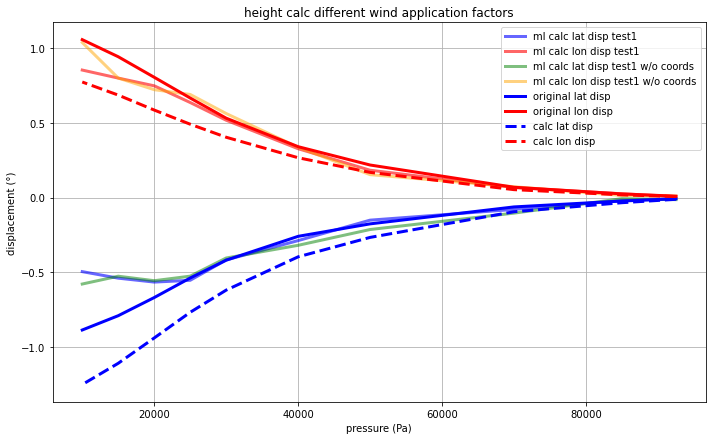

lat disp rmse:  0.15110776201358112
lon disp rmse:  0.08221534023868853
lat disp rmse w/o coords:  0.13587126285407478
lon disp rmse w/o coords:  0.057858672027269915
[99680.0, 92470.0, 84990.0, 70010.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


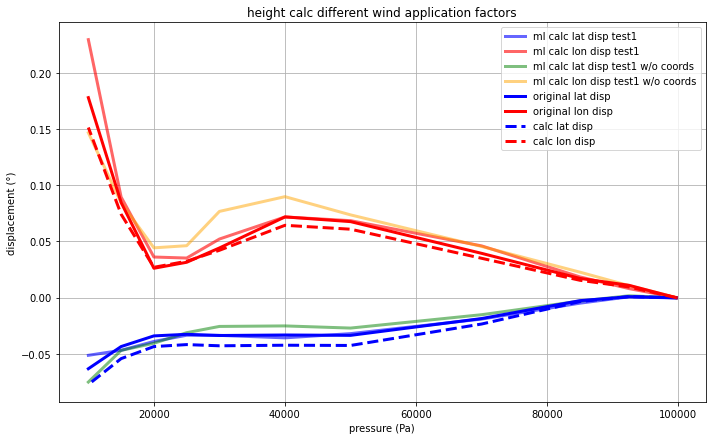

lat disp rmse:  0.004184567994273905
lon disp rmse:  0.01627555652215165
lat disp rmse w/o coords:  0.005890150454340577
lon disp rmse w/o coords:  0.016528171511342442
[85000.0, 70000.0, 50000.0, 39990.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


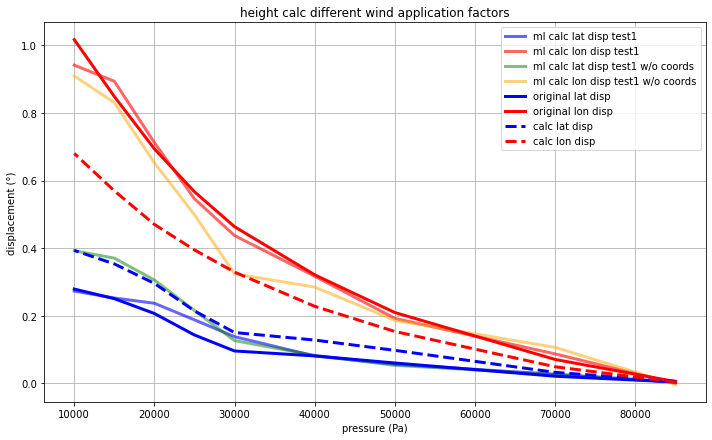

lat disp rmse:  0.023092708642092466
lon disp rmse:  0.03300637228549979
lat disp rmse w/o coords:  0.06937599165938697
lon disp rmse w/o coords:  0.06736354672692374
[99980.0, 92500.0, 84990.0, 69980.0, 50000.0, 40010.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


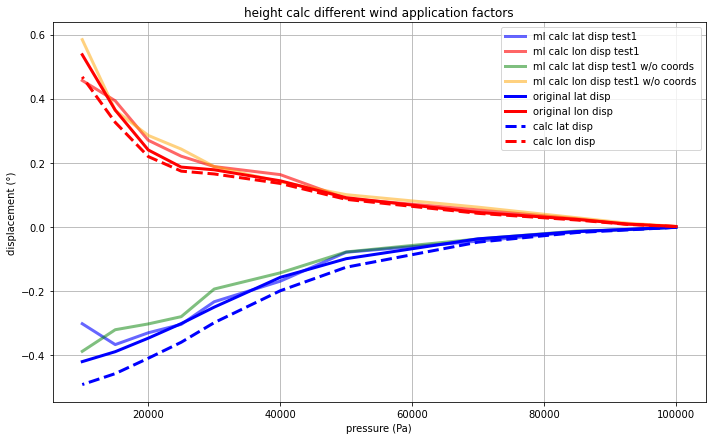

lat disp rmse:  0.03768546104953228
lon disp rmse:  0.03001597961062038
lat disp rmse w/o coords:  0.03300750946125564
lon disp rmse w/o coords:  0.026850237725546722
[92490.0, 85010.0, 69990.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


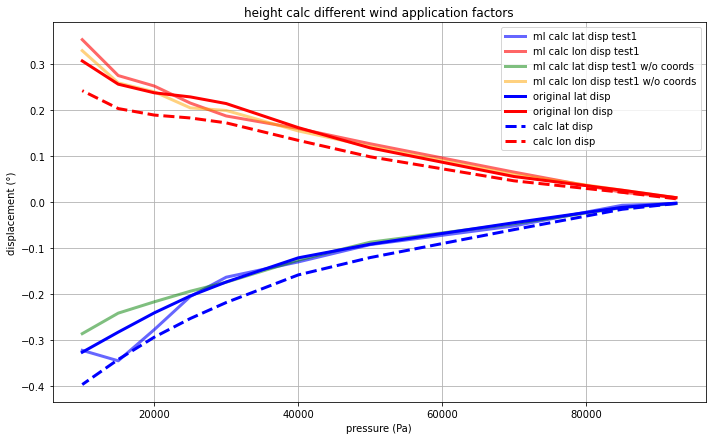

lat disp rmse:  0.023406004156486398
lon disp rmse:  0.019518013611920237
lat disp rmse w/o coords:  0.020132861562528092
lon disp rmse w/o coords:  0.011767335762566663
[92200.0, 85020.0, 69980.0, 49990.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


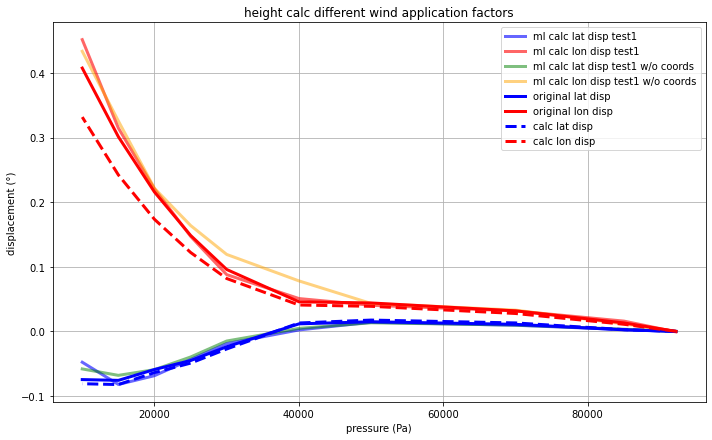

lat disp rmse:  0.009849062405288529
lon disp rmse:  0.015016785414722882
lat disp rmse w/o coords:  0.007029060555715747
lon disp rmse w/o coords:  0.01770205580532061
[100030.0, 92480.0, 85000.0, 69980.0, 49990.0, 40020.0, 30000.0, 25000.0, 20010.0, 15010.0, 10000.0]


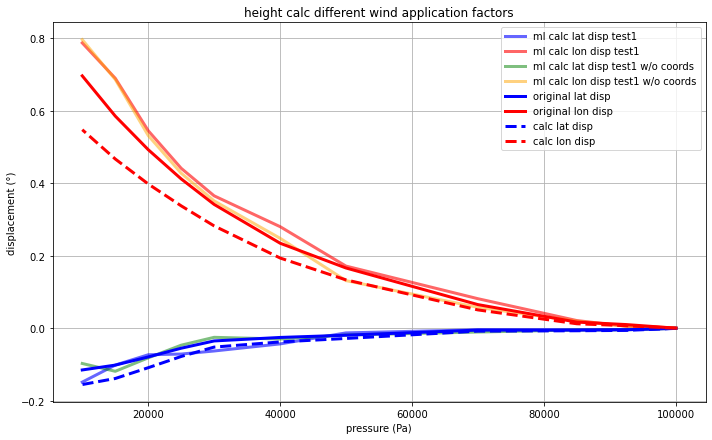

lat disp rmse:  0.015230008711260878
lon disp rmse:  0.04835195700338778
lat disp rmse w/o coords:  0.008704878334697937
lon disp rmse w/o coords:  0.04623269052920824
[92500.0, 85010.0, 70020.0, 50000.0, 39990.0, 30010.0, 25010.0, 19990.0, 15000.0, 10000.0]


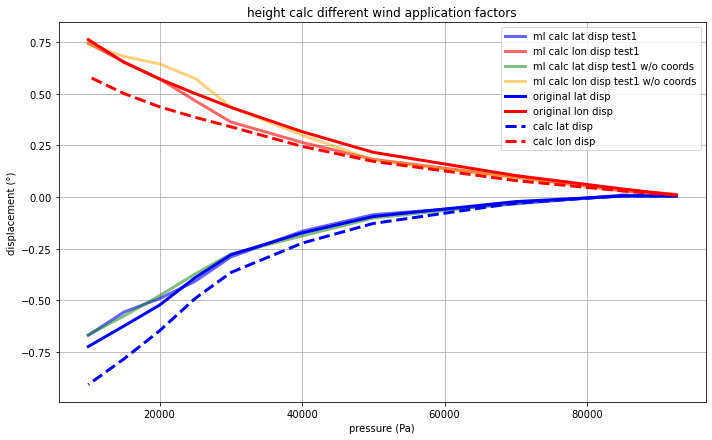

lat disp rmse:  0.03037756477919671
lon disp rmse:  0.03244142635245301
lat disp rmse w/o coords:  0.028710225539315796
lon disp rmse w/o coords:  0.036947134581999844
[84980.0, 70020.0, 50010.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


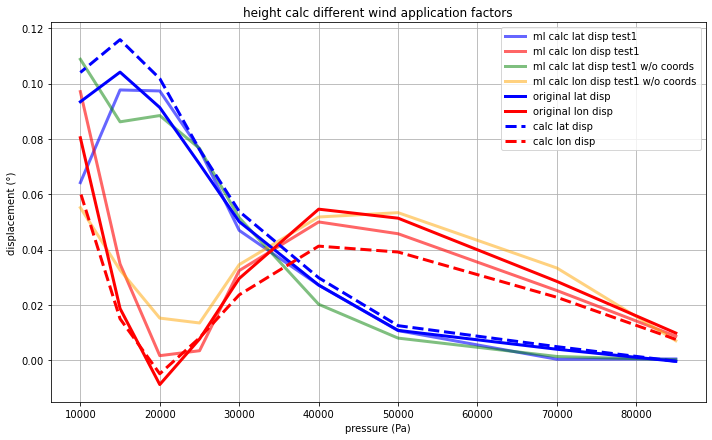

lat disp rmse:  0.010449636363493863
lon disp rmse:  0.009042975595653322
lat disp rmse w/o coords:  0.008585989520058202
lon disp rmse w/o coords:  0.012946414390972008
[100000.0, 92480.0, 85000.0, 70020.0, 50000.0, 40000.0, 30000.0, 24990.0, 20010.0, 15000.0, 10000.0]


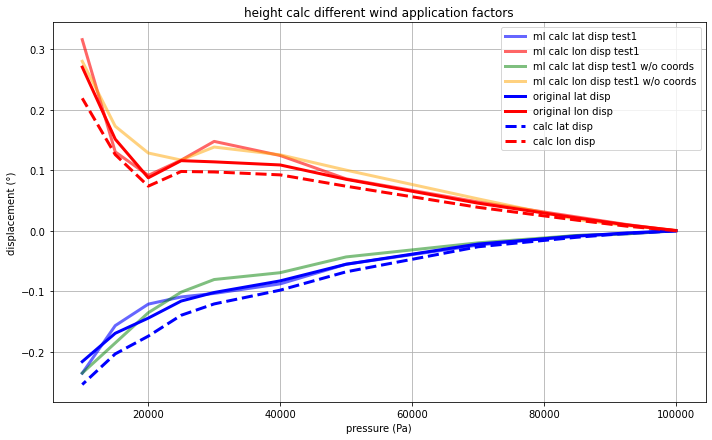

lat disp rmse:  0.010167803927166291
lon disp rmse:  0.01885867554028071
lat disp rmse w/o coords:  0.012454791801255192
lon disp rmse w/o coords:  0.017561615610095043
[92080.0, 84980.0, 70000.0, 50010.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


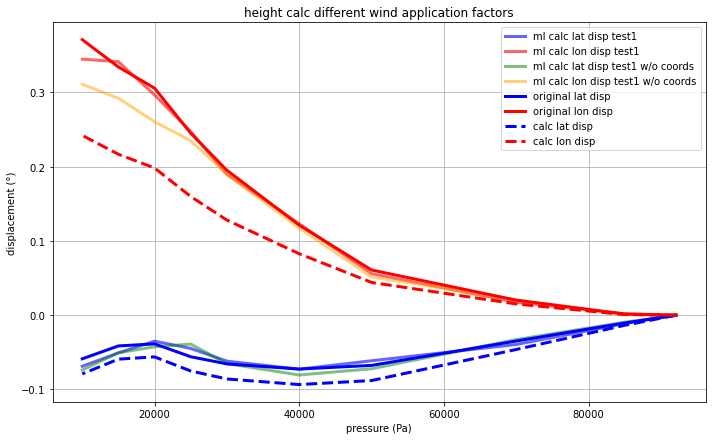

lat disp rmse:  0.006353000781247356
lon disp rmse:  0.009459213882101955
lat disp rmse w/o coords:  0.008425252051701106
lon disp rmse w/o coords:  0.027666838604424555
[92530.0, 85010.0, 70000.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


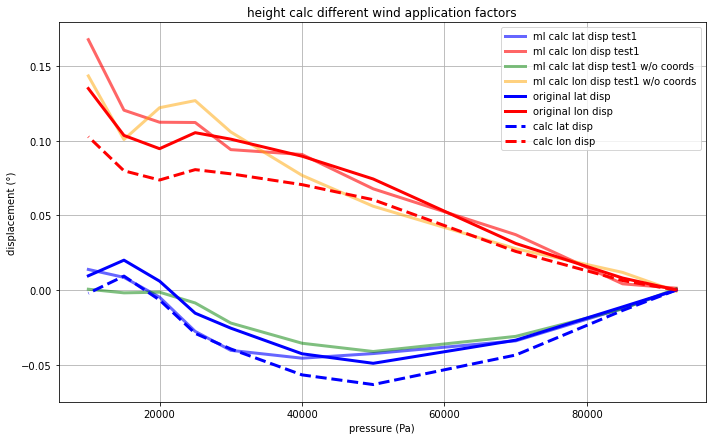

lat disp rmse:  0.008301623436142488
lon disp rmse:  0.013649820142419777
lat disp rmse w/o coords:  0.00891626963969543
lon disp rmse w/o coords:  0.013575723137728094
[70000.0, 50020.0, 39990.0, 30010.0, 25010.0, 20000.0, 15010.0, 10000.0]


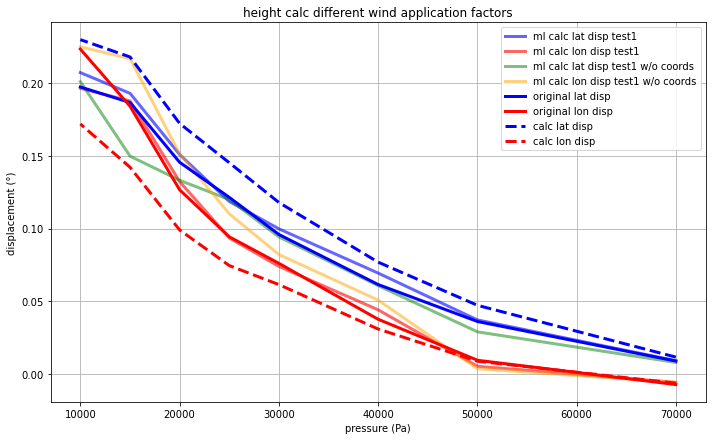

lat disp rmse:  0.005619307289449823
lon disp rmse:  0.010234212997393785
lat disp rmse w/o coords:  0.014055835584720438
lon disp rmse w/o coords:  0.01651208503302211
[99990.0, 92530.0, 85010.0, 69990.0, 50010.0, 40010.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


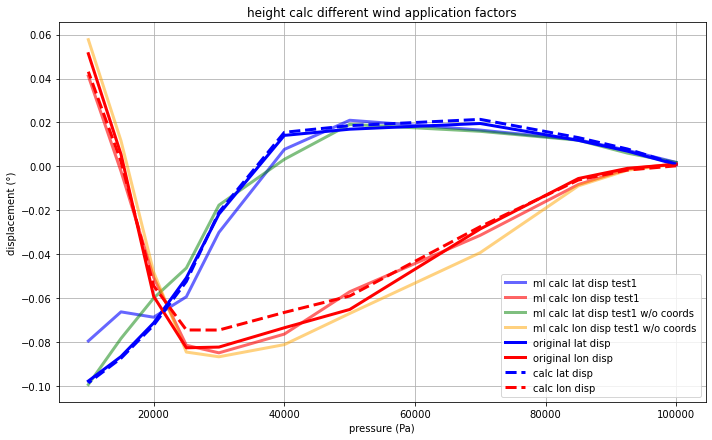

lat disp rmse:  0.009368026647836904
lon disp rmse:  0.005521531081859563
lat disp rmse w/o coords:  0.005826208097705885
lon disp rmse w/o coords:  0.006144034005811109
[99980.0, 92520.0, 85010.0, 70000.0, 49990.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


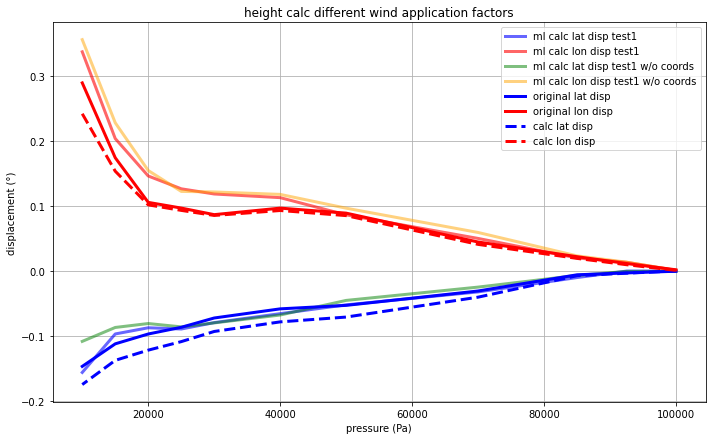

lat disp rmse:  0.0070814325328987255
lon disp rmse:  0.025236593630379982
lat disp rmse w/o coords:  0.015448034727093935
lon disp rmse w/o coords:  0.03349214270065272
[100030.0, 92490.0, 85020.0, 70010.0, 50020.0, 39990.0, 30000.0, 24990.0, 20010.0, 15000.0, 10000.0]


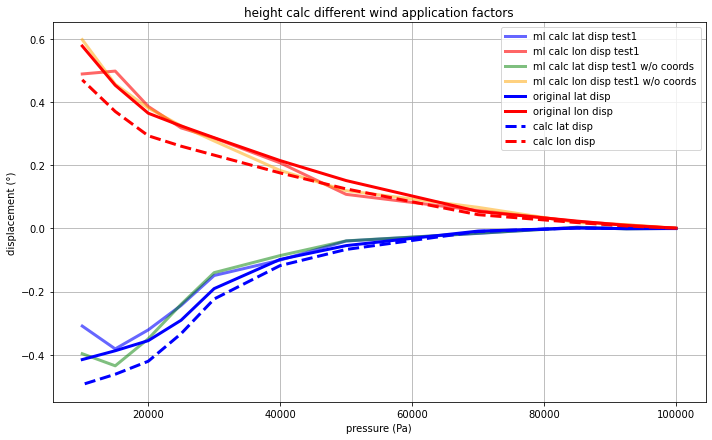

lat disp rmse:  0.038893780271539384
lon disp rmse:  0.0334403523227187
lat disp rmse w/o coords:  0.027256106059673612
lon disp rmse w/o coords:  0.01642994883565113
[92500.0, 84980.0, 70020.0, 49990.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


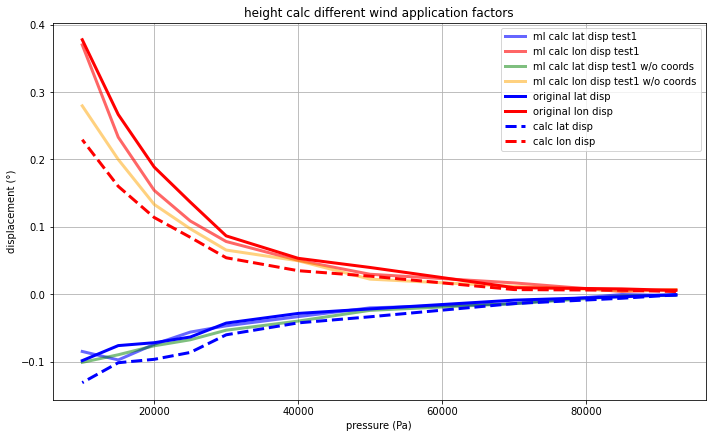

lat disp rmse:  0.008820911508732984
lon disp rmse:  0.018471365696501145
lat disp rmse w/o coords:  0.0070844434829607375
lon disp rmse w/o coords:  0.04413611204856262
[84990.0, 70020.0, 50010.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


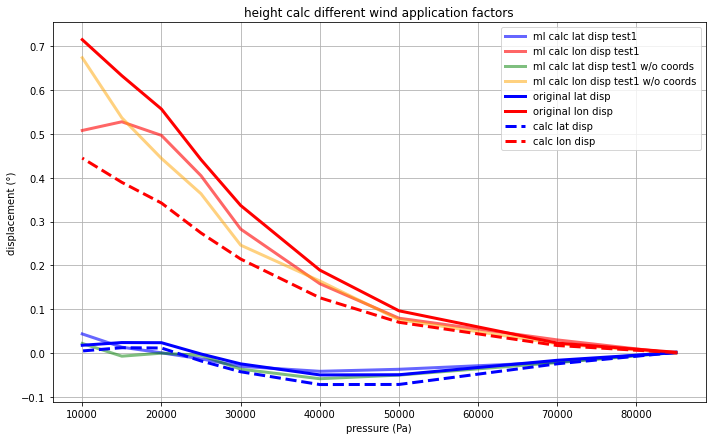

lat disp rmse:  0.013789338128849657
lon disp rmse:  0.0837149336565343
lat disp rmse w/o coords:  0.014199793268112826
lon disp rmse w/o coords:  0.06569668300499973
[92500.0, 84990.0, 69980.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


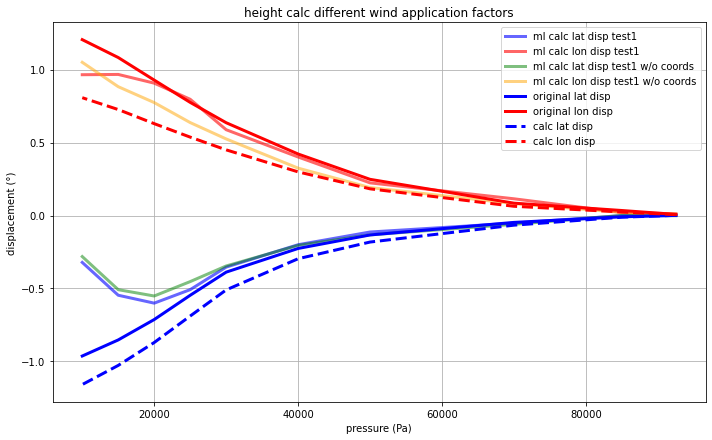

lat disp rmse:  0.22841345816027306
lon disp rmse:  0.08743982565395432
lat disp rmse w/o coords:  0.2490862669758235
lon disp rmse w/o coords:  0.11489484773014286
[85020.0, 69980.0, 50000.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


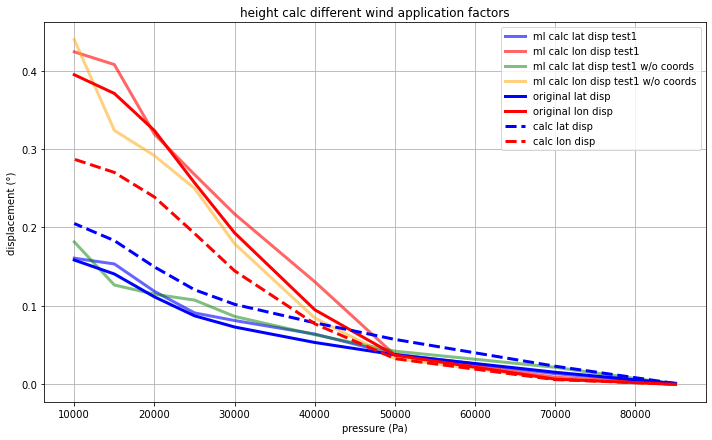

lat disp rmse:  0.0068381135995905845
lon disp rmse:  0.02161780573577989
lat disp rmse w/o coords:  0.01286022636622222
lon disp rmse w/o coords:  0.02499002568472791
[92520.0, 84980.0, 69990.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


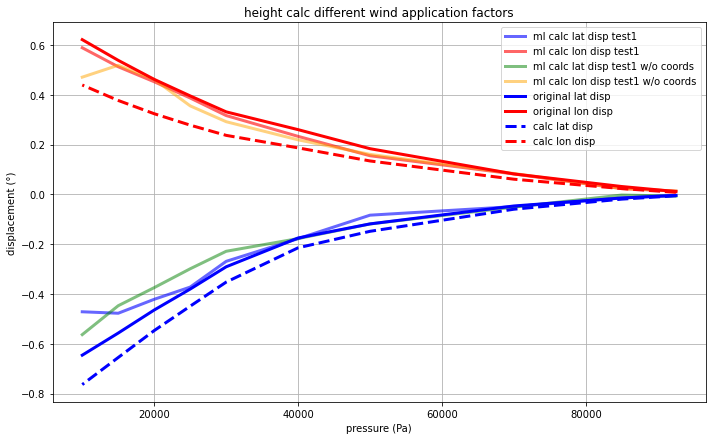

lat disp rmse:  0.06348457874502043
lon disp rmse:  0.01926724345708799
lat disp rmse w/o coords:  0.06133407573151148
lon disp rmse w/o coords:  0.05338026628176622
[92480.0, 85000.0, 70020.0, 50010.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


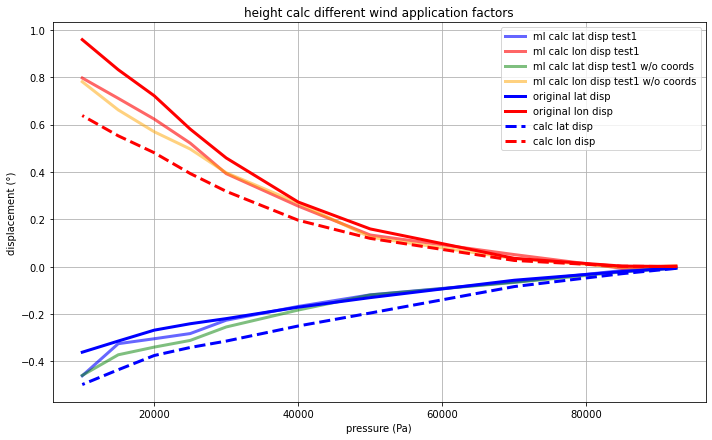

lat disp rmse:  0.036522521975446344
lon disp rmse:  0.07726057181169084
lat disp rmse w/o coords:  0.04963927659506762
lon disp rmse w/o coords:  0.09784189713368406
[100040.0, 92480.0, 85020.0, 70010.0, 49990.0, 39990.0, 30000.0, 25000.0, 20000.0, 15010.0, 10000.0]


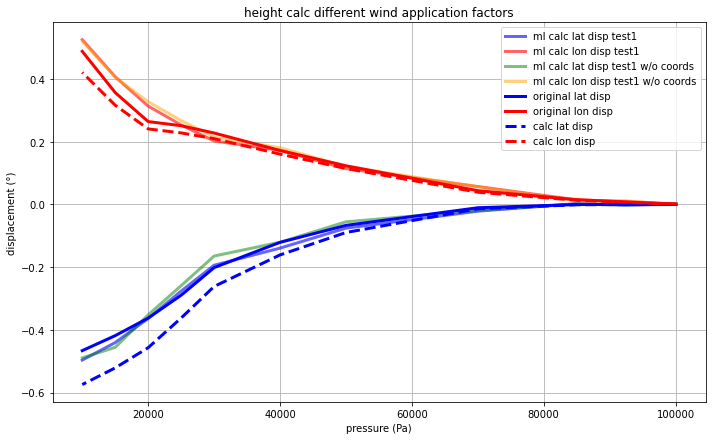

lat disp rmse:  0.014082195624697154
lon disp rmse:  0.025752936472153366
lat disp rmse w/o coords:  0.0203175009336133
lon disp rmse w/o coords:  0.027087179812672932
[92510.0, 85020.0, 70010.0, 50010.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


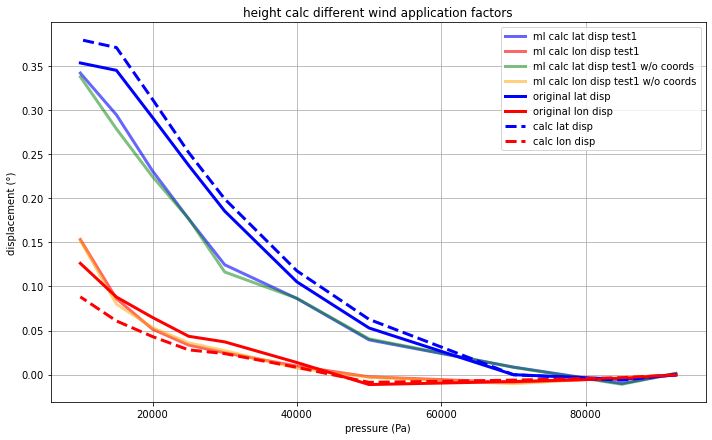

lat disp rmse:  0.03791303810844298
lon disp rmse:  0.011210908526783997
lat disp rmse w/o coords:  0.042647007048752315
lon disp rmse w/o coords:  0.010674691606882253
[92480.0, 85000.0, 70020.0, 49990.0, 40020.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


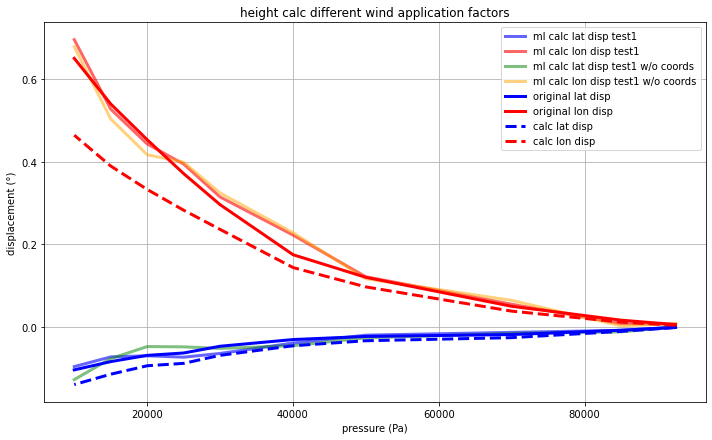

lat disp rmse:  0.008438865848209784
lon disp rmse:  0.023585675684921203
lat disp rmse w/o coords:  0.01253617879823128
lon disp rmse w/o coords:  0.028727268183304684
[92480.0, 84990.0, 70020.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


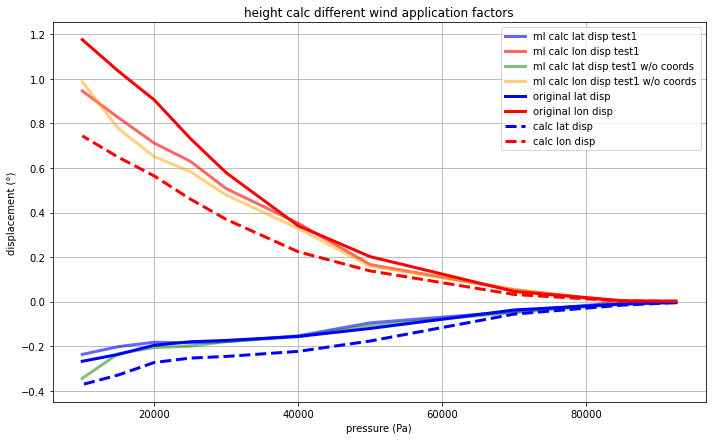

lat disp rmse:  0.017799229067804213
lon disp rmse:  0.12299379984948995
lat disp rmse w/o coords:  0.02592686276011107
lon disp rmse w/o coords:  0.1418627289697795
[92530.0, 85020.0, 69990.0, 50000.0, 39990.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


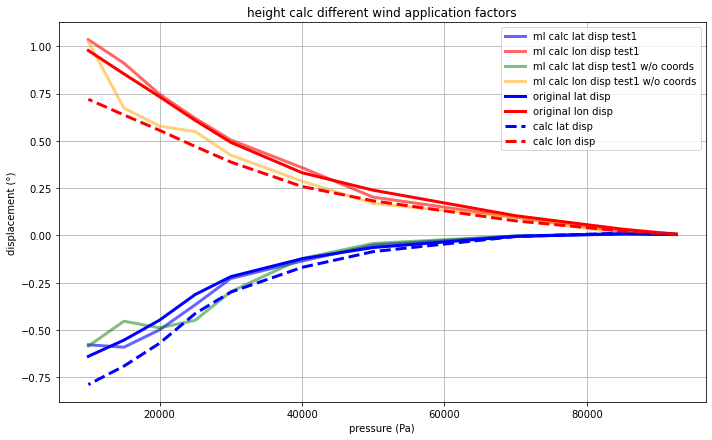

lat disp rmse:  0.03330188887469391
lon disp rmse:  0.03039301066404011
lat disp rmse w/o coords:  0.06316542732006557
lon disp rmse w/o coords:  0.0863660350308559
[99990.0, 92480.0, 85030.0, 70020.0, 50010.0, 39990.0, 29990.0, 24990.0, 20010.0, 15010.0, 10000.0]


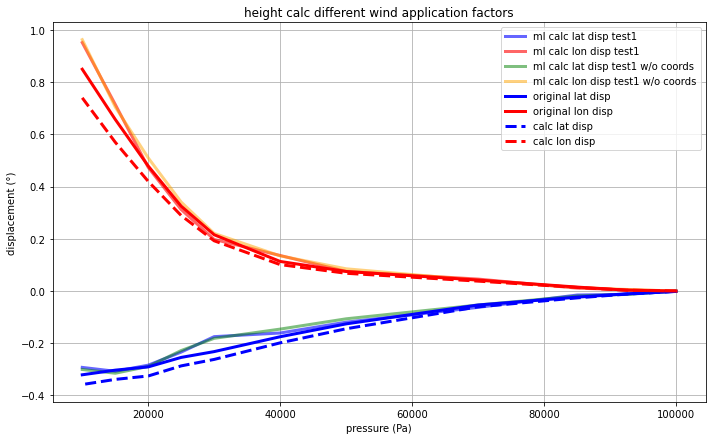

lat disp rmse:  0.02126302332000008
lon disp rmse:  0.03666123555952993
lat disp rmse w/o coords:  0.02152510822953363
lon disp rmse w/o coords:  0.03922043756370267
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


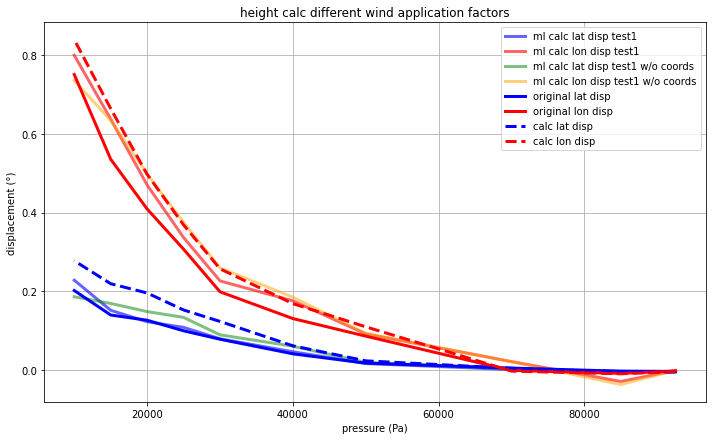

lat disp rmse:  0.009846993239417992
lon disp rmse:  0.04602811817744803
lat disp rmse w/o coords:  0.01811912320016776
lon disp rmse w/o coords:  0.05532328898542907
[92490.0, 85010.0, 70010.0, 50020.0, 40010.0, 29990.0, 25000.0, 20000.0, 15000.0, 10010.0]


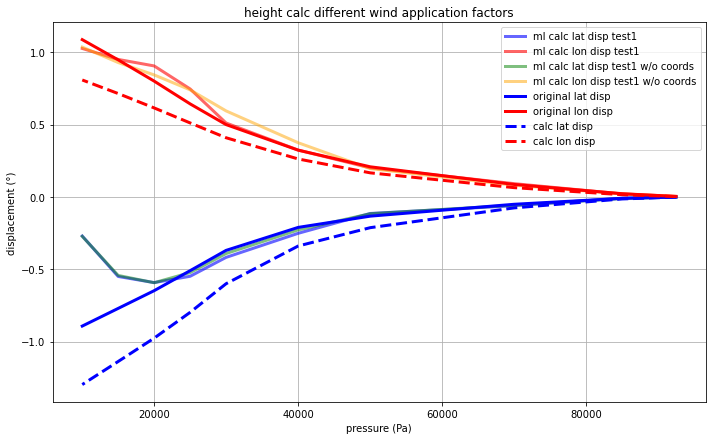

lat disp rmse:  0.21096505539996552
lon disp rmse:  0.05062070246551348
lat disp rmse w/o coords:  0.20995376657714634
lon disp rmse w/o coords:  0.05100160502536445
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


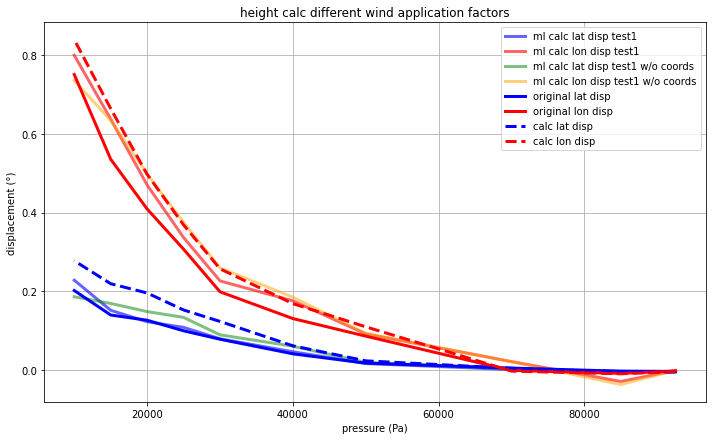

lat disp rmse:  0.009846993239417992
lon disp rmse:  0.04602811817744803
lat disp rmse w/o coords:  0.01811912320016776
lon disp rmse w/o coords:  0.05532328898542907
[92510.0, 84980.0, 70000.0, 50000.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


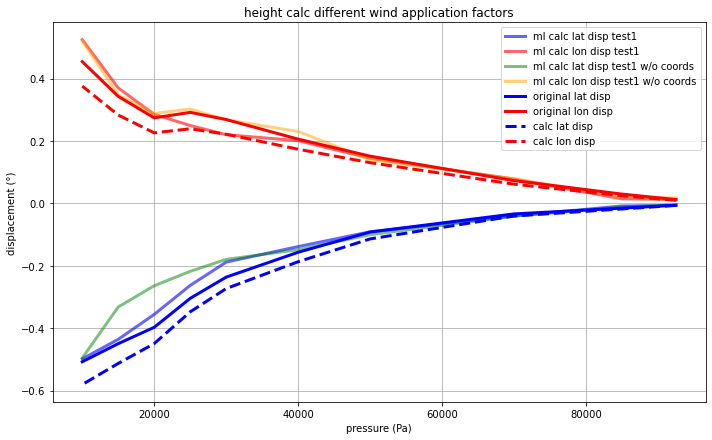

lat disp rmse:  0.02541903892200429
lon disp rmse:  0.032055833483858945
lat disp rmse w/o coords:  0.06530777888320152
lon disp rmse w/o coords:  0.023580989819845848
[92520.0, 85020.0, 69980.0, 50000.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


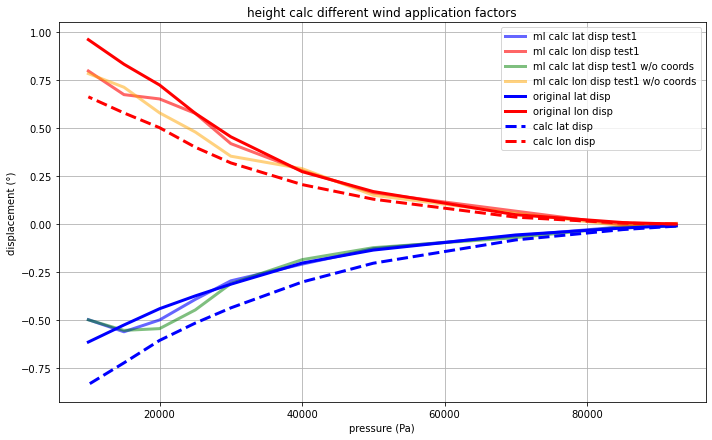

lat disp rmse:  0.0437639001816594
lon disp rmse:  0.0767766885258269
lat disp rmse w/o coords:  0.05578695952941635
lon disp rmse w/o coords:  0.09359929051148395
[99810.0, 92480.0, 85010.0, 69990.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


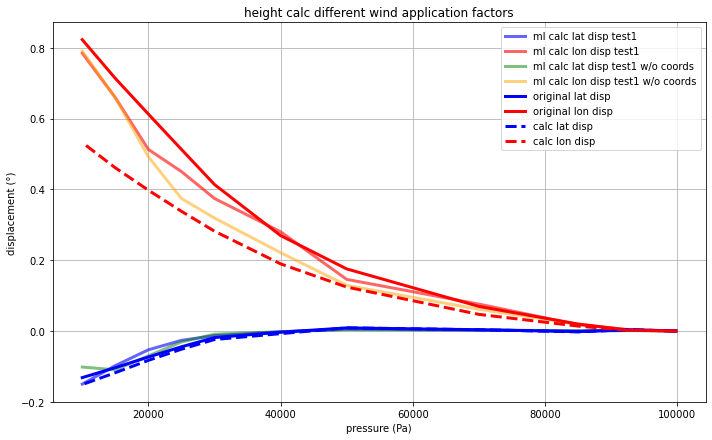

lat disp rmse:  0.010295482557997946
lon disp rmse:  0.04358451678923838
lat disp rmse w/o coords:  0.010656304588824318
lon disp rmse w/o coords:  0.06824722743250827
[99990.0, 92490.0, 84990.0, 70020.0, 50020.0, 40000.0, 29990.0, 25000.0, 20010.0, 15000.0, 10000.0]


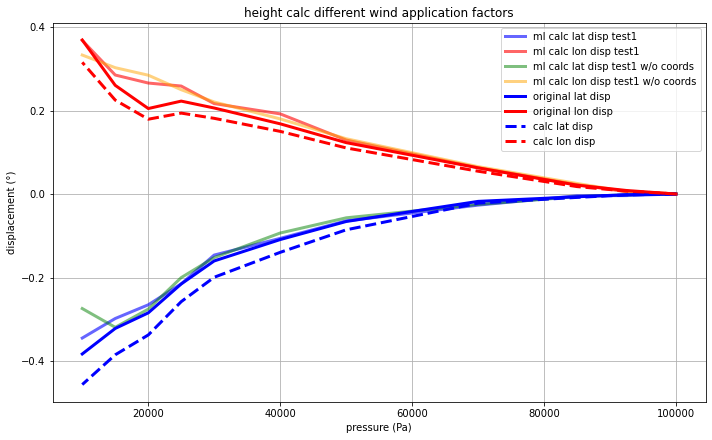

lat disp rmse:  0.01564690836646567
lon disp rmse:  0.02405879675473641
lat disp rmse w/o coords:  0.03383137738102365
lon disp rmse w/o coords:  0.03114144133544529
[100010.0, 92480.0, 85020.0, 70000.0, 50020.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


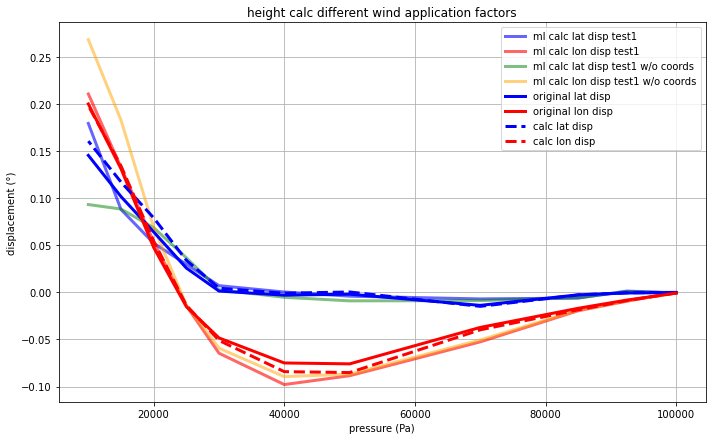

lat disp rmse:  0.012093103319269972
lon disp rmse:  0.011048864350175125
lat disp rmse w/o coords:  0.01688378400068596
lon disp rmse w/o coords:  0.027657427496153623
[70000.0, 49990.0, 40020.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


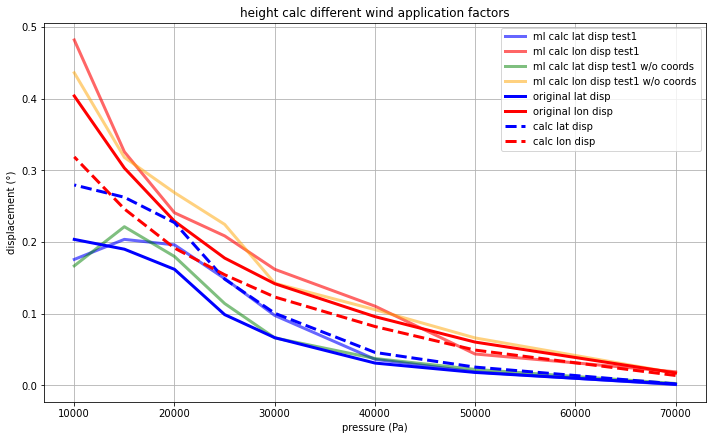

lat disp rmse:  0.026589919259841662
lon disp rmse:  0.03282156104733869
lat disp rmse w/o coords:  0.019263799568260874
lon disp rmse w/o coords:  0.025480412495860156
[92490.0, 85030.0, 70010.0, 50010.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


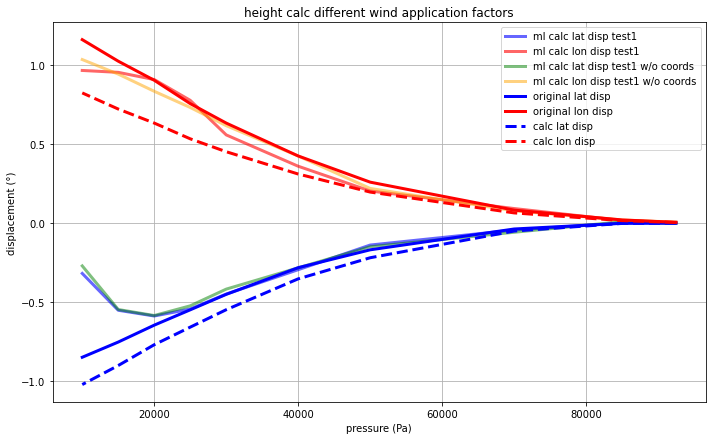

lat disp rmse:  0.18074838872821264
lon disp rmse:  0.07521656342036254
lat disp rmse w/o coords:  0.19581710428823848
lon disp rmse w/o coords:  0.05470425299619285
[92510.0, 84990.0, 69990.0, 49990.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


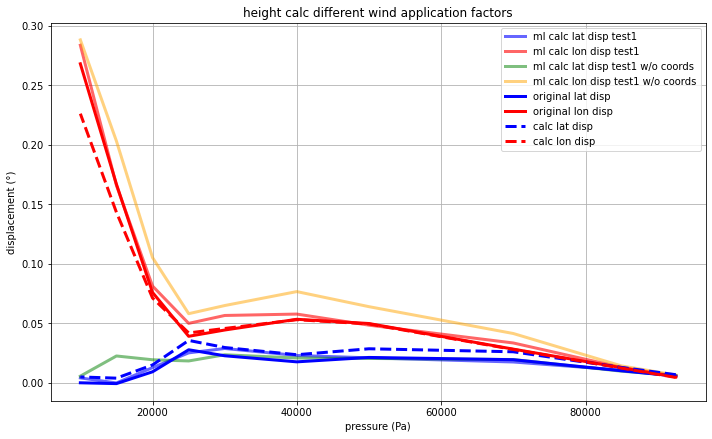

lat disp rmse:  0.0032728743629902132
lon disp rmse:  0.007678559647166901
lat disp rmse w/o coords:  0.008802954491625605
lon disp rmse w/o coords:  0.020702987294896485
[70000.0, 49990.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


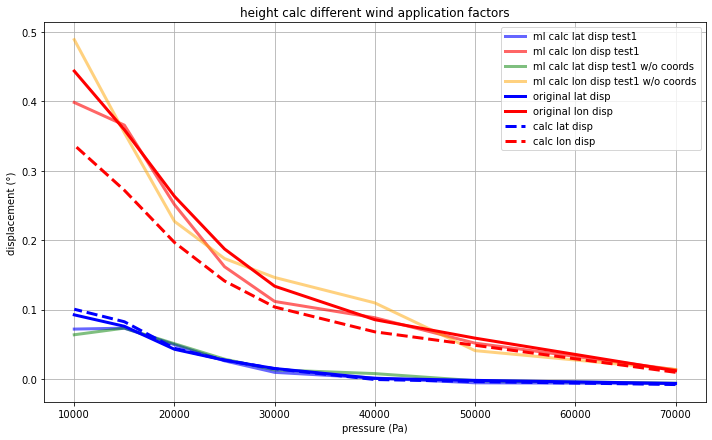

lat disp rmse:  0.008025400958576501
lon disp rmse:  0.020695528042592948
lat disp rmse w/o coords:  0.010879956620022639
lon disp rmse w/o coords:  0.024040337426852434
[92510.0, 84990.0, 70020.0, 50020.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


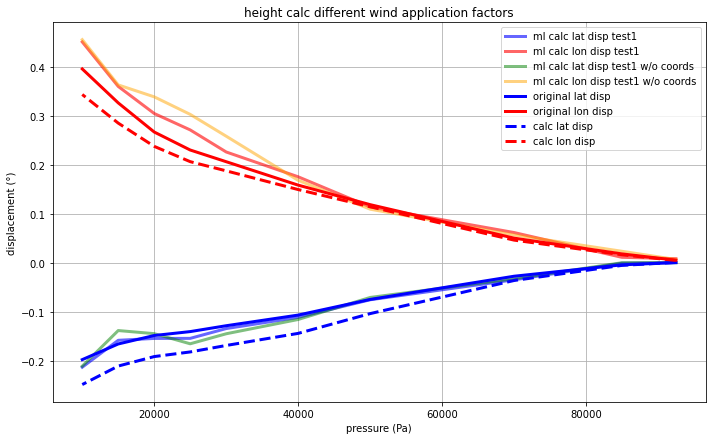

lat disp rmse:  0.008002697828781009
lon disp rmse:  0.028576227423349934
lat disp rmse w/o coords:  0.014037323697331816
lon disp rmse w/o coords:  0.042789751840307595
[92520.0, 85010.0, 70010.0, 50010.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


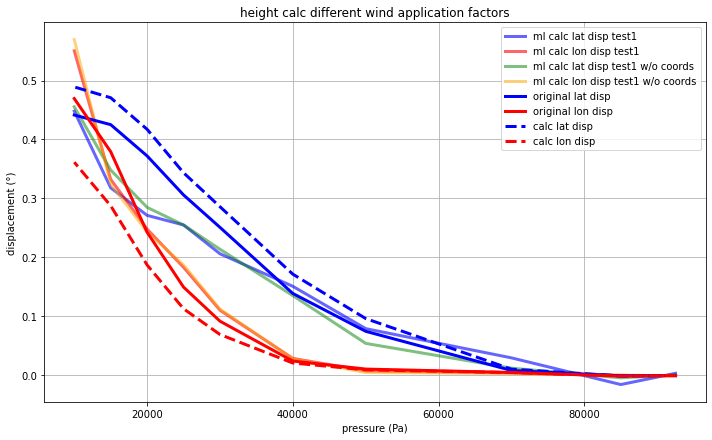

lat disp rmse:  0.052085582076256444
lon disp rmse:  0.03205973257555863
lat disp rmse w/o coords:  0.042603567936193805
lon disp rmse w/o coords:  0.0385828992005316
[99990.0, 92510.0, 85020.0, 70000.0, 49980.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


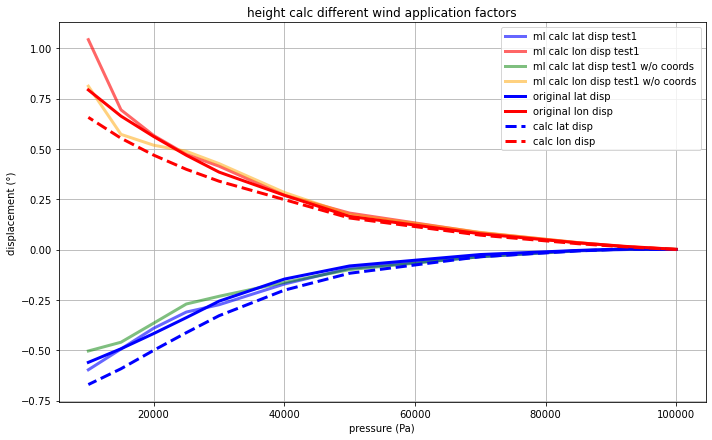

lat disp rmse:  0.019111714109084514
lon disp rmse:  0.07662795584900743
lat disp rmse w/o coords:  0.03412743953636124
lon disp rmse w/o coords:  0.03427263816580448
[92510.0, 85020.0, 69990.0, 50020.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


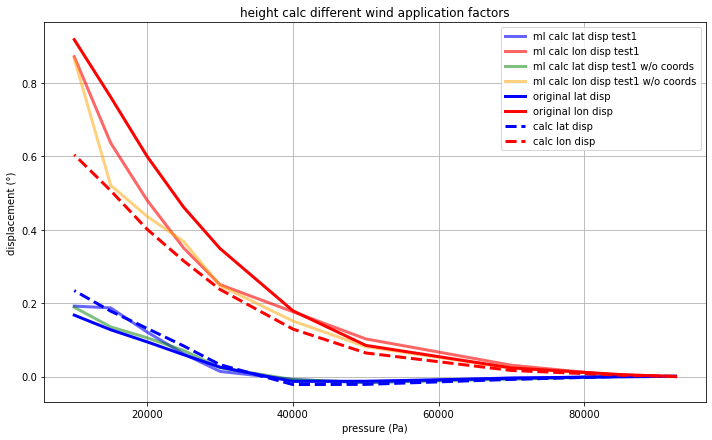

lat disp rmse:  0.022477172295872892
lon disp rmse:  0.07383374710486332
lat disp rmse w/o coords:  0.009072628043534401
lon disp rmse w/o coords:  0.10340491363421733
[100030.0, 92490.0, 85000.0, 70020.0, 50010.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


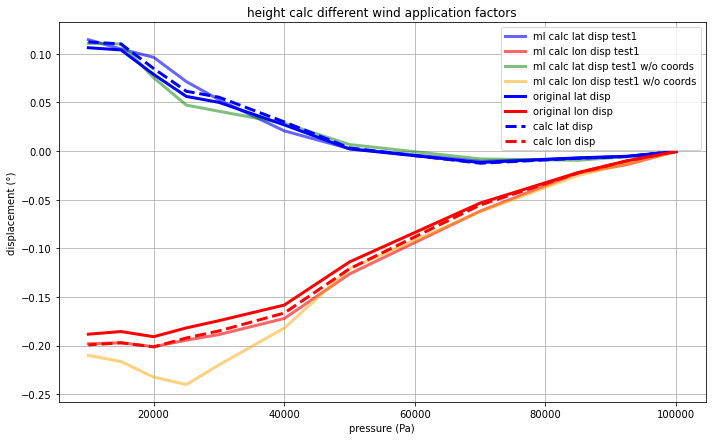

lat disp rmse:  0.007730485446190715
lon disp rmse:  0.0101164353534108
lat disp rmse w/o coords:  0.005000780544084311
lon disp rmse w/o coords:  0.02909864010443861
[92350.0, 84990.0, 69980.0, 49990.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


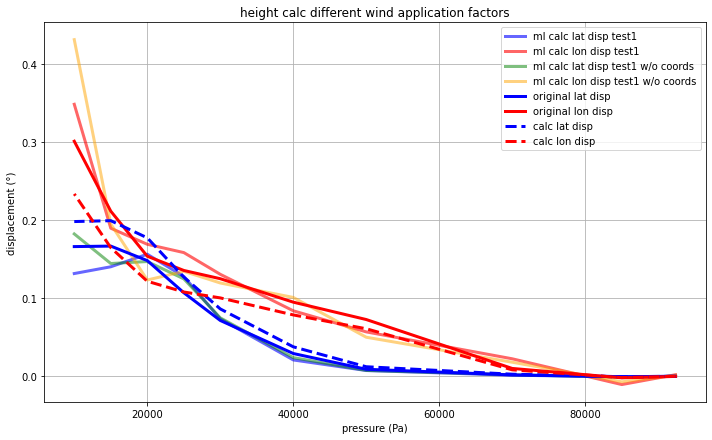

lat disp rmse:  0.01570826127123249
lon disp rmse:  0.020283834729827324
lat disp rmse w/o coords:  0.010591671446211436
lon disp rmse w/o coords:  0.043369714913562445
[92470.0, 84980.0, 69990.0, 50010.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10010.0]


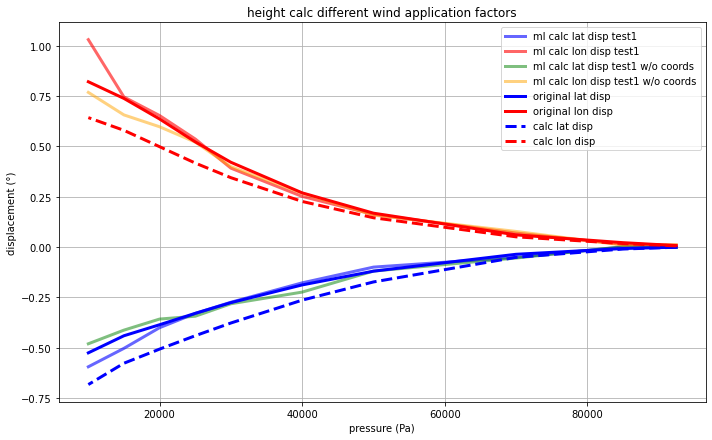

lat disp rmse:  0.031188776729614908
lon disp rmse:  0.06757781906899972
lat disp rmse w/o coords:  0.023554958925232645
lon disp rmse w/o coords:  0.034668636652467645
[92490.0, 85030.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


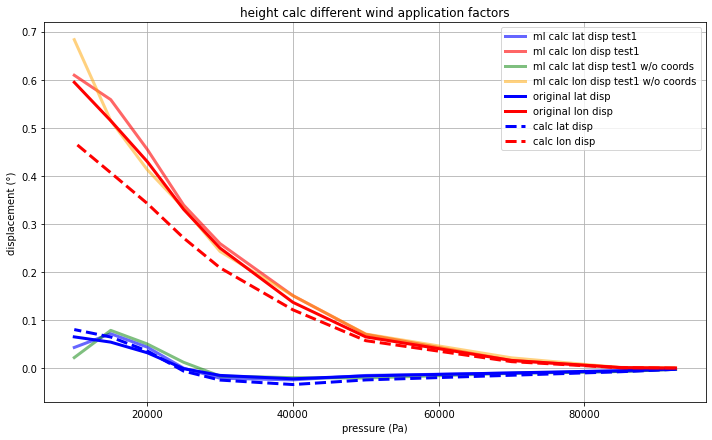

lat disp rmse:  0.009853911793013544
lon disp rmse:  0.017803666418144303
lat disp rmse w/o coords:  0.017306367005839807
lon disp rmse w/o coords:  0.029105515454733107
[85030.0, 70030.0, 49990.0, 39990.0, 30000.0, 25000.0, 20010.0, 15010.0, 10000.0]


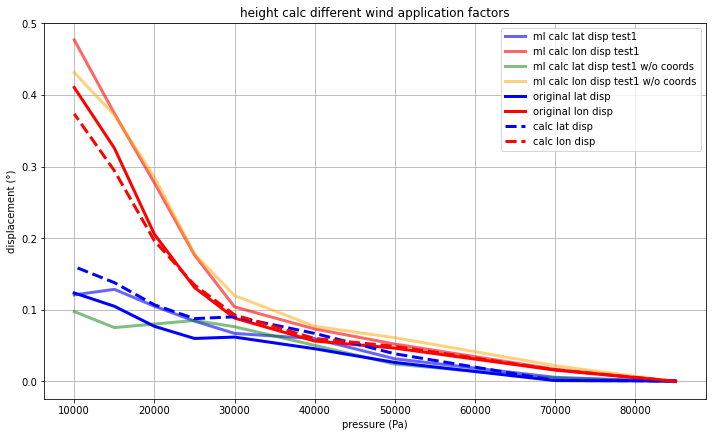

lat disp rmse:  0.015706236878453263
lon disp rmse:  0.04021859348144631
lat disp rmse w/o coords:  0.01649828531954939
lon disp rmse w/o coords:  0.03773501350836096
[85020.0, 70020.0, 49990.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


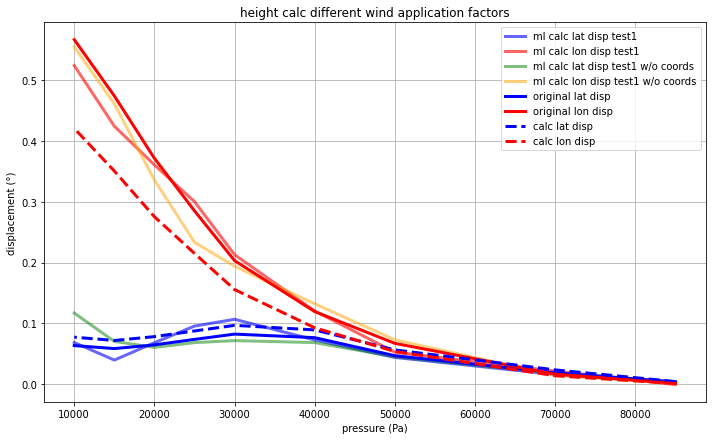

lat disp rmse:  0.012895105402707592
lon disp rmse:  0.023522250307541098
lat disp rmse w/o coords:  0.0189549171098616
lon disp rmse w/o coords:  0.02245413780214343
[92480.0, 84980.0, 70020.0, 49980.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


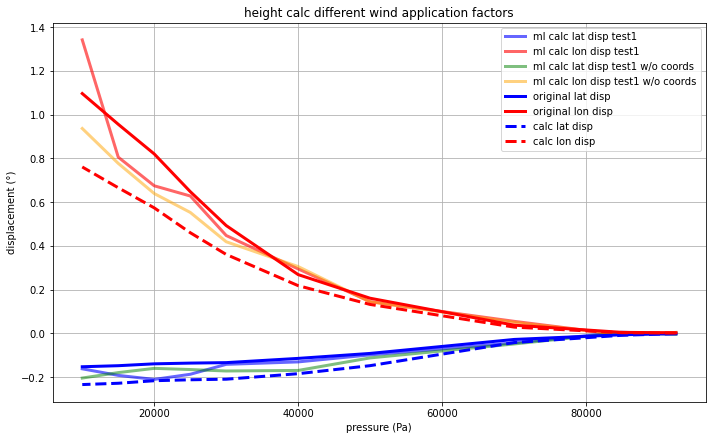

lat disp rmse:  0.03232557093938393
lon disp rmse:  0.10373762426856395
lat disp rmse w/o coords:  0.03222887110663603
lon disp rmse w/o coords:  0.10319630589712156
[92480.0, 85000.0, 69990.0, 50000.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


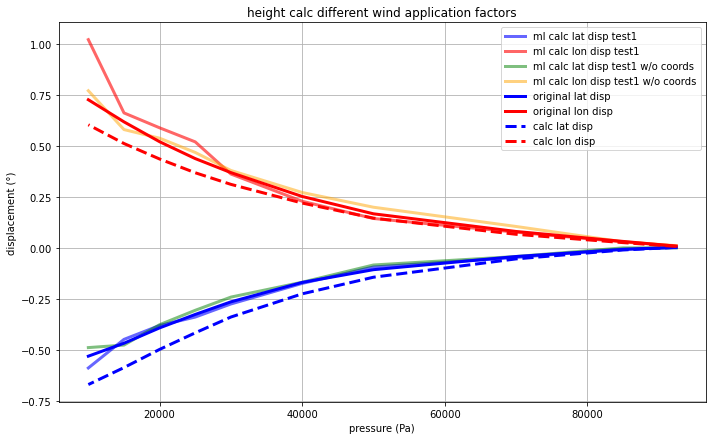

lat disp rmse:  0.020854991603783467
lon disp rmse:  0.10069209306632623
lat disp rmse w/o coords:  0.019125917515726624
lon disp rmse w/o coords:  0.025960122806618243
[100030.0, 92500.0, 85010.0, 69990.0, 50020.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


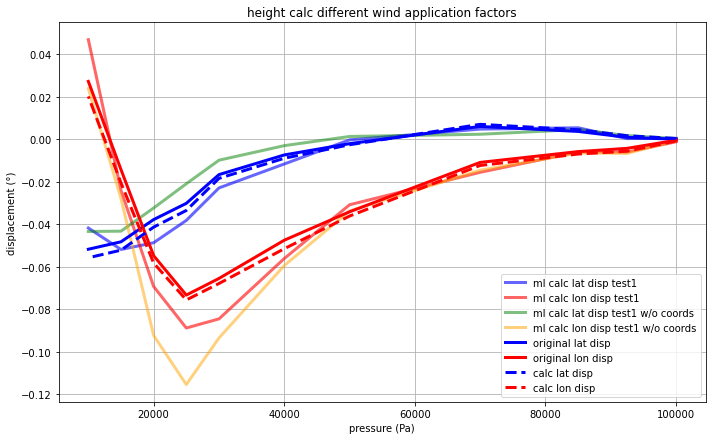

lat disp rmse:  0.0057275976516335605
lon disp rmse:  0.011300027254469883
lat disp rmse w/o coords:  0.005232100293785508
lon disp rmse w/o coords:  0.019822883206762416
[92530.0, 84990.0, 70020.0, 50020.0, 40000.0, 29990.0, 25000.0, 20010.0, 15000.0, 10000.0]


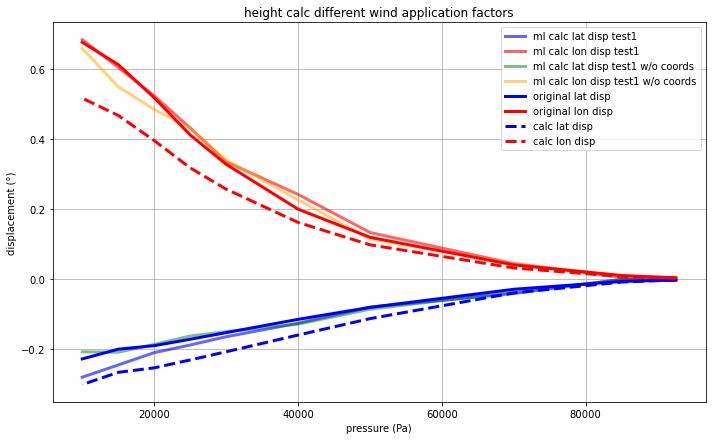

lat disp rmse:  0.02420809405899981
lon disp rmse:  0.016150803938857896
lat disp rmse w/o coords:  0.009452255339659607
lon disp rmse w/o coords:  0.025761171679566243
[99980.0, 92470.0, 85000.0, 69990.0, 49990.0, 40010.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


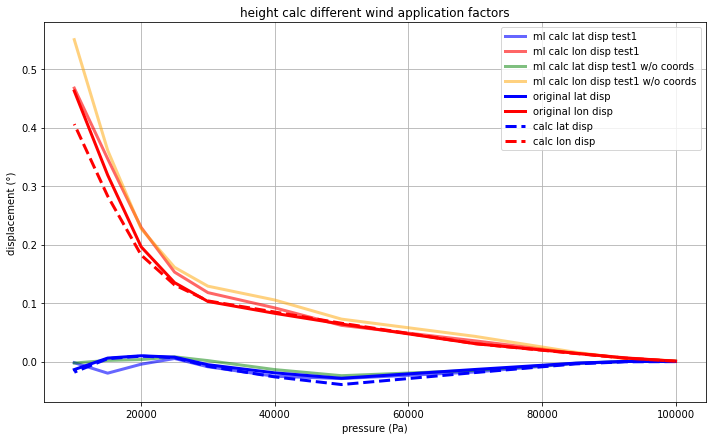

lat disp rmse:  0.009927211591638282
lon disp rmse:  0.015275925796393386
lat disp rmse w/o coords:  0.005098032014527785
lon disp rmse w/o coords:  0.03381597944877188
[92510.0, 85010.0, 70010.0, 50010.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


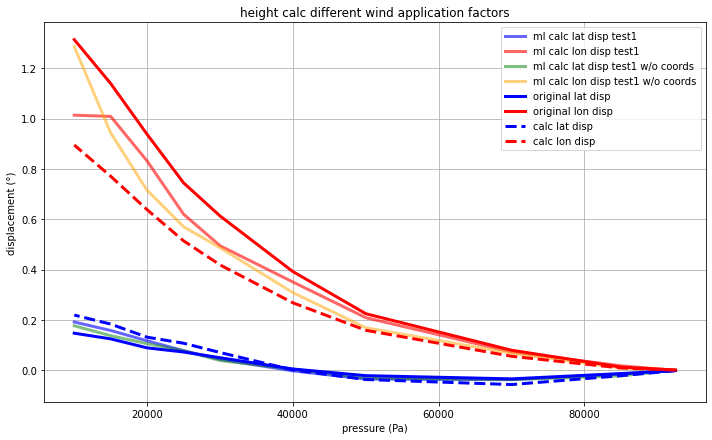

lat disp rmse:  0.020472527897907704
lon disp rmse:  0.12236513490109624
lat disp rmse w/o coords:  0.01278422056781443
lon disp rmse w/o coords:  0.12044221963781529
[99970.0, 92500.0, 84990.0, 70000.0, 50010.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


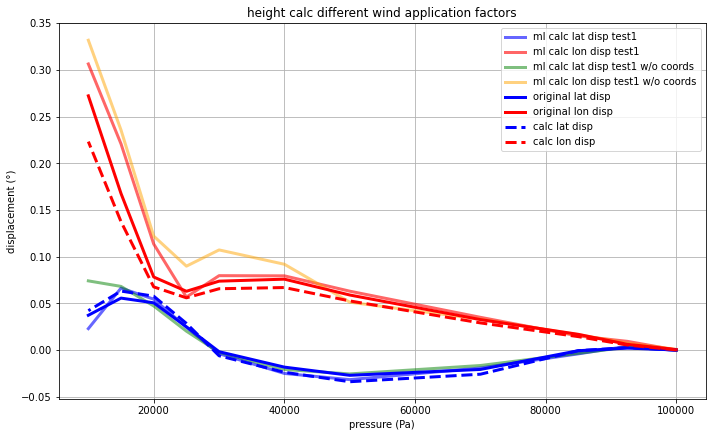

lat disp rmse:  0.006221454790080046
lon disp rmse:  0.02208680406049415
lat disp rmse w/o coords:  0.011998278436573995
lon disp rmse w/o coords:  0.03337867276305294
[92480.0, 85000.0, 70020.0, 49990.0, 39990.0, 30000.0, 25010.0, 20000.0, 15010.0, 10000.0]


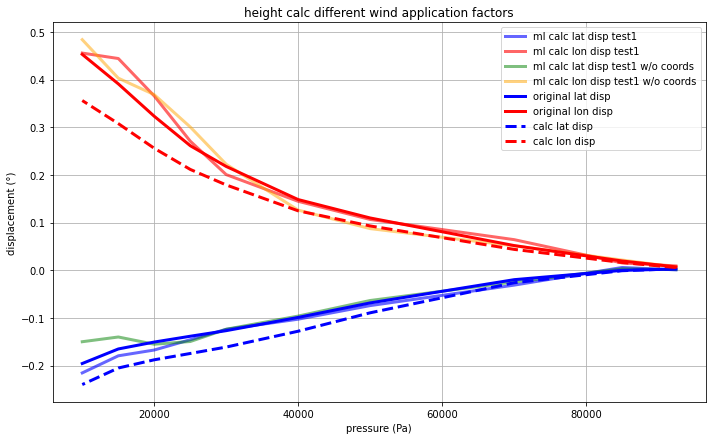

lat disp rmse:  0.010733117700817028
lon disp rmse:  0.02288203299891115
lat disp rmse w/o coords:  0.017137951970669543
lon disp rmse w/o coords:  0.023886328528884396
[100000.0, 92530.0, 85000.0, 70000.0, 50010.0, 40000.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


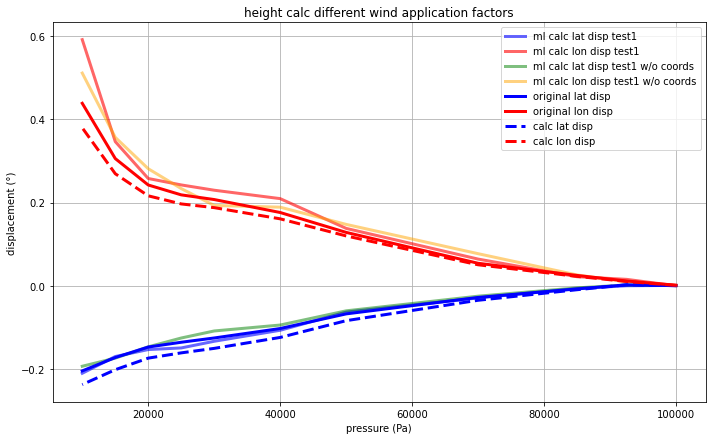

lat disp rmse:  0.005780729080748317
lon disp rmse:  0.0501763161488839
lat disp rmse w/o coords:  0.007712564910044655
lon disp rmse w/o coords:  0.03147418270282422
[85020.0, 70000.0, 50000.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


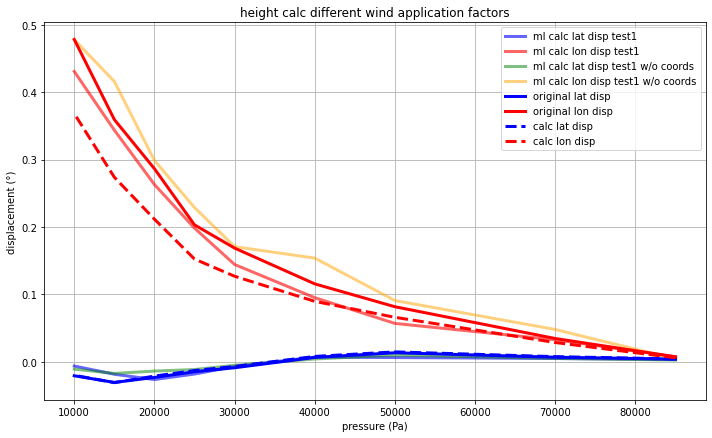

lat disp rmse:  0.006963352633788843
lon disp rmse:  0.022857443578230257
lat disp rmse w/o coords:  0.006749424875473482
lon disp rmse w/o coords:  0.025247306688355106
[70010.0, 50000.0, 40020.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


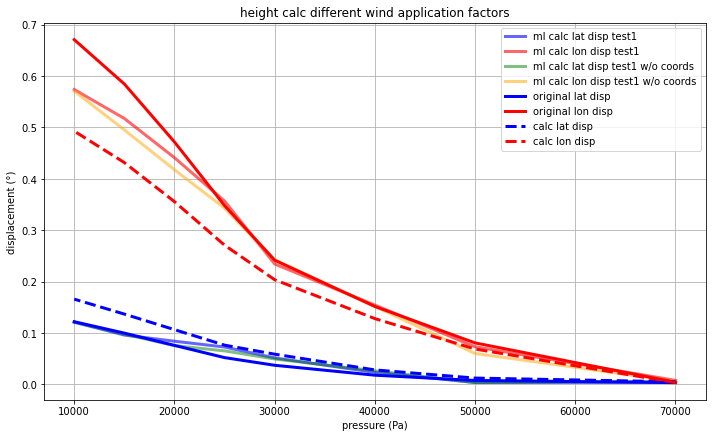

lat disp rmse:  0.009738115702810605
lon disp rmse:  0.04339479268810837
lat disp rmse w/o coords:  0.007276203134610966
lon disp rmse w/o coords:  0.051722333917959926
[92480.0, 85020.0, 70010.0, 50010.0, 40010.0, 29990.0, 25000.0, 20010.0, 15010.0, 10000.0]


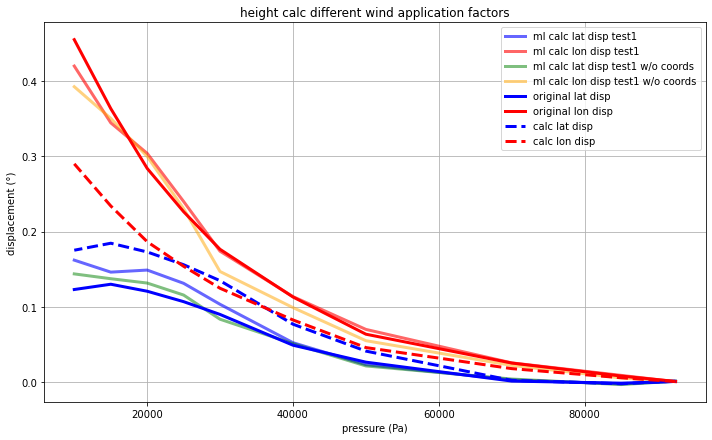

lat disp rmse:  0.01834062678974791
lon disp rmse:  0.014886833013760536
lat disp rmse w/o coords:  0.008705780974942633
lon disp rmse w/o coords:  0.02342527605225804
[70020.0, 50010.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


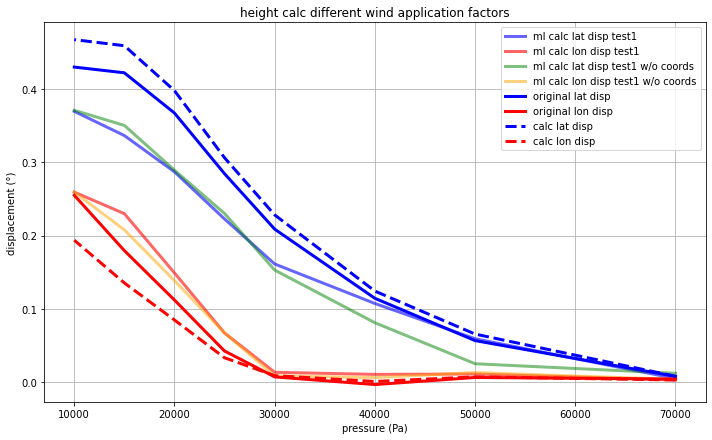

lat disp rmse:  0.05420938114086926
lon disp rmse:  0.02443843604491548
lat disp rmse w/o coords:  0.05344309263984208
lon disp rmse w/o coords:  0.01678560765756402
[92490.0, 85010.0, 70000.0, 49990.0, 40010.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


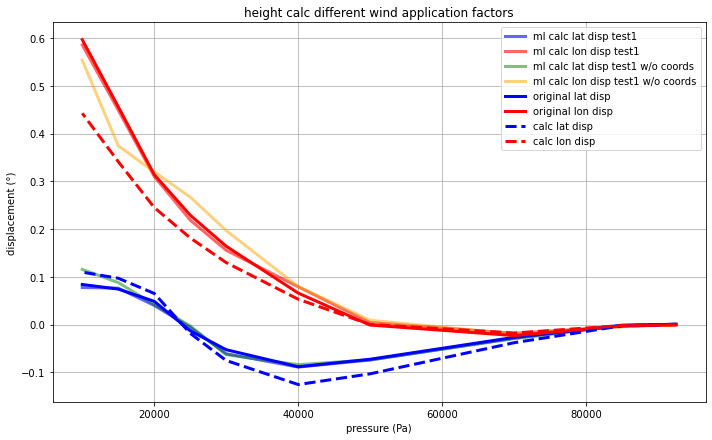

lat disp rmse:  0.005033178616917579
lon disp rmse:  0.007734101187571529
lat disp rmse w/o coords:  0.012106222153023824
lon disp rmse w/o coords:  0.033777843831120896
[92490.0, 85000.0, 70010.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


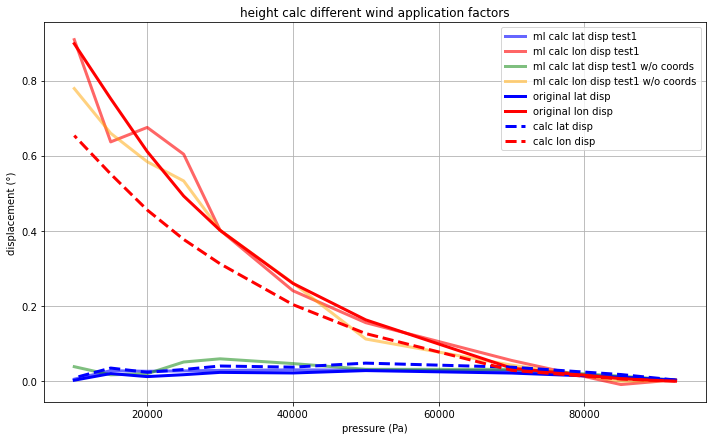

lat disp rmse:  0.007115687183388279
lon disp rmse:  0.05566592082189004
lat disp rmse w/o coords:  0.021352557771415412
lon disp rmse w/o coords:  0.052716433387686404
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0]


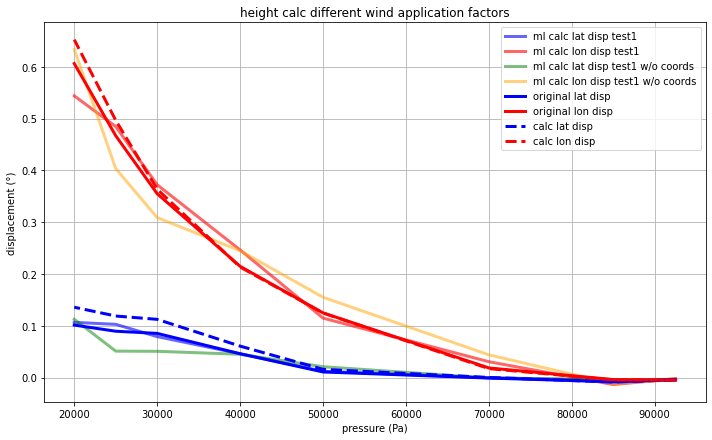

lat disp rmse:  0.005613191852271527
lon disp rmse:  0.027045272311780832
lat disp rmse w/o coords:  0.019107708580743853
lon disp rmse w/o coords:  0.034293722158876314
[99980.0, 92520.0, 84980.0, 70020.0, 50020.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


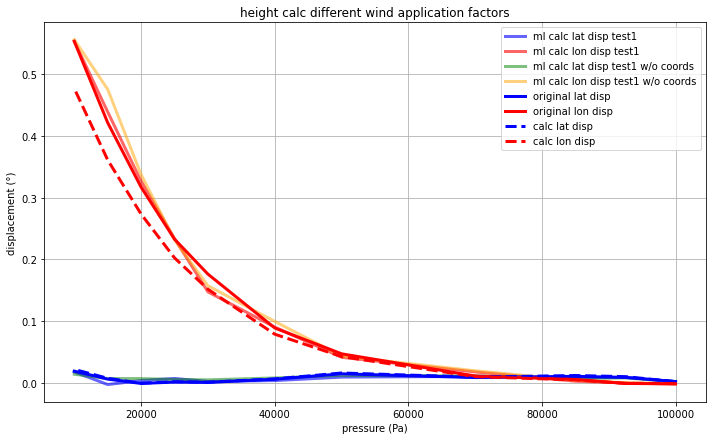

lat disp rmse:  0.00402266078282207
lon disp rmse:  0.010941069433590484
lat disp rmse w/o coords:  0.0037315806210444238
lon disp rmse w/o coords:  0.0188261665782371
[84980.0, 70020.0, 50000.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


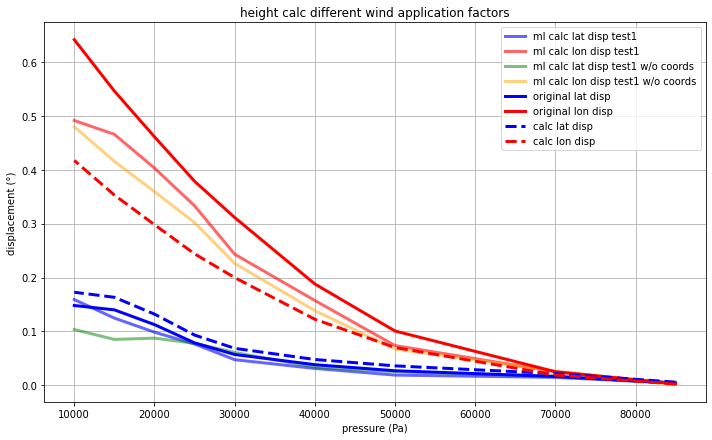

lat disp rmse:  0.009222962024270375
lon disp rmse:  0.06723075498737438
lat disp rmse w/o coords:  0.025080579908089706
lon disp rmse w/o coords:  0.0882967367396356
[99990.0, 92510.0, 84980.0, 70020.0, 50010.0, 40010.0, 30010.0, 25000.0, 20010.0, 15010.0, 10000.0]


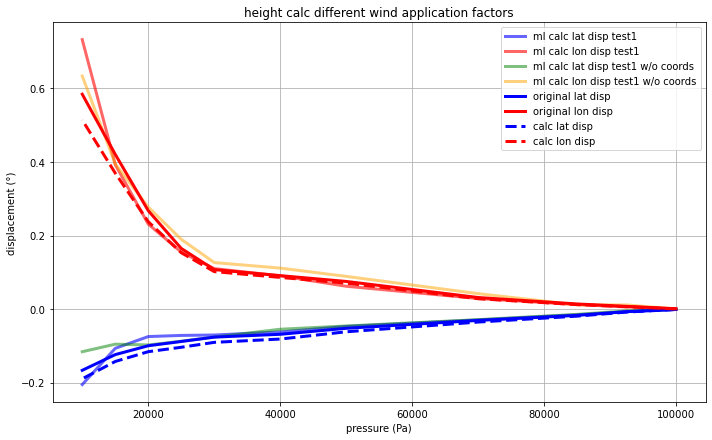

lat disp rmse:  0.015917312314264416
lon disp rmse:  0.04711306199575611
lat disp rmse w/o coords:  0.01811875721476003
lon disp rmse w/o coords:  0.02116444945192216
[99990.0, 92480.0, 84990.0, 69990.0, 50010.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


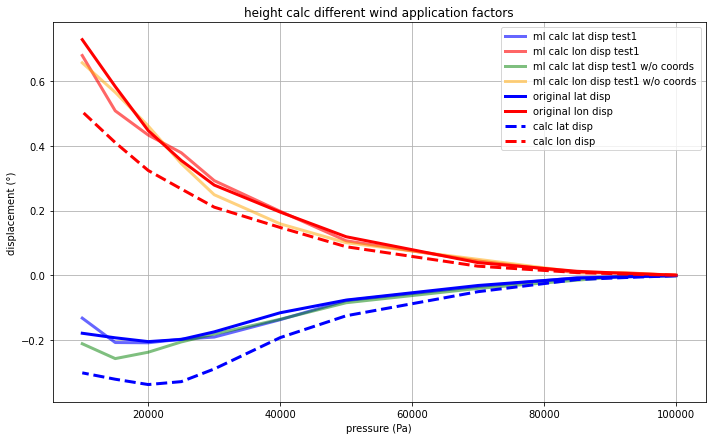

lat disp rmse:  0.016919553912427887
lon disp rmse:  0.02894062579968131
lat disp rmse w/o coords:  0.0251612417041122
lon disp rmse w/o coords:  0.0276251597834516
[84990.0, 70010.0, 50020.0, 40000.0, 30010.0, 24990.0, 20010.0, 15000.0, 10000.0]


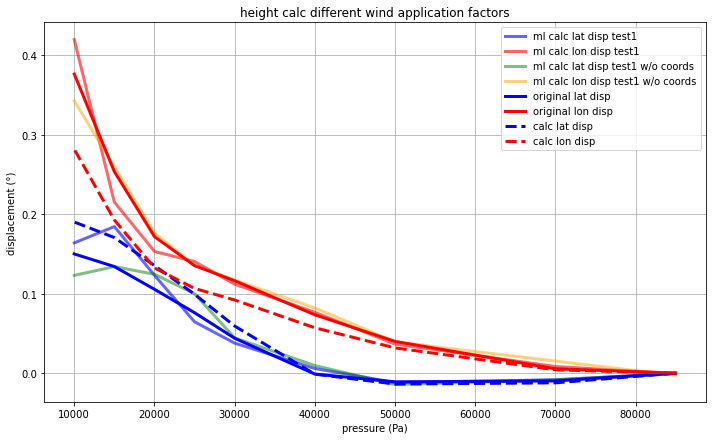

lat disp rmse:  0.019017757135141682
lon disp rmse:  0.020465108408849027
lat disp rmse w/o coords:  0.014094560033562015
lon disp rmse w/o coords:  0.01237429196426151
[84990.0, 69990.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


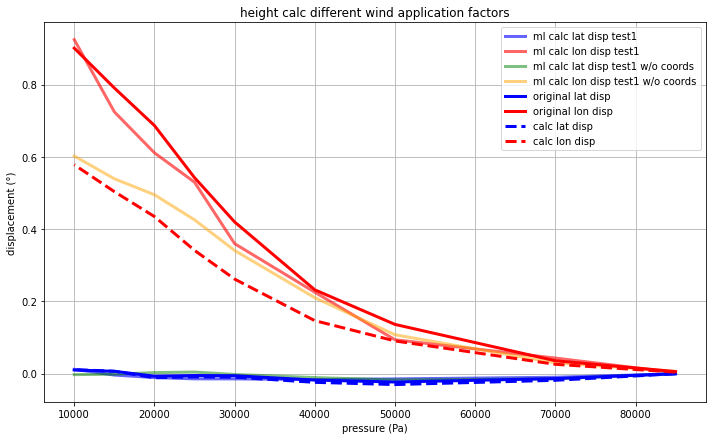

lat disp rmse:  0.006499135233945796
lon disp rmse:  0.04259722870519642
lat disp rmse w/o coords:  0.007526673413950681
lon disp rmse w/o coords:  0.1528853627811337
[99540.0, 92530.0, 85020.0, 70020.0, 50010.0, 39990.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


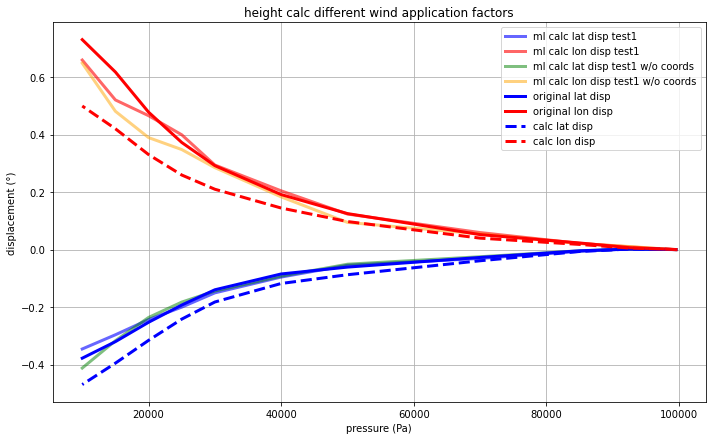

lat disp rmse:  0.013579449900875788
lon disp rmse:  0.037609480387954655
lat disp rmse w/o coords:  0.012656148814707963
lon disp rmse w/o coords:  0.05628673085102847
[85000.0, 70010.0, 50020.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


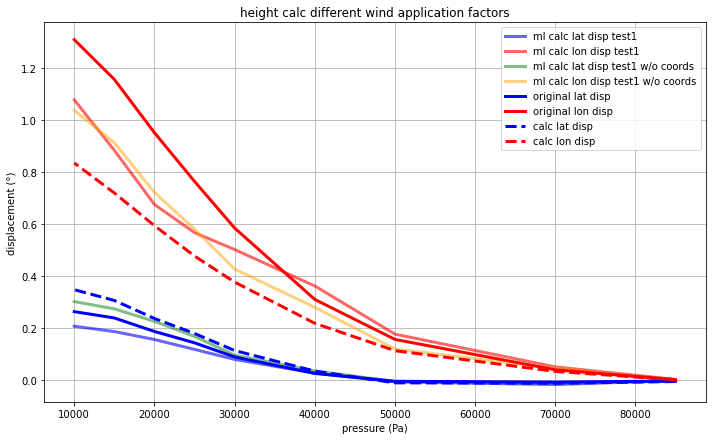

lat disp rmse:  0.029194199678777993
lon disp rmse:  0.16778399628880583
lat disp rmse w/o coords:  0.023560042347429953
lon disp rmse w/o coords:  0.16562973965430397
[99780.0, 92500.0, 84990.0, 70010.0, 50000.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


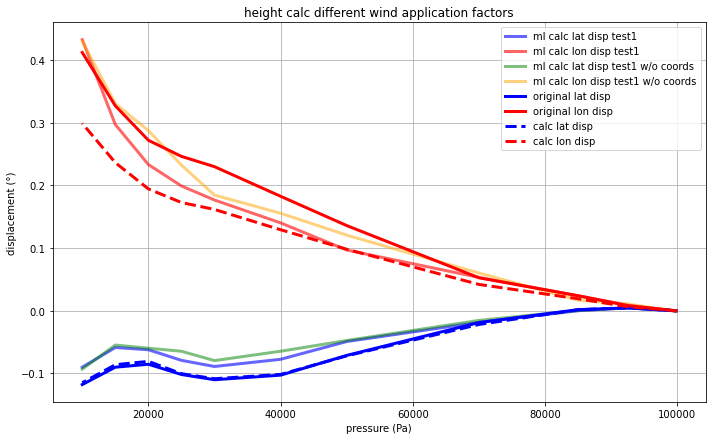

lat disp rmse:  0.01996161467586057
lon disp rmse:  0.0319313756615664
lat disp rmse w/o coords:  0.02497029764705575
lon disp rmse w/o coords:  0.018848463578620456
[92490.0, 84990.0, 70000.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


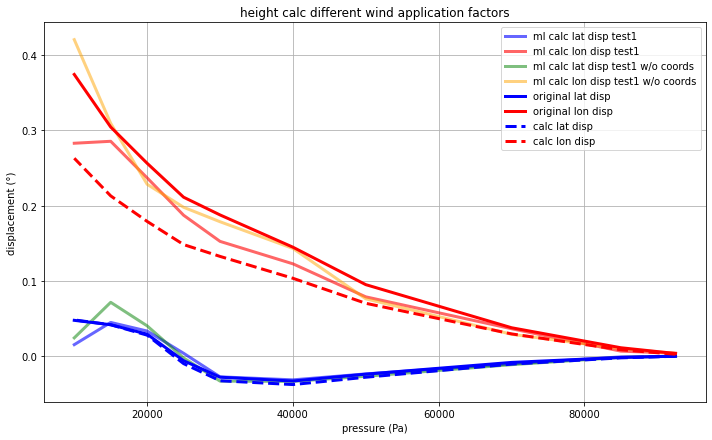

lat disp rmse:  0.010843882817853989
lon disp rmse:  0.03415213178896201
lat disp rmse w/o coords:  0.012678270181451361
lon disp rmse w/o coords:  0.019066634769852063
[85010.0, 69990.0, 50000.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


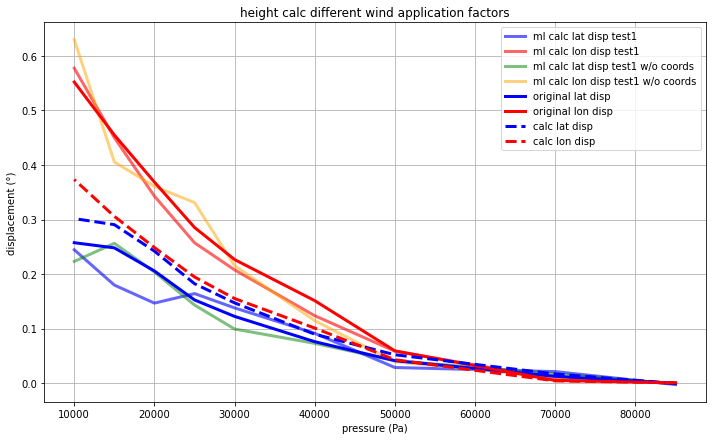

lat disp rmse:  0.031912079792388
lon disp rmse:  0.019004668002893983
lat disp rmse w/o coords:  0.014560044582439806
lon disp rmse w/o coords:  0.03733894274819925
[92490.0, 85010.0, 70000.0, 49990.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


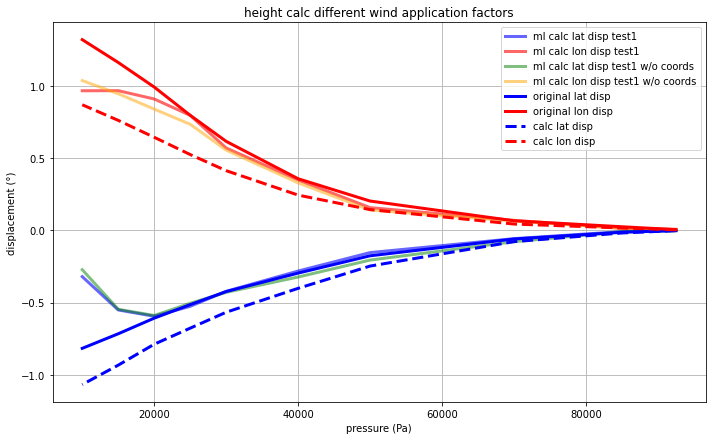

lat disp rmse:  0.16558052019032352
lon disp rmse:  0.13196772834052753
lat disp rmse w/o coords:  0.18089667692775427
lon disp rmse w/o coords:  0.1274323443034523
[99980.0, 92510.0, 85030.0, 70020.0, 49990.0, 40010.0, 30010.0, 24990.0, 20010.0, 15010.0, 10000.0]


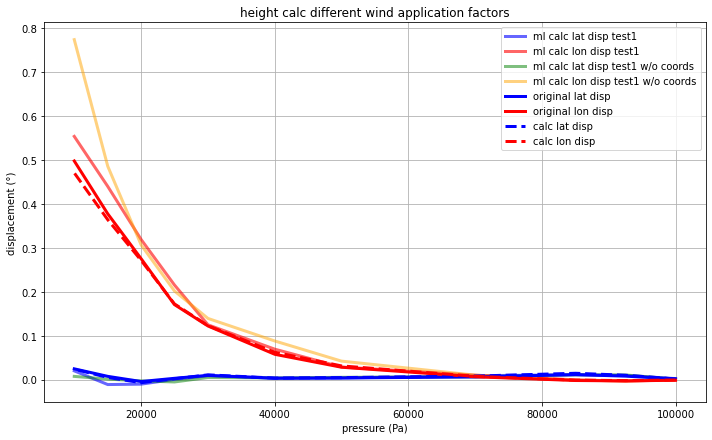

lat disp rmse:  0.006195496955454511
lon disp rmse:  0.03171533747483769
lat disp rmse w/o coords:  0.006329942876229344
lon disp rmse w/o coords:  0.09105062524815383
[100020.0, 92490.0, 84990.0, 69990.0, 50020.0, 40000.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


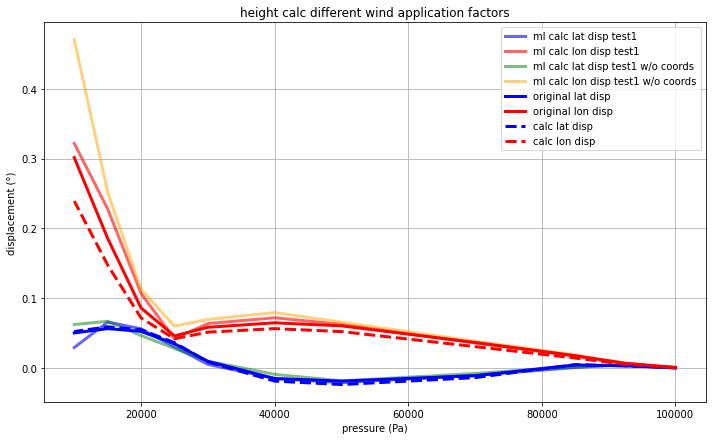

lat disp rmse:  0.0073993113265768155
lon disp rmse:  0.015784460190708102
lat disp rmse w/o coords:  0.005982423095432457
lon disp rmse w/o coords:  0.05587721263204604
[92480.0, 85010.0, 69980.0, 50020.0, 40000.0, 30000.0, 25000.0, 20000.0, 15010.0, 10000.0]


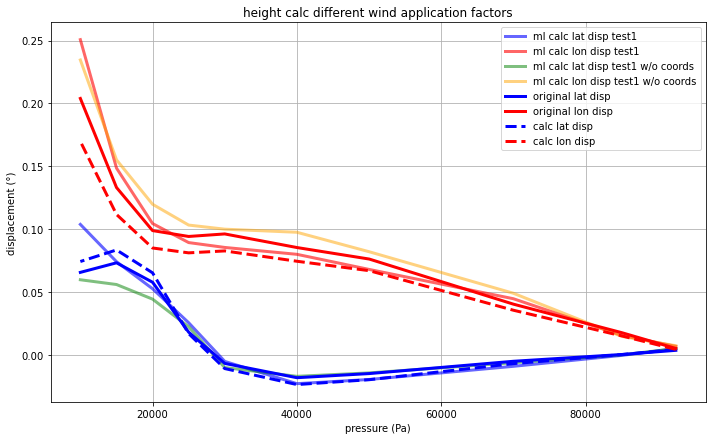

lat disp rmse:  0.012664817628423431
lon disp rmse:  0.01648186216971958
lat disp rmse w/o coords:  0.007396127499287325
lon disp rmse w/o coords:  0.014905663770348973
[99990.0, 92530.0, 85010.0, 70020.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


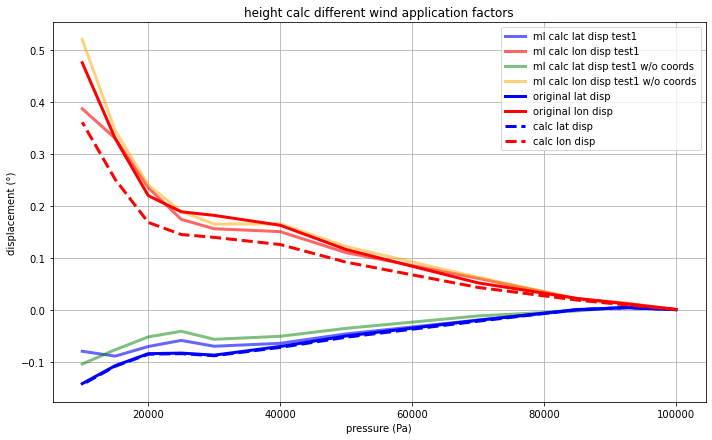

lat disp rmse:  0.022067499910472507
lon disp rmse:  0.028946960661589683
lat disp rmse w/o coords:  0.024850972578108987
lon disp rmse w/o coords:  0.01666721740473477
[92530.0, 85010.0, 70020.0, 50000.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


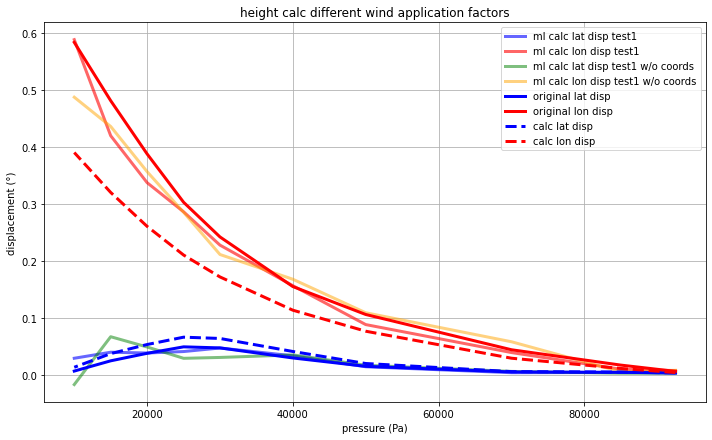

lat disp rmse:  0.009068952917081635
lon disp rmse:  0.026928591114354326
lat disp rmse w/o coords:  0.017896400517810246
lon disp rmse w/o coords:  0.03754151801256557
[100020.0, 92530.0, 84990.0, 70010.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


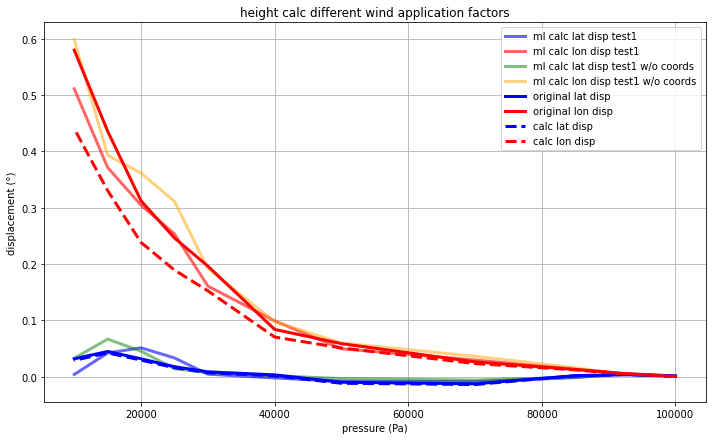

lat disp rmse:  0.011629033881005165
lon disp rmse:  0.030983165786264345
lat disp rmse w/o coords:  0.008390039277716877
lon disp rmse w/o coords:  0.028812223468559744
[100010.0, 92510.0, 84990.0, 70000.0, 50020.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


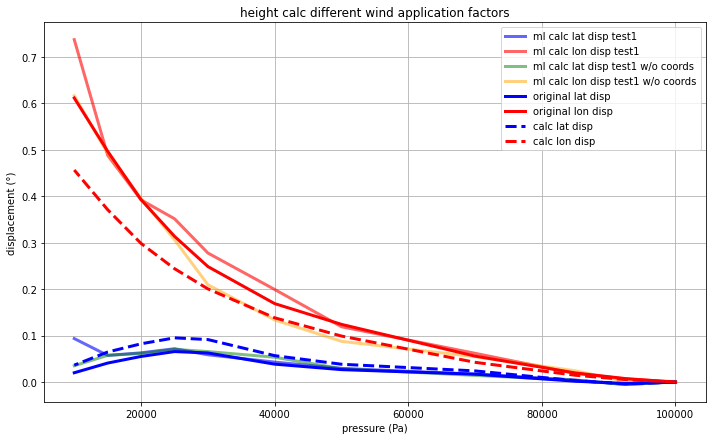

lat disp rmse:  0.023045672167284165
lon disp rmse:  0.04171233181809863
lat disp rmse w/o coords:  0.008632614132716526
lon disp rmse w/o coords:  0.019708241398141563
[85010.0, 69990.0, 50000.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


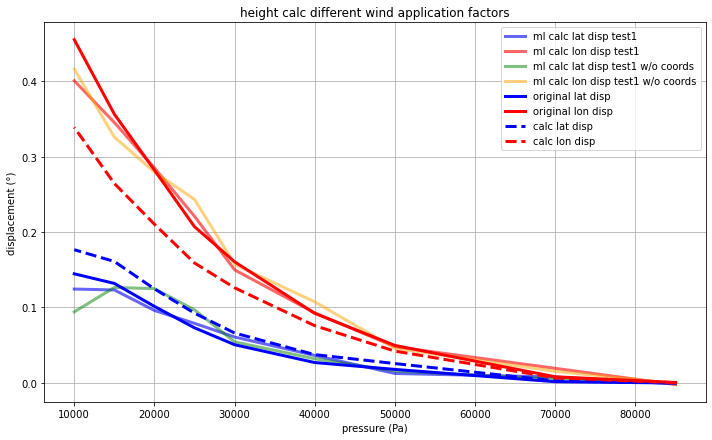

lat disp rmse:  0.009496755873345206
lon disp rmse:  0.019881053414114735
lat disp rmse w/o coords:  0.020441792744688086
lon disp rmse w/o coords:  0.021274158167047433
[99990.0, 92510.0, 84990.0, 70010.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


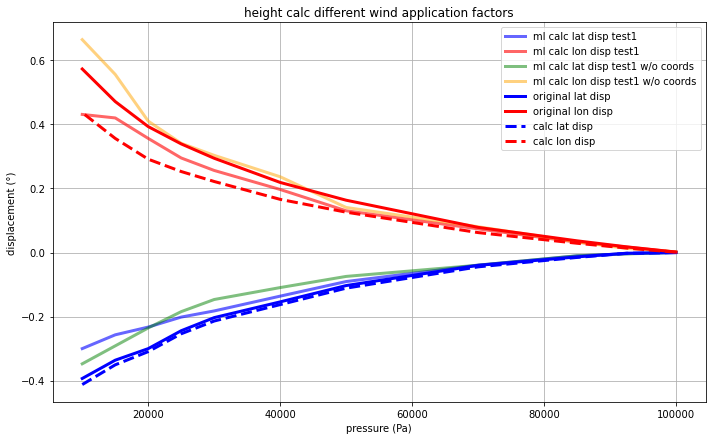

lat disp rmse:  0.044958337803233855
lon disp rmse:  0.05144303472008163
lat disp rmse w/o coords:  0.040268954155541235
lon disp rmse w/o coords:  0.0390944274830115
[92490.0, 85020.0, 69990.0, 49990.0, 40020.0, 30000.0, 24990.0, 20010.0, 15000.0, 10000.0]


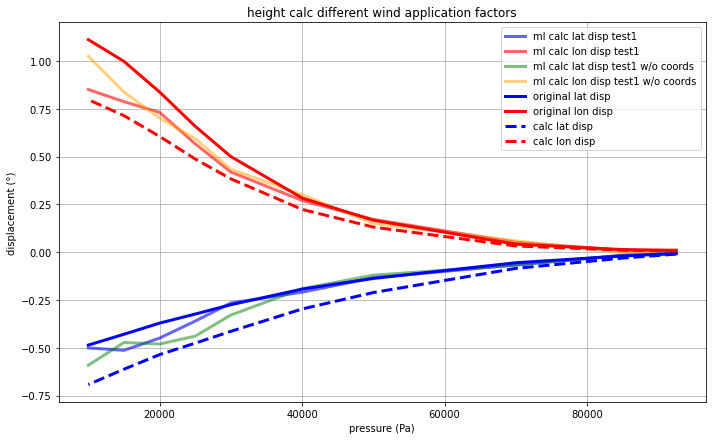

lat disp rmse:  0.03907386925427258
lon disp rmse:  0.11787131333031908
lat disp rmse w/o coords:  0.06452379442644197
lon disp rmse w/o coords:  0.07838381278049822
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0]
[70020.0, 49990.0, 39990.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


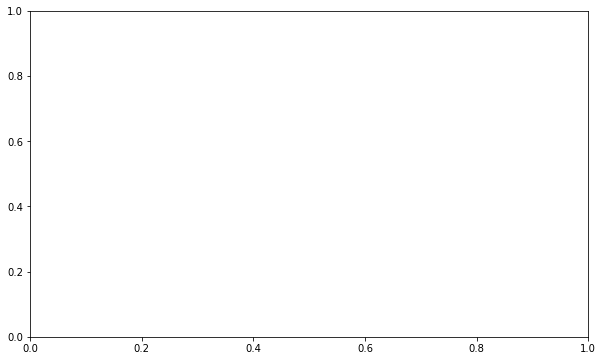

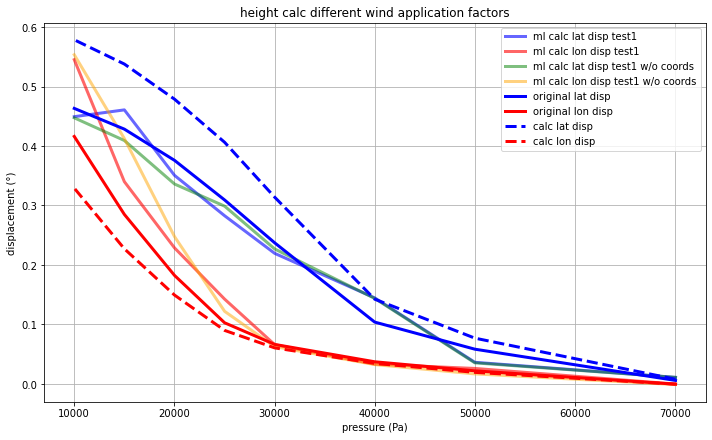

lat disp rmse:  0.025161711979256065
lon disp rmse:  0.05412975321545274
lat disp rmse w/o coords:  0.023863072992500622
lon disp rmse w/o coords:  0.07053786589479634
[70020.0, 50010.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


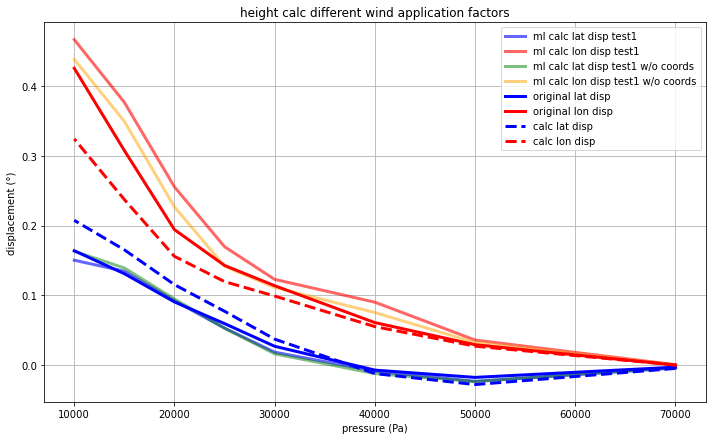

lat disp rmse:  0.006591790985802842
lon disp rmse:  0.03853820672930552
lat disp rmse w/o coords:  0.0061819968469181245
lon disp rmse w/o coords:  0.019974425530614143
[92510.0, 85030.0, 70010.0, 50000.0, 40010.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


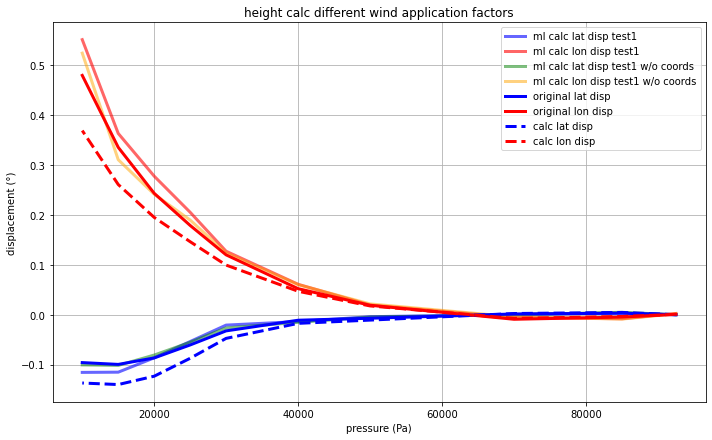

lat disp rmse:  0.009105404615963287
lon disp rmse:  0.028192365673844425
lat disp rmse w/o coords:  0.003884022922072335
lon disp rmse w/o coords:  0.016894358608296425
[99990.0, 92490.0, 84990.0, 70000.0, 50020.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


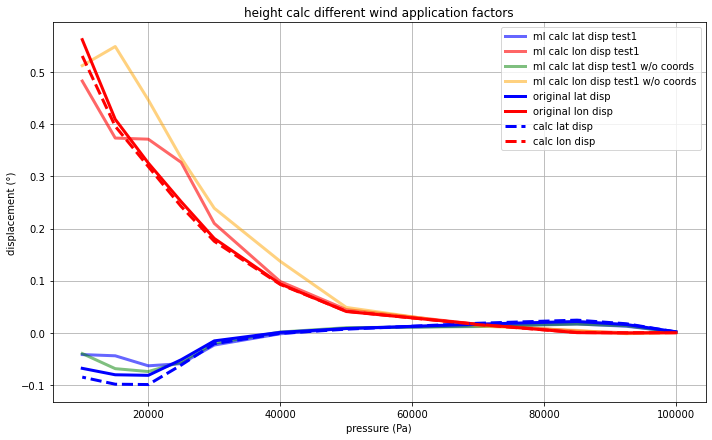

lat disp rmse:  0.015180110038931185
lon disp rmse:  0.038466747487283556
lat disp rmse w/o coords:  0.009976922082173764
lon disp rmse w/o coords:  0.06677826266340886
[99700.0, 92470.0, 84980.0, 70010.0, 50000.0, 40000.0, 30010.0, 25010.0, 20000.0, 15010.0, 10000.0]


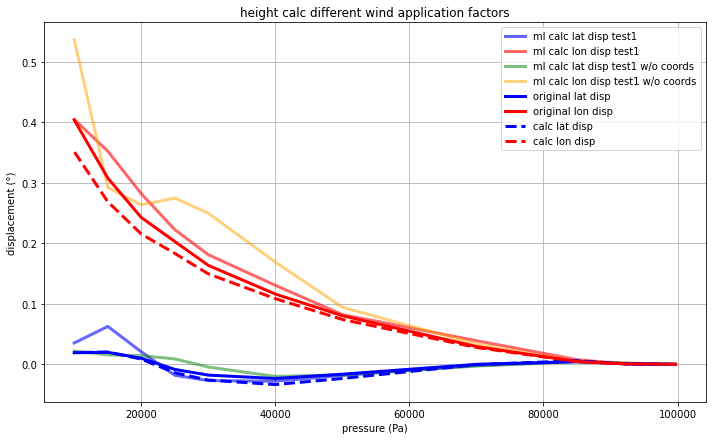

lat disp rmse:  0.014812184564265161
lon disp rmse:  0.020311651654258172
lat disp rmse w/o coords:  0.007044235737812169
lon disp rmse w/o coords:  0.055570672449051235
[92500.0, 84990.0, 69990.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


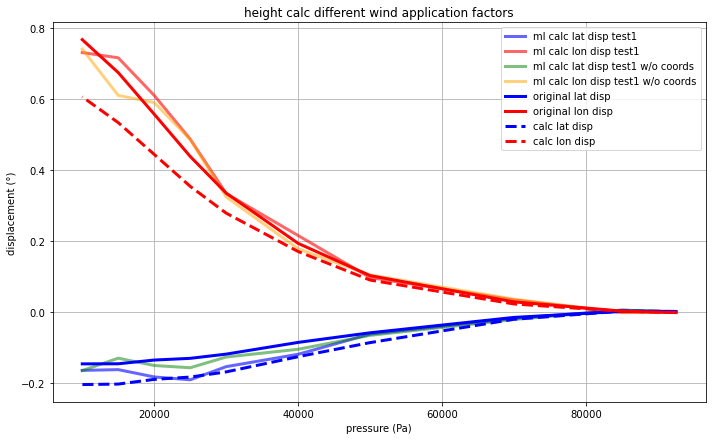

lat disp rmse:  0.029901485520704468
lon disp rmse:  0.02967313581569596
lat disp rmse w/o coords:  0.014472666270439288
lon disp rmse w/o coords:  0.029363883700656877
[85010.0, 70000.0, 49990.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


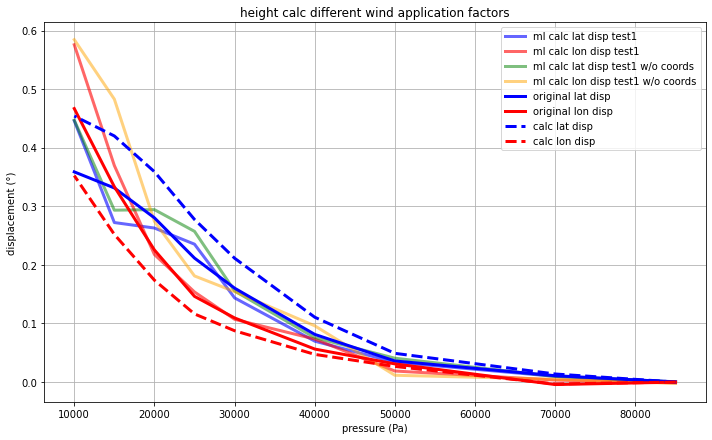

lat disp rmse:  0.037106471732752125
lon disp rmse:  0.039152319142842736
lat disp rmse w/o coords:  0.035866705058713415
lon disp rmse w/o coords:  0.0697776560510885
[85000.0, 70020.0, 49990.0, 40010.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


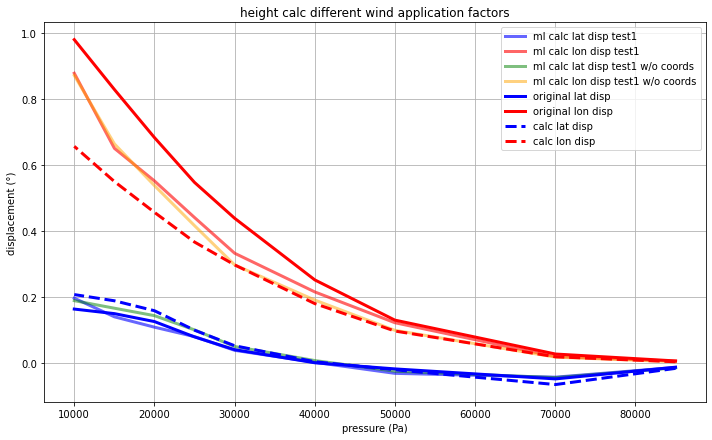

lat disp rmse:  0.013685601499021614
lon disp rmse:  0.09624564363207269
lat disp rmse w/o coords:  0.014515612025390283
lon disp rmse w/o coords:  0.10646632340073271
[70000.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


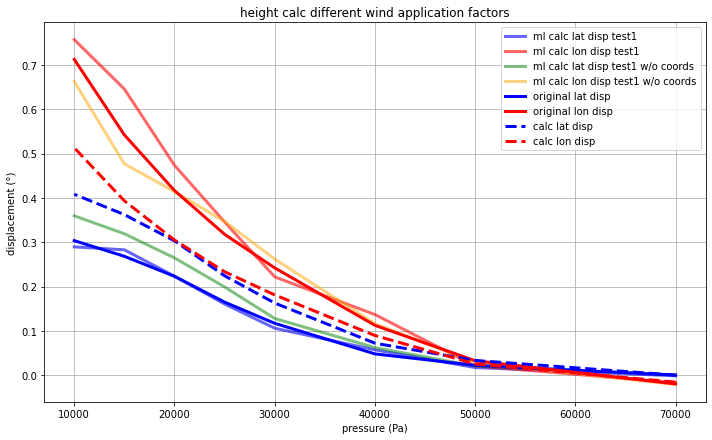

lat disp rmse:  0.009119193900247291
lon disp rmse:  0.0472040432469741
lat disp rmse w/o coords:  0.033413089798156756
lon disp rmse w/o coords:  0.031678220695312356
[100020.0, 92480.0, 85030.0, 70010.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


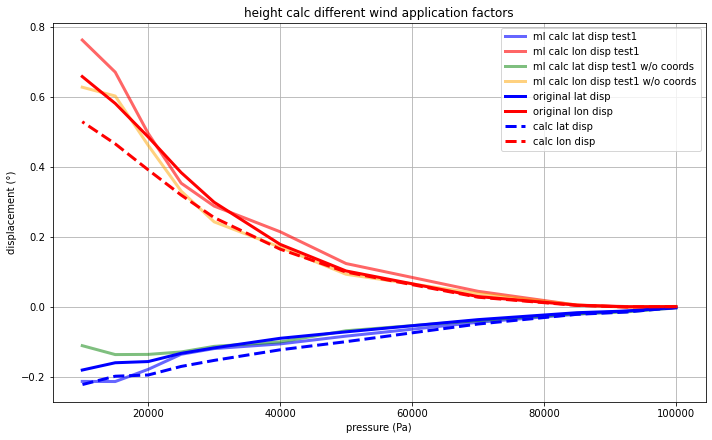

lat disp rmse:  0.021185400347832794
lon disp rmse:  0.04474286556677079
lat disp rmse w/o coords:  0.023340981485389666
lon disp rmse w/o coords:  0.027171676021378714
[84980.0, 69990.0, 50010.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


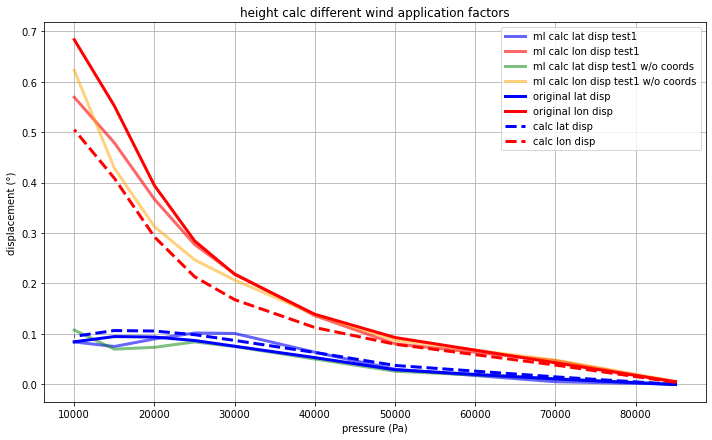

lat disp rmse:  0.012540327157974186
lon disp rmse:  0.04643509428418814
lat disp rmse w/o coords:  0.013332099344088156
lon disp rmse w/o coords:  0.05498089053721596
[92010.0, 84990.0, 69990.0, 50000.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


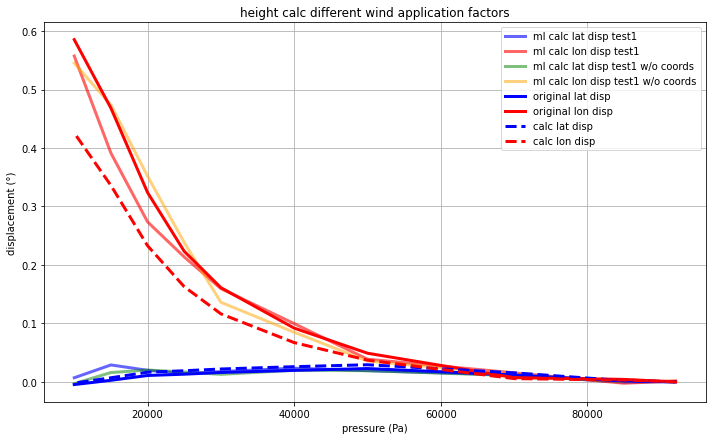

lat disp rmse:  0.009693485568532332
lon disp rmse:  0.03096397349247783
lat disp rmse w/o coords:  0.00552380004902717
lon disp rmse w/o coords:  0.018840620543205726
[85030.0, 70000.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


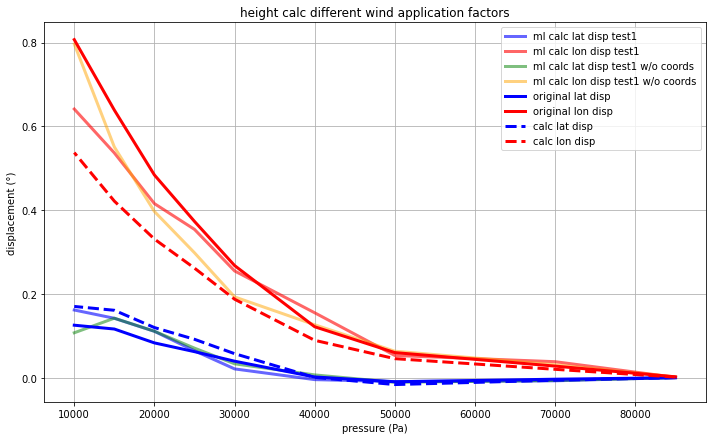

lat disp rmse:  0.018666207017664353
lon disp rmse:  0.07020100042839444
lat disp rmse w/o coords:  0.014578401766664808
lon disp rmse w/o coords:  0.054440430954944684
[100010.0, 92490.0, 84980.0, 70000.0, 50000.0, 39990.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


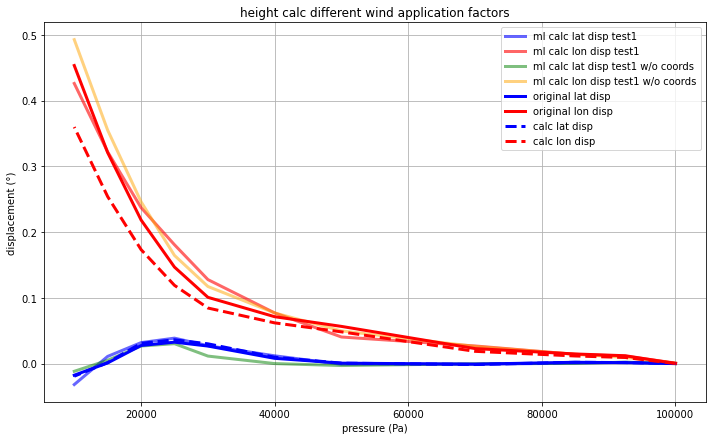

lat disp rmse:  0.005855065640688571
lon disp rmse:  0.017304116873930454
lat disp rmse w/o coords:  0.005794580957826826
lon disp rmse w/o coords:  0.019454418713746934
[92520.0, 84980.0, 70020.0, 49990.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


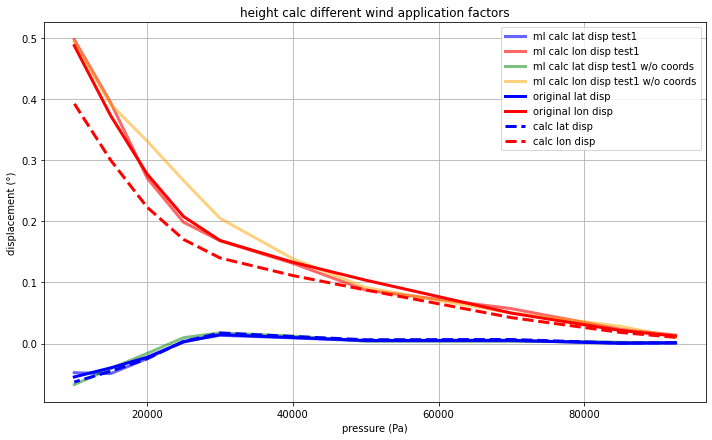

lat disp rmse:  0.0038568528187249043
lon disp rmse:  0.010052145855792
lat disp rmse w/o coords:  0.005153315988323446
lon disp rmse w/o coords:  0.02882548133137958
[92490.0, 85020.0, 69990.0, 50000.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


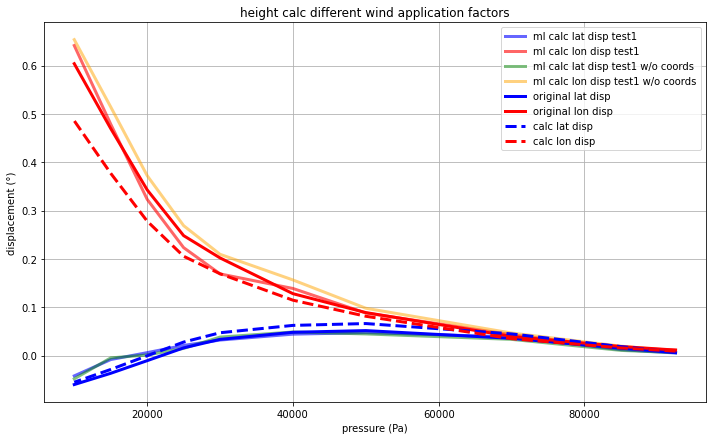

lat disp rmse:  0.012180360853037281
lon disp rmse:  0.019294700490771075
lat disp rmse w/o coords:  0.011778882980718827
lon disp rmse w/o coords:  0.025999773036921074
[92520.0, 85030.0, 70010.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


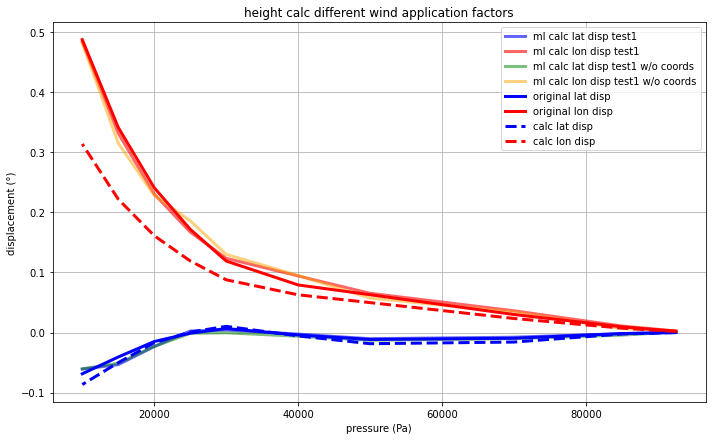

lat disp rmse:  0.00563755787987846
lon disp rmse:  0.007253057518546782
lat disp rmse w/o coords:  0.005546165140464742
lon disp rmse w/o coords:  0.012284763565374118
[100000.0, 92500.0, 84980.0, 69980.0, 50010.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


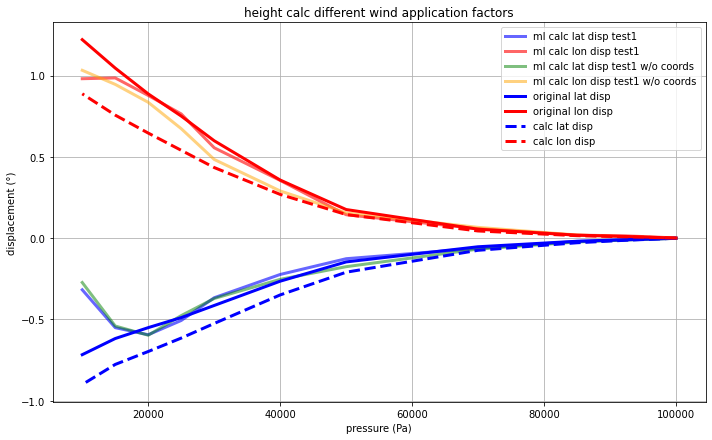

lat disp rmse:  0.12450488143605616
lon disp rmse:  0.07665776511310217
lat disp rmse w/o coords:  0.13766399366143792
lon disp rmse w/o coords:  0.08124539079044454
[100030.0, 92480.0, 85000.0, 70000.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


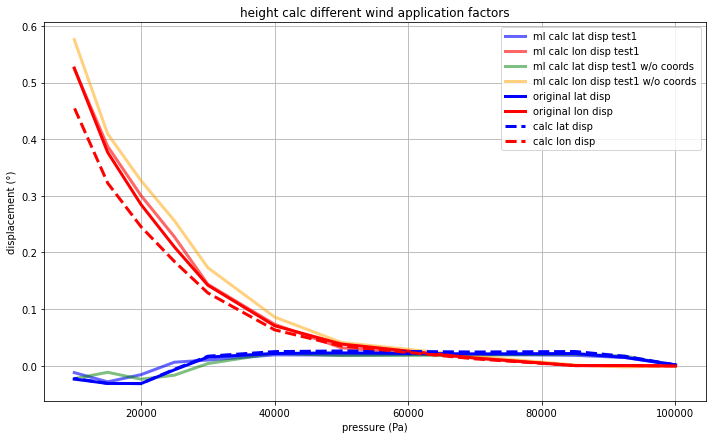

lat disp rmse:  0.007534008223568771
lon disp rmse:  0.008200885368397913
lat disp rmse w/o coords:  0.007988808831682247
lon disp rmse w/o coords:  0.028181802972932685
[92480.0, 85020.0, 70000.0, 49990.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


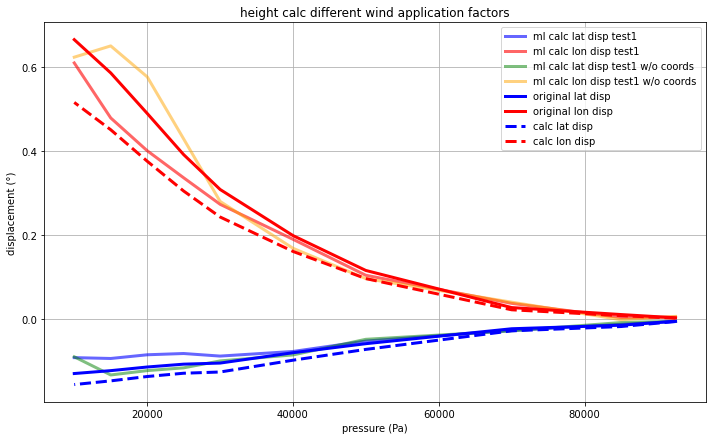

lat disp rmse:  0.020255675958221992
lon disp rmse:  0.05201360922873947
lat disp rmse w/o coords:  0.014374282994008511
lon disp rmse w/o coords:  0.04156425742922469
[92510.0, 85010.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


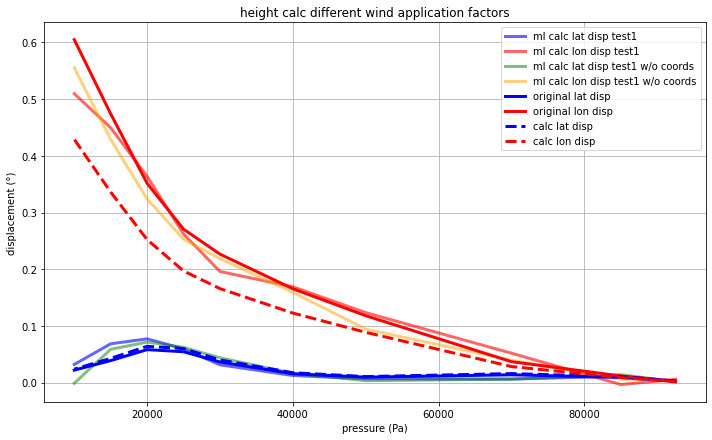

lat disp rmse:  0.012127770584783617
lon disp rmse:  0.033658439018487515
lat disp rmse w/o coords:  0.011615658958175974
lon disp rmse w/o coords:  0.02508979094486752
[92490.0, 85010.0, 70000.0, 49990.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


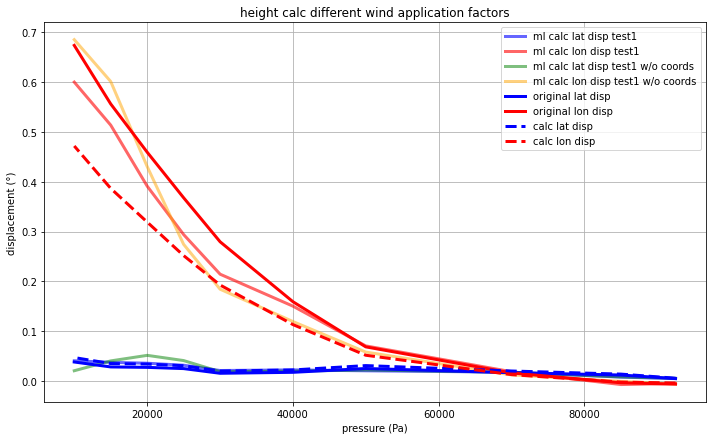

lat disp rmse:  0.005502527218636608
lon disp rmse:  0.04656231722273976
lat disp rmse w/o coords:  0.011561300110934834
lon disp rmse w/o coords:  0.047456128166283
[92490.0, 84990.0, 70010.0, 50000.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


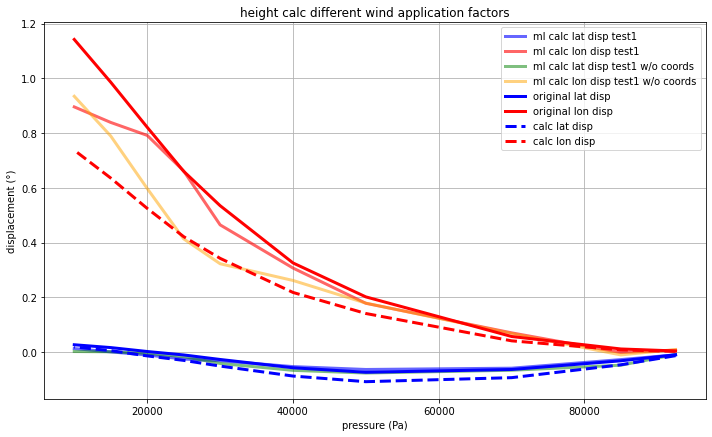

lat disp rmse:  0.010106304086044099
lon disp rmse:  0.09450833783578926
lat disp rmse w/o coords:  0.012275772099247073
lon disp rmse w/o coords:  0.1558383484333781
[84980.0, 69990.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


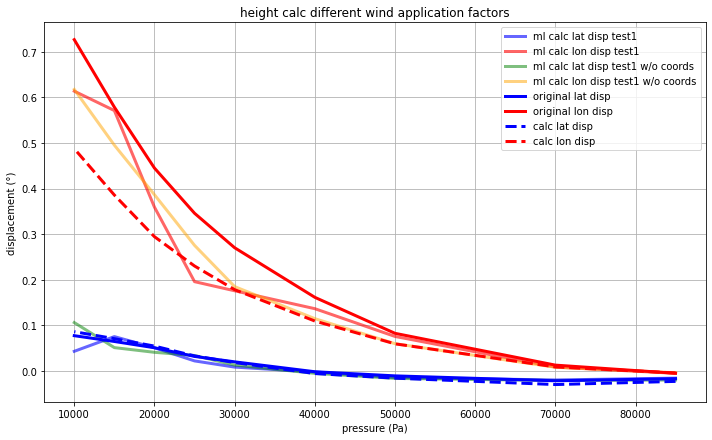

lat disp rmse:  0.013068566370131231
lon disp rmse:  0.0761863968043779
lat disp rmse w/o coords:  0.011623483303687964
lon disp rmse w/o coords:  0.06429373578035509
[100010.0, 92480.0, 84990.0, 69990.0, 49990.0, 40020.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


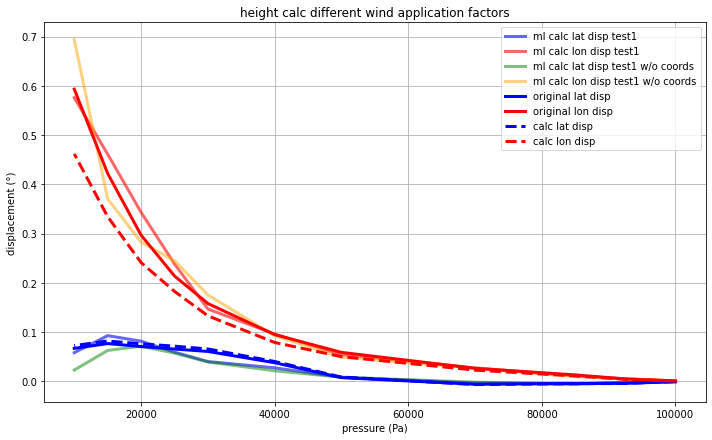

lat disp rmse:  0.00967994202074819
lon disp rmse:  0.02073025070381547
lat disp rmse w/o coords:  0.016402684341889517
lon disp rmse w/o coords:  0.03614554768028327
[100020.0, 92500.0, 85020.0, 69990.0, 50000.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


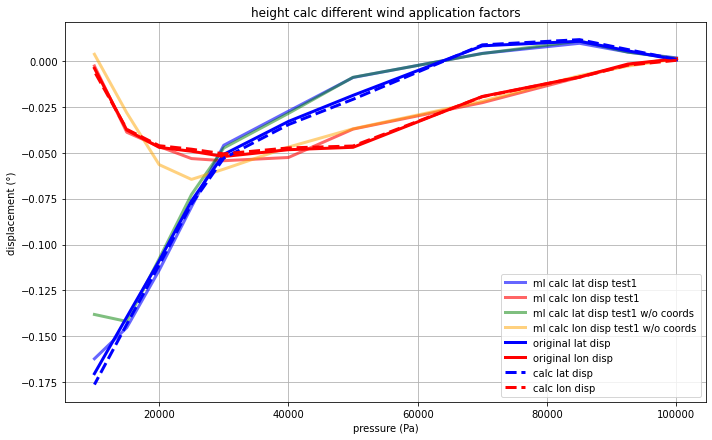

lat disp rmse:  0.00527739115602865
lon disp rmse:  0.0037259677919988855
lat disp rmse w/o coords:  0.01047164541420746
lon disp rmse w/o coords:  0.007567186870288699
[100000.0, 92520.0, 85010.0, 70000.0, 49990.0, 40010.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


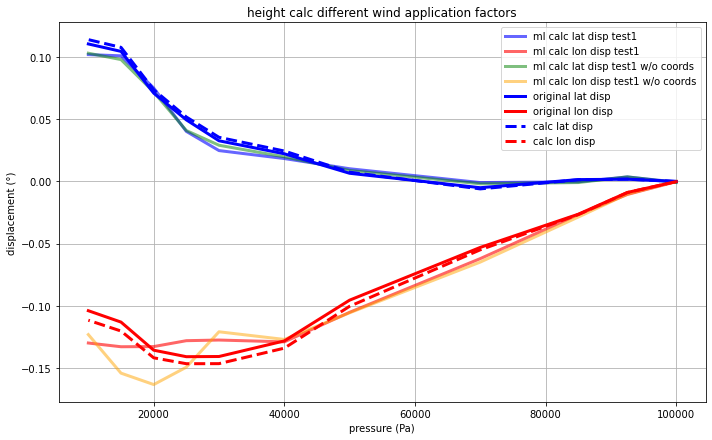

lat disp rmse:  0.005247891596068107
lon disp rmse:  0.012044181013490005
lat disp rmse w/o coords:  0.004444044108575173
lon disp rmse w/o coords:  0.01792183710667777
[99980.0, 92490.0, 84980.0, 70010.0, 49990.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


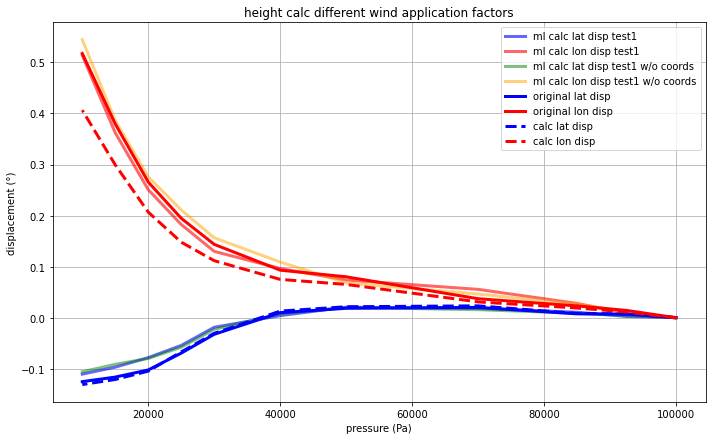

lat disp rmse:  0.012286368912490124
lon disp rmse:  0.010932098627979657
lat disp rmse w/o coords:  0.012676622523852496
lon disp rmse w/o coords:  0.012795639807653046
[92500.0, 84980.0, 70020.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


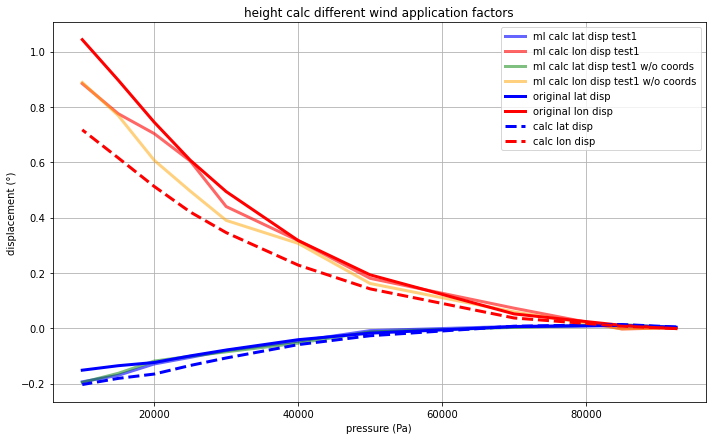

lat disp rmse:  0.017736920907634086
lon disp rmse:  0.06738459439520378
lat disp rmse w/o coords:  0.017265449522330813
lon disp rmse w/o coords:  0.09163051225981435
[100000.0, 92520.0, 84980.0, 70020.0, 50010.0, 40010.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


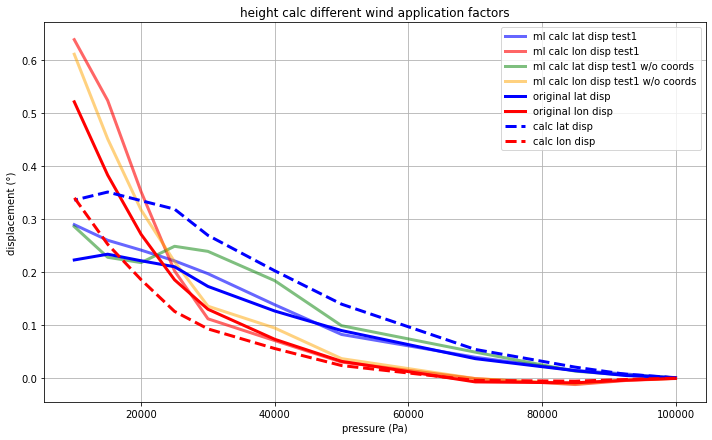

lat disp rmse:  0.02425470055871536
lon disp rmse:  0.06092385952476465
lat disp rmse w/o coords:  0.034957454436566164
lon disp rmse w/o coords:  0.03885745171403679
[85020.0, 69990.0, 50000.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


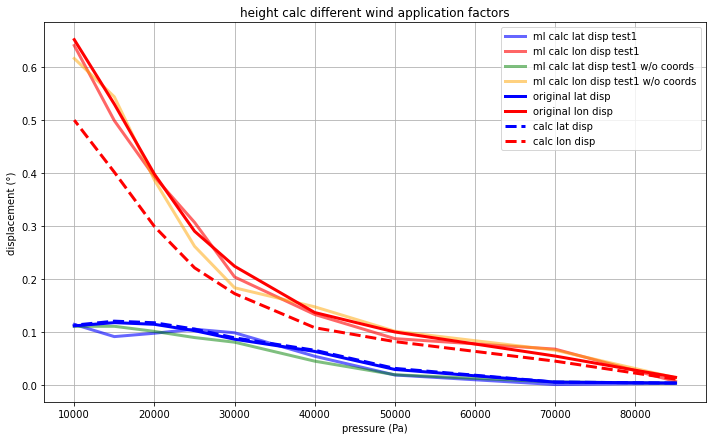

lat disp rmse:  0.01226768648017889
lon disp rmse:  0.015659930685070992
lat disp rmse w/o coords:  0.009786211239959364
lon disp rmse w/o coords:  0.02176105670375311
[100020.0, 92520.0, 84990.0, 69990.0, 50010.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


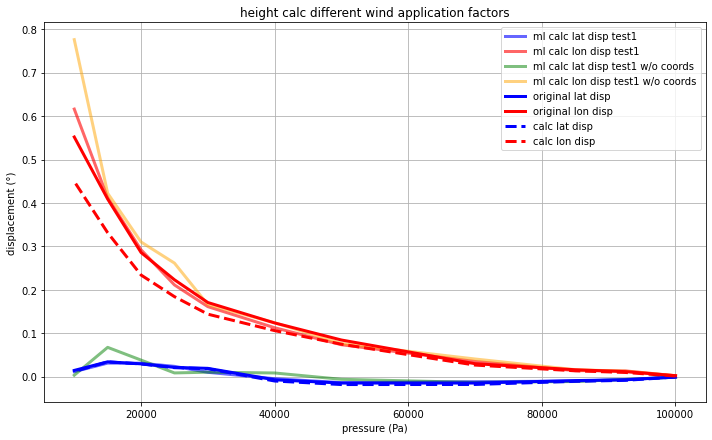

lat disp rmse:  0.003402408307003978
lon disp rmse:  0.020638268922217033
lat disp rmse w/o coords:  0.013060307889511269
lon disp rmse w/o coords:  0.06922718485698141
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0]


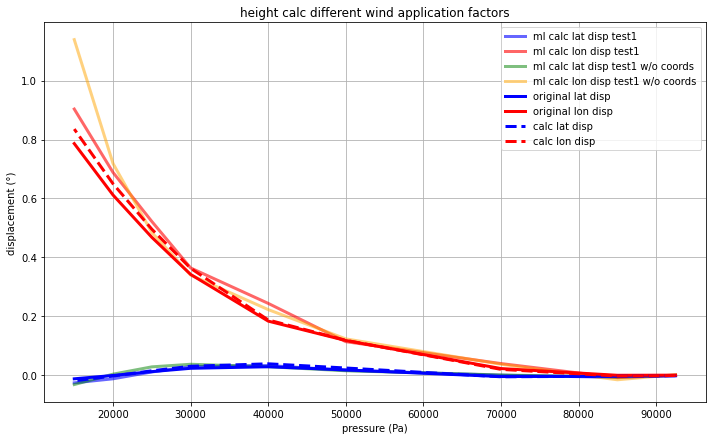

lat disp rmse:  0.006711020450875025
lon disp rmse:  0.054789705984690885
lat disp rmse w/o coords:  0.009981006404456648
lon disp rmse w/o coords:  0.12400968108512508
[92480.0, 84980.0, 69990.0, 50010.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


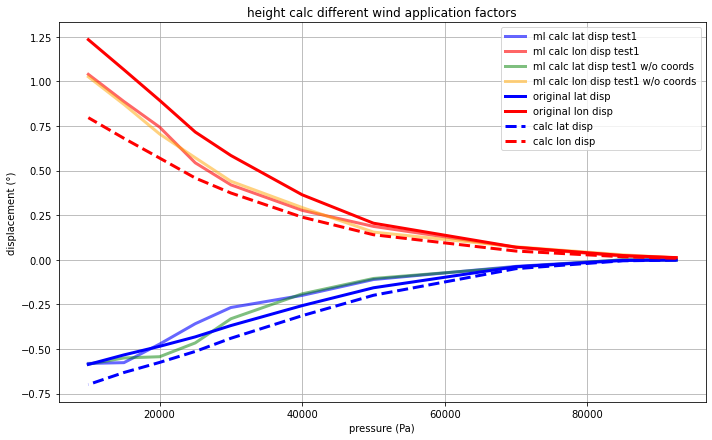

lat disp rmse:  0.04820132633531645
lon disp rmse:  0.12530184504272981
lat disp rmse w/o coords:  0.03659396041149358
lon disp rmse w/o coords:  0.12882046251593135
[92520.0, 85020.0, 69990.0, 49990.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


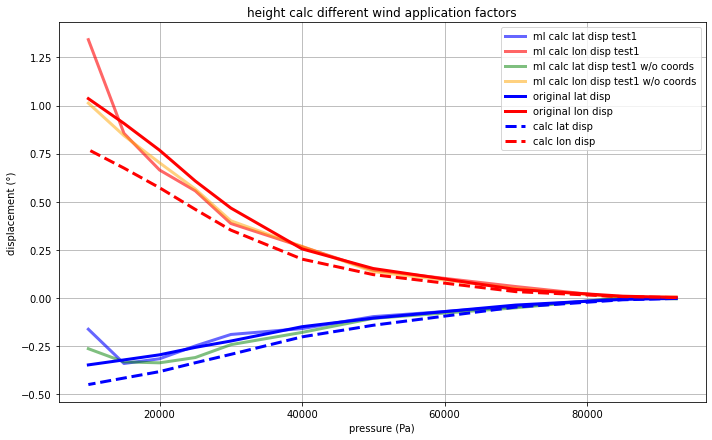

lat disp rmse:  0.060534387370877164
lon disp rmse:  0.1081089524895407
lat disp rmse w/o coords:  0.036362025691310425
lon disp rmse w/o coords:  0.03941309032073761
[92500.0, 85020.0, 69990.0, 49980.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


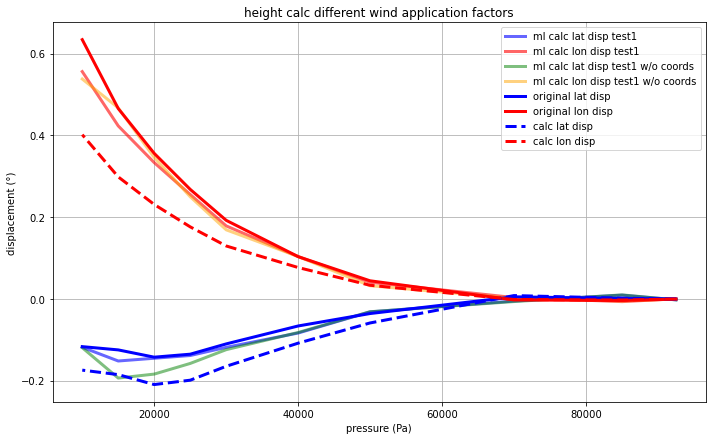

lat disp rmse:  0.011502187646402715
lon disp rmse:  0.029701624022835597
lat disp rmse w/o coords:  0.027698302019017837
lon disp rmse w/o coords:  0.03225298141868314
[99980.0, 92520.0, 85010.0, 70000.0, 50010.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


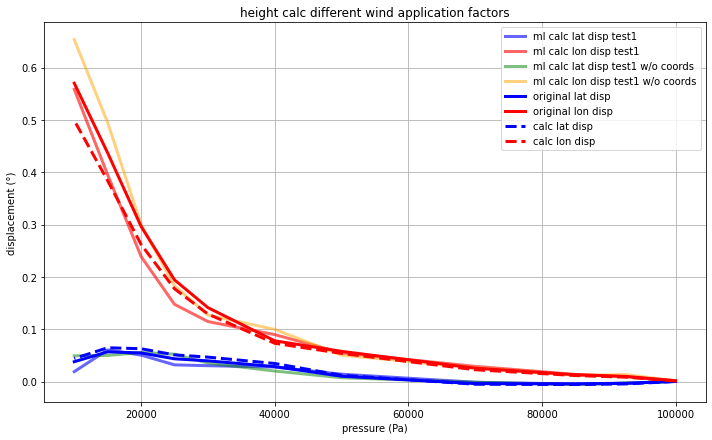

lat disp rmse:  0.007597780286382964
lon disp rmse:  0.02735653535716266
lat disp rmse w/o coords:  0.005720785360183633
lon disp rmse w/o coords:  0.03190089034281268
[85010.0, 69980.0, 49990.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


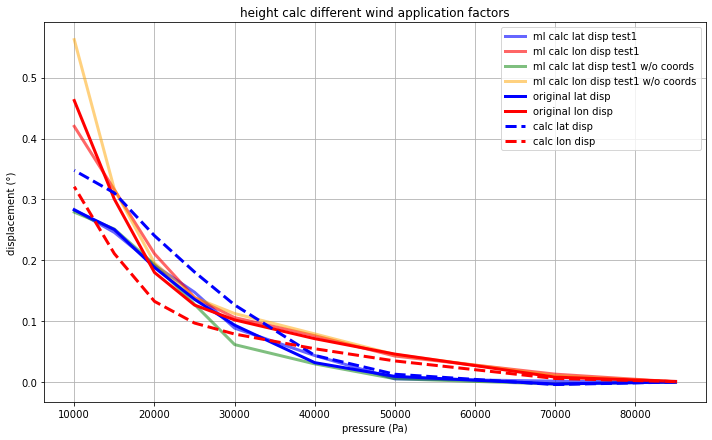

lat disp rmse:  0.006444466555928138
lon disp rmse:  0.018872185795701844
lat disp rmse w/o coords:  0.011286762102653947
lon disp rmse w/o coords:  0.034711626853561
[99970.0, 92480.0, 85020.0, 70000.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


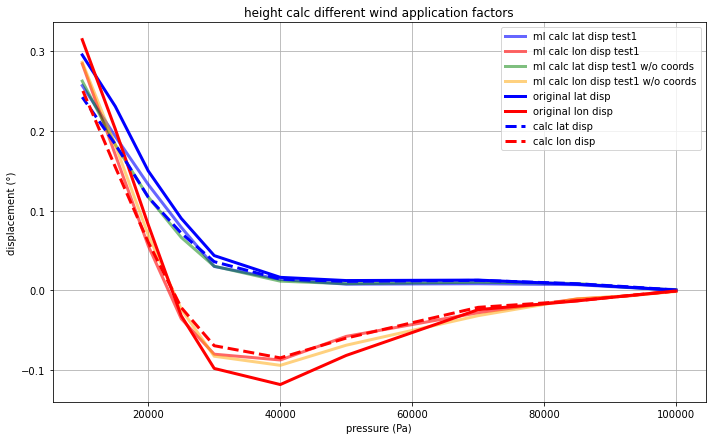

lat disp rmse:  0.01795911263638767
lon disp rmse:  0.020274406608493764
lat disp rmse w/o coords:  0.021835404542280615
lon disp rmse w/o coords:  0.015030605416035172
[92530.0, 85010.0, 69990.0, 50000.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


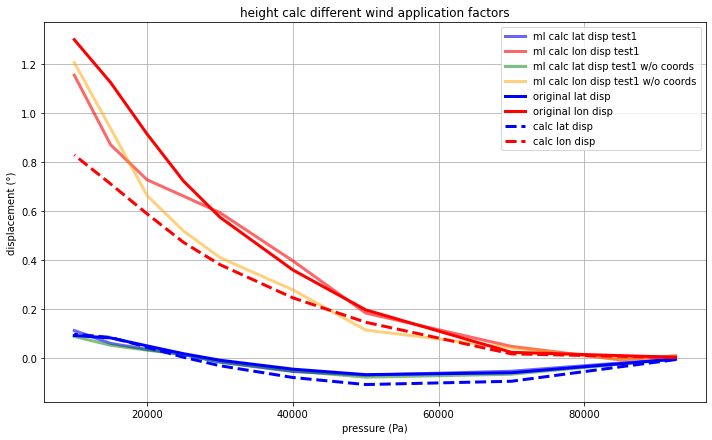

lat disp rmse:  0.01161777795054474
lon disp rmse:  0.1124940523380991
lat disp rmse w/o coords:  0.012172859769644445
lon disp rmse w/o coords:  0.13755008402992294
[84880.0, 70010.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


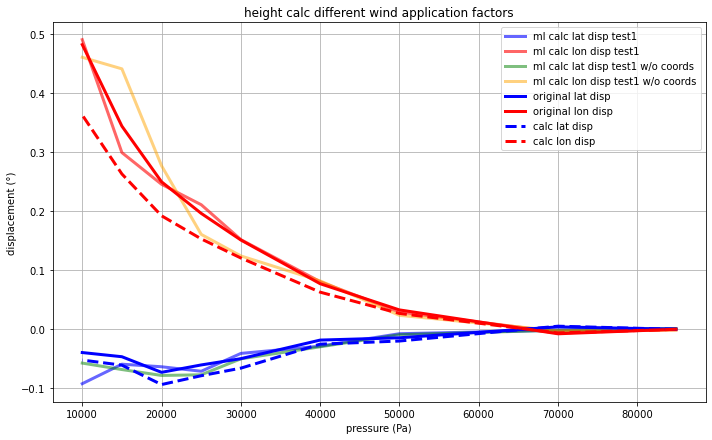

lat disp rmse:  0.01945309604310161
lon disp rmse:  0.01612055777050529
lat disp rmse w/o coords:  0.011952601822850182
lon disp rmse w/o coords:  0.0376079020409358
[92510.0, 84980.0, 70020.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


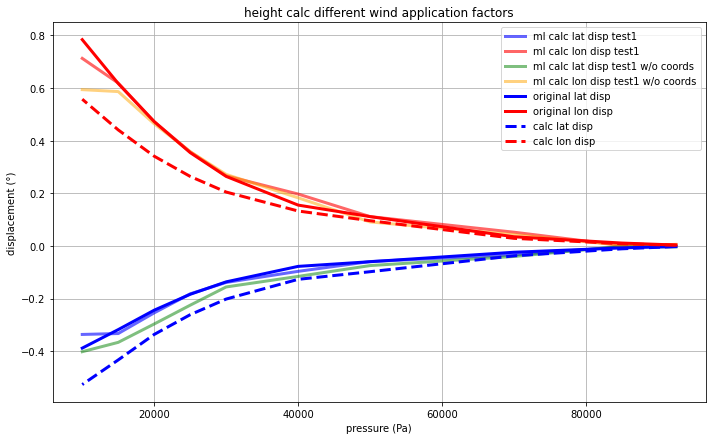

lat disp rmse:  0.018664517575838424
lon disp rmse:  0.02690436016912919
lat disp rmse w/o coords:  0.030549488006164142
lon disp rmse w/o coords:  0.06204450773538781
[92500.0, 85000.0, 69990.0, 49990.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


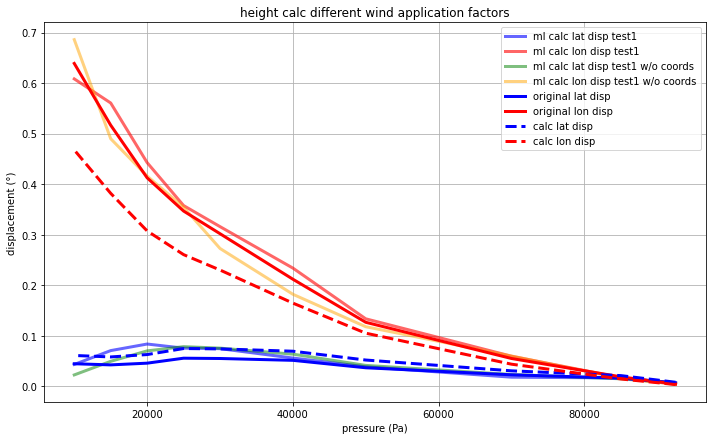

lat disp rmse:  0.017481253441551468
lon disp rmse:  0.02152976517749228
lat disp rmse w/o coords:  0.014990049643761993
lon disp rmse w/o coords:  0.022030580489262704
[92520.0, 85010.0, 70000.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


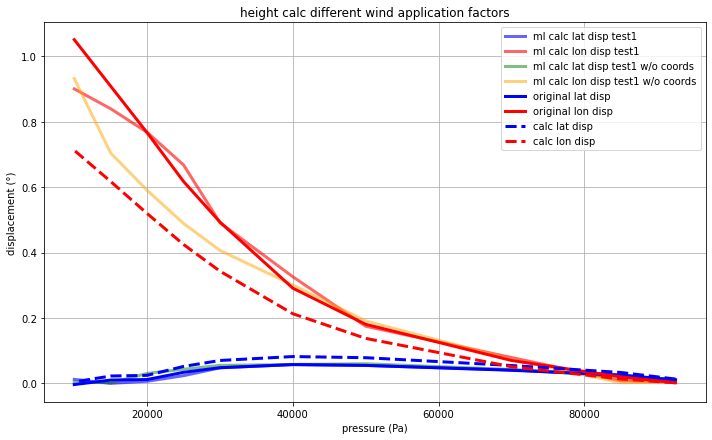

lat disp rmse:  0.0070304363520339325
lon disp rmse:  0.056121372259122206
lat disp rmse w/o coords:  0.008159530843605874
lon disp rmse w/o coords:  0.10559297329285945
[92530.0, 85000.0, 70010.0, 50010.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


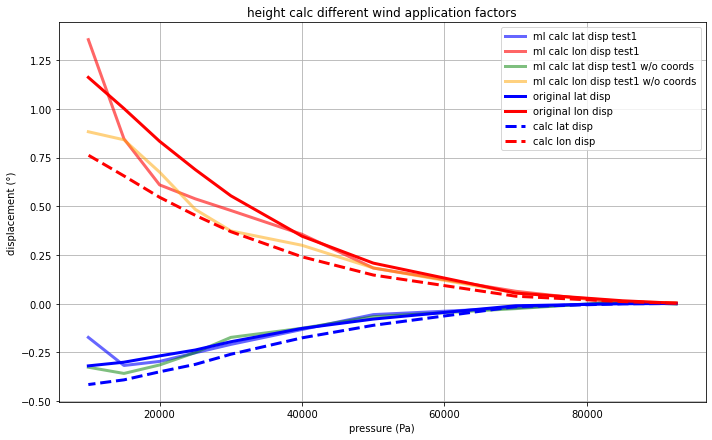

lat disp rmse:  0.048537769389835644
lon disp rmse:  0.11872552253380272
lat disp rmse w/o coords:  0.025849036663690386
lon disp rmse w/o coords:  0.14338798836614575
[92500.0, 84990.0, 69990.0, 50020.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


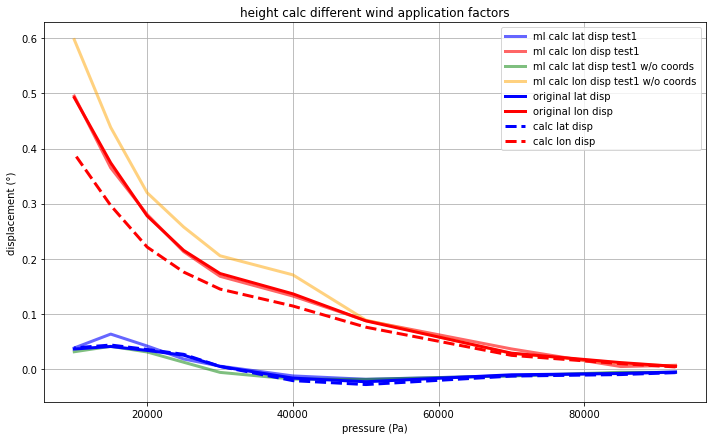

lat disp rmse:  0.008155076231203054
lon disp rmse:  0.005052962587857323
lat disp rmse w/o coords:  0.005836847823814448
lon disp rmse w/o coords:  0.045801723515650164
[99550.0, 92510.0, 84990.0, 70010.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


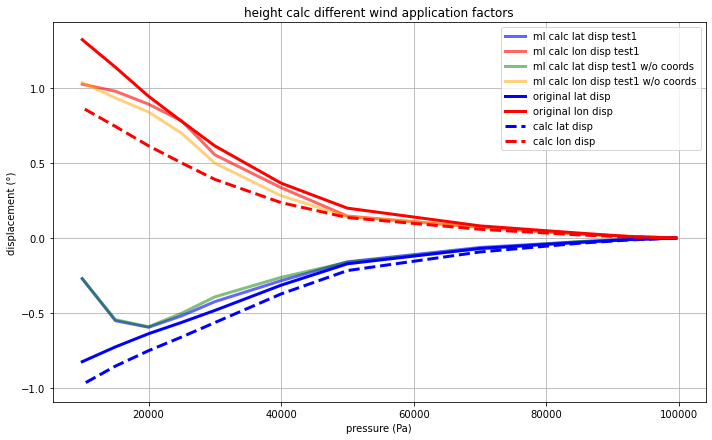

lat disp rmse:  0.1770031595656706
lon disp rmse:  0.10605704403240956
lat disp rmse w/o coords:  0.17941110934383442
lon disp rmse w/o coords:  0.12219724808558591
[99810.0, 92520.0, 84990.0, 70010.0, 50000.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


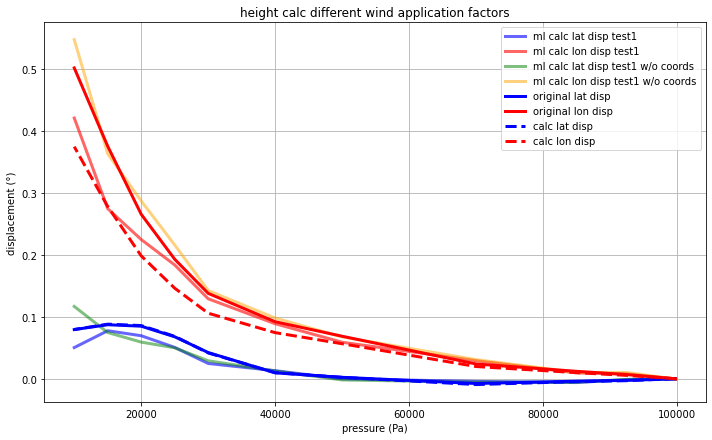

lat disp rmse:  0.012864588939149444
lon disp rmse:  0.04119060425721146
lat disp rmse w/o coords:  0.015806362108992517
lon disp rmse w/o coords:  0.017446733464057486
[99990.0, 92520.0, 85000.0, 70000.0, 50000.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


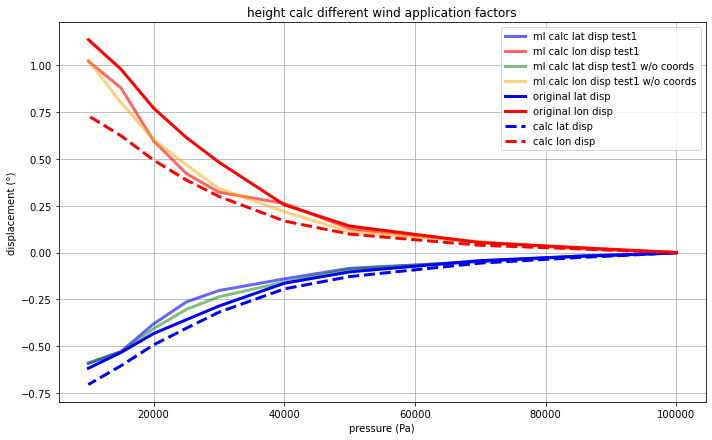

lat disp rmse:  0.04280665587395646
lon disp rmse:  0.1030002881164626
lat disp rmse w/o coords:  0.025674356251836318
lon disp rmse w/o coords:  0.1026800814339834
[85030.0, 69990.0, 50010.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


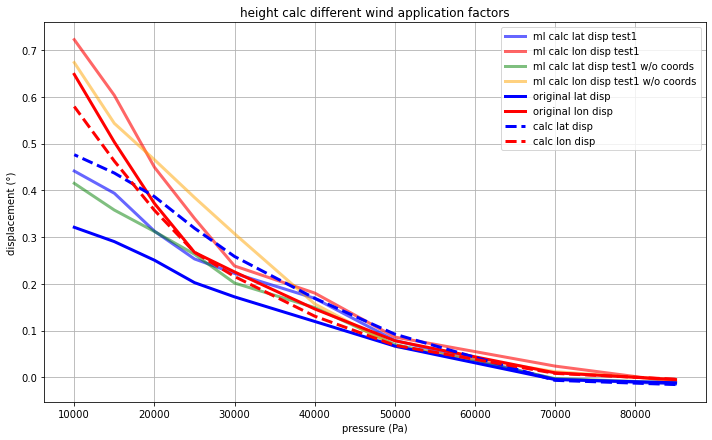

lat disp rmse:  0.06393803907188764
lon disp rmse:  0.05621700072612994
lat disp rmse w/o coords:  0.050180980974447086
lon disp rmse w/o coords:  0.05941707905267577
[100010.0, 92510.0, 85020.0, 70000.0, 50000.0, 39990.0, 29990.0, 25000.0, 20010.0, 15000.0, 10000.0]


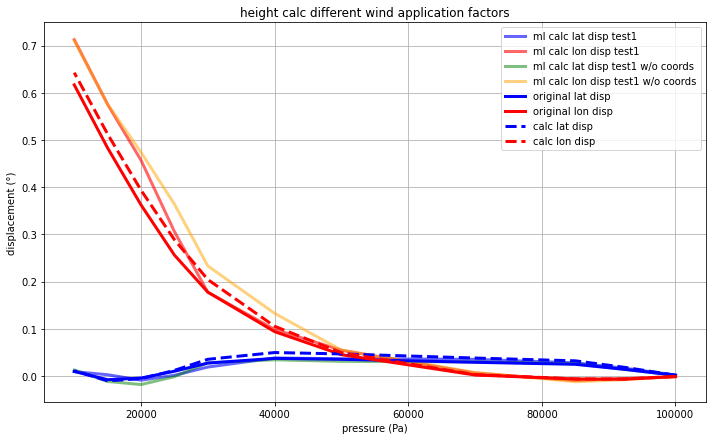

lat disp rmse:  0.0054924924719775975
lon disp rmse:  0.05161242161063469
lat disp rmse w/o coords:  0.005835958771683249
lon disp rmse w/o coords:  0.06478624716119848
[92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25120.0]
[92480.0, 84980.0, 70000.0, 50020.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


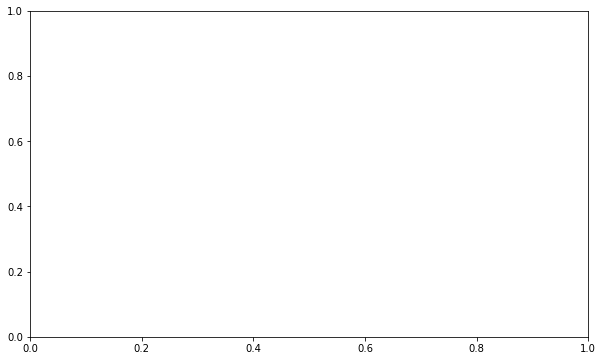

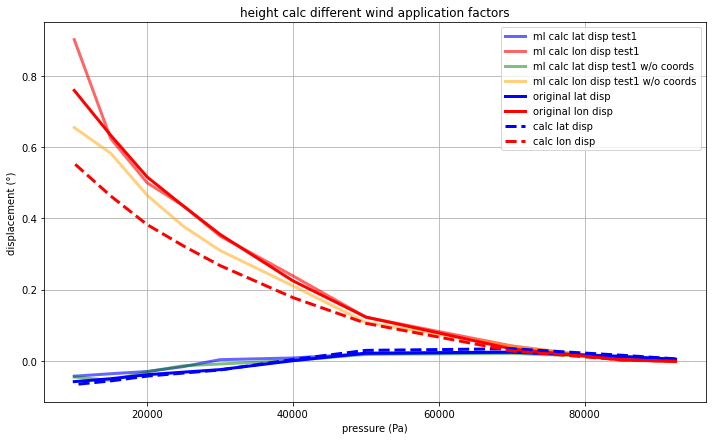

lat disp rmse:  0.012654497797629257
lon disp rmse:  0.045830483235528297
lat disp rmse w/o coords:  0.009290534096815049
lon disp rmse w/o coords:  0.04672679997264657
[92500.0, 85010.0, 69990.0, 50010.0, 40010.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


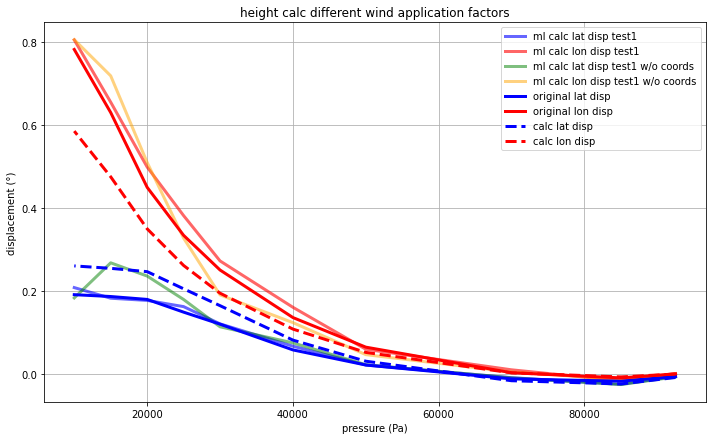

lat disp rmse:  0.007982652483443648
lon disp rmse:  0.026523040026954204
lat disp rmse w/o coords:  0.03342869238796787
lon disp rmse w/o coords:  0.04017537100955095
[92510.0, 85000.0, 70020.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


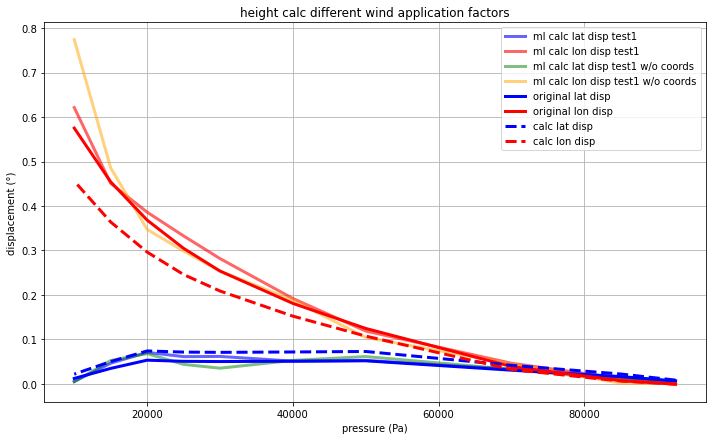

lat disp rmse:  0.008602328228865875
lon disp rmse:  0.02064018430100836
lat disp rmse w/o coords:  0.010096564589007496
lon disp rmse w/o coords:  0.0644488418102105
[92520.0, 85000.0, 69990.0, 49980.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


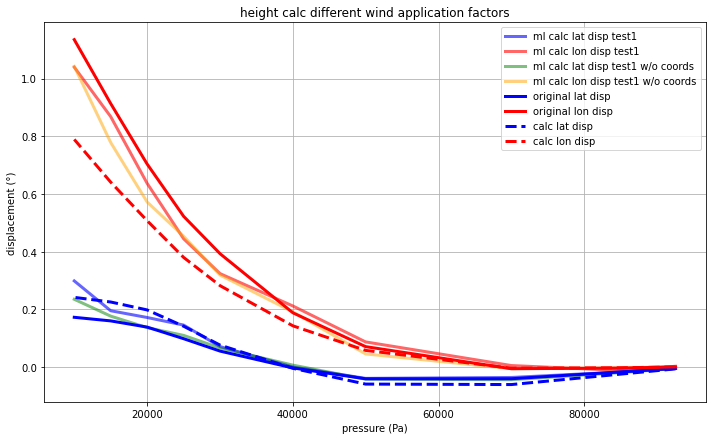

lat disp rmse:  0.045584808872796735
lon disp rmse:  0.05242284819186184
lat disp rmse w/o coords:  0.021303899471357614
lon disp rmse w/o coords:  0.0742212628961818
[92480.0, 85030.0, 69990.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


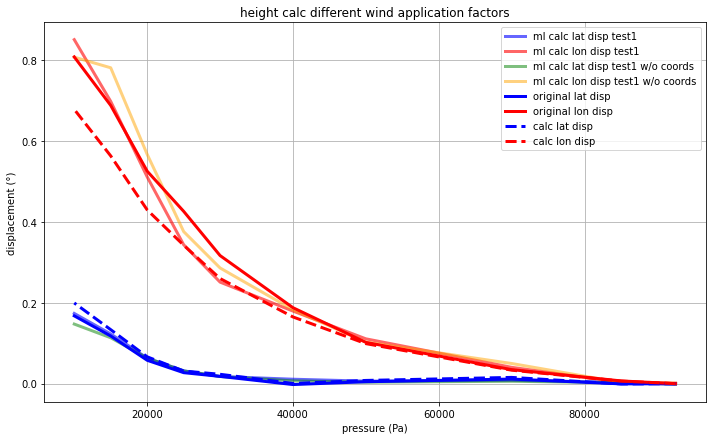

lat disp rmse:  0.005583011660568126
lon disp rmse:  0.03666456331051828
lat disp rmse w/o coords:  0.007753304303222618
lon disp rmse w/o coords:  0.037534897832006274
[70030.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


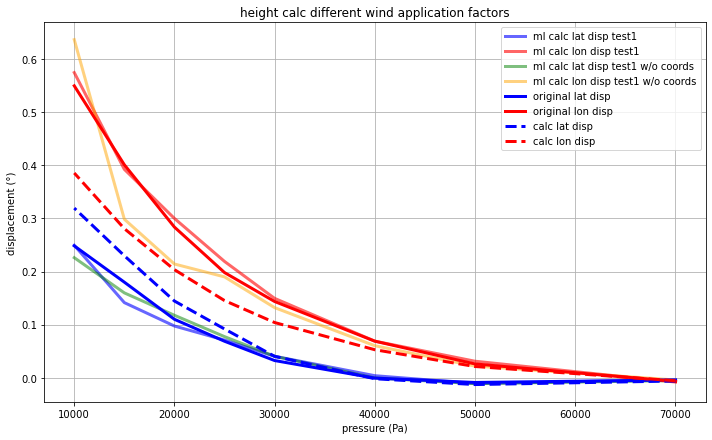

lat disp rmse:  0.014751640690313771
lon disp rmse:  0.013516359058053496
lat disp rmse w/o coords:  0.011768293137815364
lon disp rmse w/o coords:  0.05386867575080556
[99980.0, 92510.0, 85010.0, 70010.0, 50010.0, 40020.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


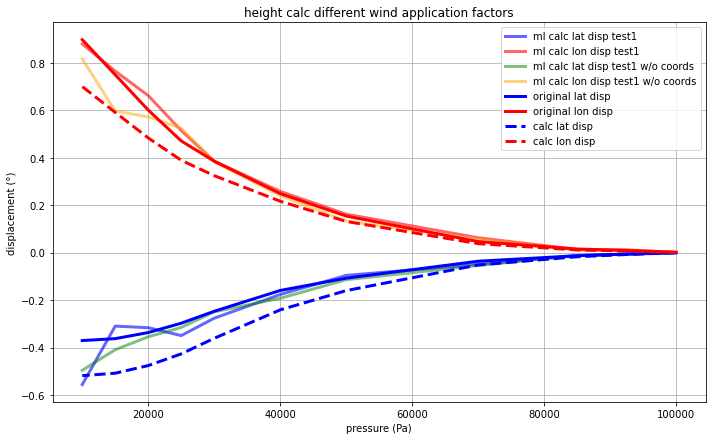

lat disp rmse:  0.0616470765070532
lon disp rmse:  0.024606396381002215
lat disp rmse w/o coords:  0.04265753444060044
lon disp rmse w/o coords:  0.05572238928707925
[92480.0, 84980.0, 70020.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


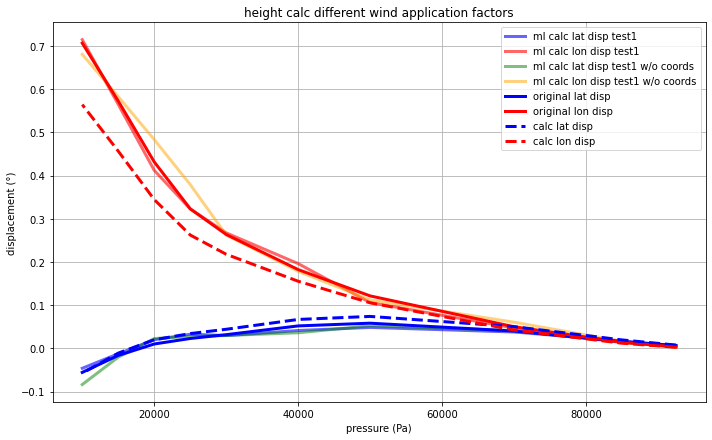

lat disp rmse:  0.007212283403885332
lon disp rmse:  0.009778408685800027
lat disp rmse w/o coords:  0.011343931638203903
lon disp rmse w/o coords:  0.026118990880278765
[92480.0, 85010.0, 70010.0, 50010.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


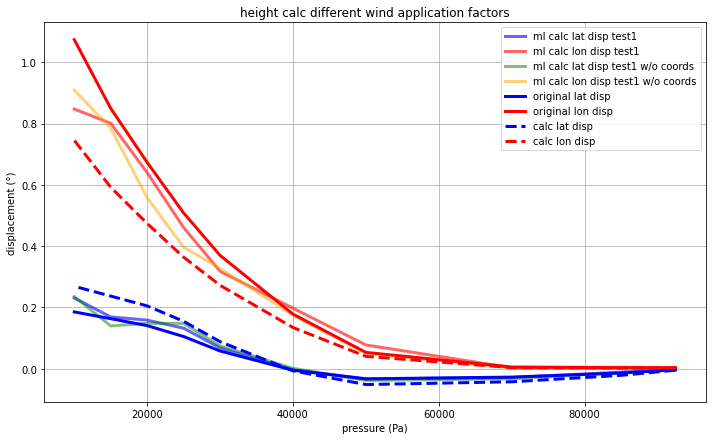

lat disp rmse:  0.018081366069712338
lon disp rmse:  0.077962679421527
lat disp rmse w/o coords:  0.02315642746656516
lon disp rmse w/o coords:  0.07678878391613217
[92510.0, 84990.0, 70010.0, 49990.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


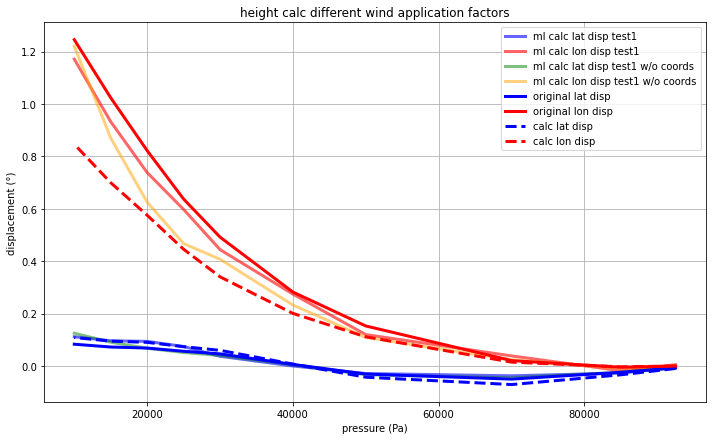

lat disp rmse:  0.016348911773121397
lon disp rmse:  0.05139100342772243
lat disp rmse w/o coords:  0.014806332867791254
lon disp rmse w/o coords:  0.10162031056539923
[92490.0, 85010.0, 70020.0, 49990.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


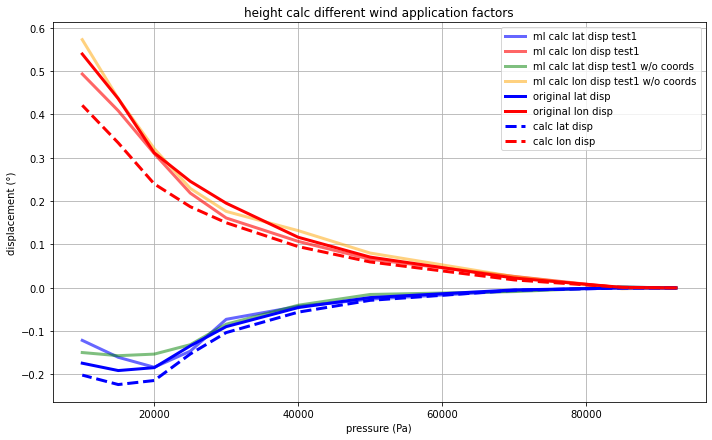

lat disp rmse:  0.020446910351503984
lon disp rmse:  0.022235931738324746
lat disp rmse w/o coords:  0.01702676223358935
lon disp rmse w/o coords:  0.01469467480422875
---
rmse_total_lat_1:  0.023922490513982615
rmse_total_lon_1:  0.03831006133681805
rmse_total_lat_2:  0.024987591836517255
rmse_total_lon_2:  0.04523866735738592


In [35]:
from scipy.signal import savgol_filter

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]

rmse_total_lat_1 = []
rmse_total_lat_2 = []
rmse_total_lon_1 = []
rmse_total_lon_2 = []

for i in range(len(testidx)):
    if i != 0:
        try:
            testdata = test[testidx[i-1]:testidx[i]]
            testdata = testdata.reset_index()
            extract_plevs = []
            for j in stdplevs:
                intermediat_p = float(find_nearest(testdata.pressure, j))
                if np.abs(j - intermediat_p) < 500:
                    extract_plevs.append(intermediat_p)
            print(extract_plevs)
            testdata = testdata[np.isin(testdata.pressure, extract_plevs)]
            mlout = model_dt.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
            mlout_lat, mlout_lon = mlout.transpose()

            mlout_wo_coords = model_dt_wo_coords.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z', 'calc_latd', 'calc_lond']])
            mlout_lat_wo_coords, mlout_lon_wo_coords = mlout_wo_coords.transpose()

            fig, ax1 = maplt.subplots(figsize=(10, 6))
            filterlen = int(len(testdata)//2)
            if not (filterlen & 0x1):
                filterlen += 1
            ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat, filterlen, 3)),color = 'blue', alpha = 0.6, label='ml calc lat disp test1')
            ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon, filterlen, 3)),color = 'red',  alpha = 0.6,label='ml calc lon disp test1')
            ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat_wo_coords, filterlen, 3)),color = 'green', alpha = 0.5, label='ml calc lat disp test1 w/o coords')
            ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon_wo_coords, filterlen, 3)),color = 'orange',  alpha = 0.5,label='ml calc lon disp test1 w/o coords')
            ax1.plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
            ax1.plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
            ax1.plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
            ax1.plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
            ax1.set_xlabel('pressure (Pa)')
            ax1.set_ylabel('displacement (°)')
            ax1.tick_params(axis='y')

            fig.tight_layout()  # otherwise the right y-label is slightly clipped
            maplt.title('height calc different wind application factors')
            maplt.legend()
            maplt.grid()
            maplt.show()
            maplt.close()
            rmse_total_lat_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat, filterlen, 3))-testdata.latd)**2)))
            rmse_total_lon_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon, filterlen, 3))-testdata.lond)**2)))
            print('lat disp rmse: ',rmse_total_lat_1[-1])
            print('lon disp rmse: ',rmse_total_lon_1[-1])
            rmse_total_lat_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat_wo_coords, filterlen, 3))-testdata.latd)**2)))
            rmse_total_lon_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon_wo_coords, filterlen, 3))-testdata.lond)**2)))
            print('lat disp rmse w/o coords: ',rmse_total_lat_2[-1])
            print('lon disp rmse w/o coords: ',rmse_total_lon_2[-1])
        except:
            pass
print('---')
print('rmse_total_lat_1: ', np.mean(rmse_total_lat_1))
print('rmse_total_lon_1: ', np.mean(rmse_total_lon_1))
print('rmse_total_lat_2: ', np.mean(rmse_total_lat_2))
print('rmse_total_lon_2: ', np.mean(rmse_total_lon_2))

In [32]:
# from scipy.signal import savgol_filter

# rmse_total_lat_1 = []
# rmse_total_lat_2 = []
# rmse_total_lon_1 = []
# rmse_total_lon_2 = []

# for i in range(len(testidx)):
#     if i != 0:
#         testdata = test[testidx[i-1]:testidx[i]]
#         mlout = model_dt.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
#         mlout_lat, mlout_lon = mlout.transpose()
        
#         mlout_wo_coords = model_dt_wo_coords.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z', 'calc_latd', 'calc_lond']])
#         mlout_lat_wo_coords, mlout_lon_wo_coords = mlout_wo_coords.transpose()

#         fig, ax1 = maplt.subplots(figsize=(10, 6))
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat, 1111, 3)),color = 'blue', alpha = 0.6, label='ml calc lat disp test1')
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon, 1111, 3)),color = 'red',  alpha = 0.6,label='ml calc lon disp test1')
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat_wo_coords, 1111, 3)),color = 'green', alpha = 0.5, label='ml calc lat disp test1 w/o coords')
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon_wo_coords, 1111, 3)),color = 'orange',  alpha = 0.5,label='ml calc lon disp test1 w/o coords')
#         ax1.plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
#         ax1.plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
#         ax1.plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
#         ax1.plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
#         ax1.set_xlabel('pressure (Pa)')
#         ax1.set_ylabel('displacement (°)')
#         ax1.tick_params(axis='y')

#         fig.tight_layout()  # otherwise the right y-label is slightly clipped
#         maplt.title('height calc different wind application factors')
#         maplt.legend()
#         maplt.grid()
#         maplt.show()
#         maplt.close()
#         rmse_total_lat_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat, 1111, 3))-testdata.latd)**2)))
#         rmse_total_lon_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon, 1111, 3))-testdata.lond)**2)))
#         print('lat disp rmse: ',rmse_total_lat_1[-1])
#         print('lon disp rmse: ',rmse_total_lon_1[-1])
#         rmse_total_lat_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat_wo_coords, 1111, 3))-testdata.latd)**2)))
#         rmse_total_lon_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon_wo_coords, 1111, 3))-testdata.lond)**2)))
#         print('lat disp rmse w/o coords: ',rmse_total_lat_2[-1])
#         print('lon disp rmse w/o coords: ',rmse_total_lon_2[-1])
# print('---')
# print('rmse_total_lat_1: ', np.mean(rmse_total_lat_1))
# print('rmse_total_lon_1: ', np.mean(rmse_total_lon_1))
# print('rmse_total_lat_2: ', np.mean(rmse_total_lat_2))
# print('rmse_total_lon_2: ', np.mean(rmse_total_lon_2))

In [ ]:
model_dt = DecisionTreeRegressor()
model_dt.fit(train[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']], train[['latd', 'lond']])

model_dt_wo_coords = DecisionTreeRegressor()
model_dt_wo_coords.fit(train[['temperature', 'pressure', 'u', 'v', 'z','calc_latd', 'calc_lond']], train[['latd', 'lond']])

In [31]:
# for i in range(len(testidx)):
#     if i != 0:
#         testdata = test[testidx[i-1]:testidx[i]]
#         mlout = model_dt.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
#         mlout_lat, mlout_lon = mlout.transpose()
        
#         mlout_wo_coords = model_dt_wo_coords.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z', 'calc_latd', 'calc_lond']])
#         mlout_lat_wo_coords, mlout_lon_wo_coords = mlout_wo_coords.transpose()

#         fig, ax1 = maplt.subplots(figsize=(10, 6))
#         ax1.plot(testdata.pressure,np.array(mlout_lat),color = 'blue', alpha = 0.3, label='ml calc lat disp test1')
#         ax1.plot(testdata.pressure,np.array(mlout_lon),color = 'red',  alpha = 0.3,label='ml calc lon disp test1')
#         ax1.plot(testdata.pressure,np.array(mlout_lat_wo_coords),color = 'green', alpha = 0.5, label='ml calc lat disp test1 w/o coords')
#         ax1.plot(testdata.pressure,np.array(mlout_lon_wo_coords),color = 'orange',  alpha = 0.5,label='ml calc lon disp test1 w/o coords')
#         ax1.plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
#         ax1.plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
#         ax1.plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
#         ax1.plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
#         ax1.set_xlabel('pressure (Pa)')
#         ax1.set_ylabel('displacement (°)')
#         ax1.tick_params(axis='y')

#         fig.tight_layout()  # otherwise the right y-label is slightly clipped
#         maplt.title('height calc different wind application factors')
#         maplt.legend()
#         maplt.grid()
#         maplt.show()
#         maplt.close()

In [ ]:
# model_rf = RandomForestRegressor(n_estimators=100,
#                                  max_depth=10, 
#                                  random_state=0,
#                                  bootstrap=True,
#                                  max_samples=0.965,
#                              )
# model_rf.fit(train[['temperature', 'pressure', 'u', 'v', 'z']], train[['latd', 'lond']])
# mlout = model_rf.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z']])
# mlout_lat, mlout_lon = mlout.transpose()

# fig, ax1 = maplt.subplots()
# ax1.plot(testdata.pressure,np.array(mlout_lat),color = 'blue', label='ml calc lat disp test1')
# ax1.plot(testdata.pressure,np.array(mlout_lon),color = 'red', label='ml calc lon disp test1')
# ax1.plot(testdata.pressure,testdata.latd,color = 'blue', alpha = 0.3, label='original lat disp')
# ax1.plot(testdata.pressure,testdata.lond, color = 'red', alpha = 0.3, label='original lon disp')
# ax1.set_xlabel('pressure (Pa)')
# ax1.set_ylabel('displacement (°)')
# ax1.tick_params(axis='y')

# fig.tight_layout()  # otherwise the right y-label is slightly clipped
# maplt.title('height calc different wind application factors')
# maplt.legend()
# maplt.grid()
# maplt.show()
# maplt.close()

---
---